#**PROBLEMA DE NEGOCIO**


---

Una empresa de telecomunicaciones desea mejorar la retención de sus clientes, identificando aquellos que tienen más chances de abandonar el servicio (Churn). Como científico de datos, tu objetivo será limpiar y preparar un conjunto de datos para el entrenamiento de un modelo de Churn. A continuación, se presentan las preguntas clave que guiarán el proceso de limpieza de datos:

### **Preguntas**

1. ¿Qué insights podemos obtener del análisis exploratorio inicial del conjunto de datos?

2. ¿Qué transformaciones básicas son necesarias para preparar los datos?

3. ¿Cómo podemos identificar y tratar los datos duplicados y los valores nulos?

4. ¿Cómo manejamos los outliers presentes en el dataset?

5. ¿Qué técnicas aplicamos para procesar las variables categóricas?

#**1. Configuración del Ambiente**


---

In [244]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
from sklearn.preprocessing import LabelEncoder
import requests
import os
import sys
import warnings
warnings.filterwarnings('ignore')
import io
import json
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import RFECV
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectKBest, chi2, f_classif
global datos_churn

#**2. Obtención y Tratamiento de Datos**


---

##**2.1 Cargando las bases de datos**

In [2]:
## Leyendo la base de datos del repositorio GITHUB
url = 'https://github.com/davidcarrillo10288/Telecom_Churn/raw/master/base_clientes.json'

## Haciendo request para obtener el archivo del URL
response = requests.get(url)

# Cargamos el contenido json en una variable
data = json.loads(response.text)

In [3]:
## Dataframe sin normalizar
datos_churn_before = pd.DataFrame(data)
# datos_churn = pd.read_json("base_clientes.json")
datos_churn_before.head()

,id_cliente,Churn,cliente,telefono,internet,cuenta
0,0002-ORFBO,no,"{'genero': 'femenino', 'anciano': 0, 'pareja':...","{'servicio_telefono': 'si', 'varias_lineas': '...","{'servicio_internet': 'DSL', 'seguridad_online...","{'contrato': None, 'facturacion_electronica': ..."
1,0003-MKNFE,no,"{'genero': 'masculino', 'anciano': 0, 'pareja'...","{'servicio_telefono': 'si', 'varias_lineas': '...","{'servicio_internet': 'DSL', 'seguridad_online...","{'contrato': 'mensual', 'facturacion_electroni..."
2,0004-TLHLJ,si,"{'genero': 'masculino', 'anciano': 0, 'pareja'...","{'servicio_telefono': 'si', 'varias_lineas': '...","{'servicio_internet': 'fibra optica', 'segurid...","{'contrato': 'mensual', 'facturacion_electroni..."
3,0011-IGKFF,si,"{'genero': 'masculino', 'anciano': 1, 'pareja'...","{'servicio_telefono': 'si', 'varias_lineas': '...","{'servicio_internet': 'fibra optica', 'segurid...","{'contrato': 'mensual', 'facturacion_electroni..."
4,0013-EXCHZ,si,"{'genero': 'femenino', 'anciano': 1, 'pareja':...","{'servicio_telefono': 'si', 'varias_lineas': '...","{'servicio_internet': 'fibra optica', 'segurid...","{'contrato': 'mensual', 'facturacion_electroni..."


In [4]:
## Aplicamos el json_normalize para aplanar el json
## Convierte datos aninados en forma tabular
datos_churn = pd.json_normalize(data)
datos_churn.head()

,id_cliente,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,0002-ORFBO,no,femenino,0,si,si,9.0,si,no,DSL,no,si,no,si,si,no,None,None,None,NaN,None
1,0003-MKNFE,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.4
2,0004-TLHLJ,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
3,0011-IGKFF,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
4,0013-EXCHZ,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.4


### **2.1.1 Información general de la base de datos**

In [5]:
## Visión general del dataframe
datos_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7344 entries, 0 to 7343
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   id_cliente                       7344 non-null   object 
 1   Churn                            7344 non-null   object 
 2   cliente.genero                   7344 non-null   object 
 3   cliente.anciano                  7344 non-null   int64  
 4   cliente.pareja                   7344 non-null   object 
 5   cliente.dependientes             7344 non-null   object 
 6   cliente.tiempo_servicio          7336 non-null   float64
 7   telefono.servicio_telefono       7344 non-null   object 
 8   telefono.varias_lineas           7344 non-null   object 
 9   internet.servicio_internet       7344 non-null   object 
 10  internet.seguridad_online        7344 non-null   object 
 11  internet.backup_online           7344 non-null   object 
 12  internet.proteccion_

**<ins>OBSERVACIÓN:</ins>**
* Tenemos 21 columnas y 7344 filas en nuestro dataframe.
* Tenemos 3 tipos de datos: **Object, int64 y float64**. Se verificará posteriormente la correspondencia real de estos tipos de datos para sus respectivas variables.
* Observamos que tenemos **6 columnas** que tienen presencia de datos nulos: **cliente.tiempo_servicio, cuenta.contrato, cuenta.facturacion_electronica, cuenta.metodo_pago, cuenta.cobros.mensual y cuenta.cobros.Total**. Se realizará el tratamiento de estos valores nulos, ya sea imputandolos o eliminandolos de ser necesario.

##**2.2 Tratamiento de datos**

**VARIABLE OBJETIVO**

In [6]:
datos_churn['Churn'].unique()

array(['no', 'si', ''], dtype=object)

In [7]:
datos_churn['Churn'].isnull().sum()

0

* Observamos que tenemos un valor adicional ' ', el cual no corresponde a nuestra variable objetivo, por esta razón trataremos de convertirlo a NaN, ya que en el .info(), figura como si no existieran valores nulos.

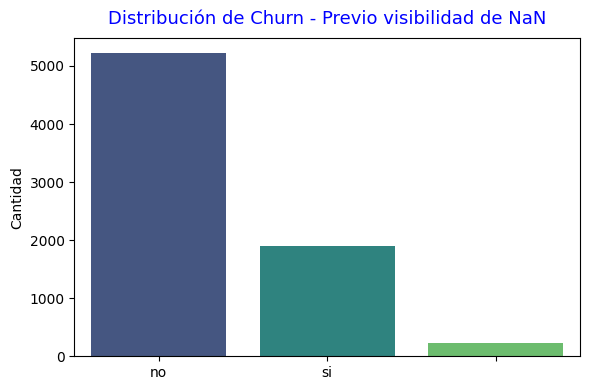

In [8]:
## Gráfica previo a poner visibles los valores NaN
plt.figure(figsize=(6, 4))
sns.countplot(data=datos_churn, x='Churn', palette='viridis')
plt.title('Distribución de Churn - Previo visibilidad de NaN', pad=10, fontdict={'fontsize': 13, 'color':'blue', 'fontweight': 'normal'})
plt.xlabel('')
plt.ylabel('Cantidad')
plt.tight_layout()
plt.show()

In [9]:
datos_churn['Churn'] = datos_churn['Churn'].replace(['None', None, 'null', 'NA', ''], np.nan)
datos_churn['Churn'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 7344 entries, 0 to 7343
Series name: Churn
Non-Null Count  Dtype 
--------------  ----- 
7118 non-null   object
dtypes: object(1)
memory usage: 57.5+ KB


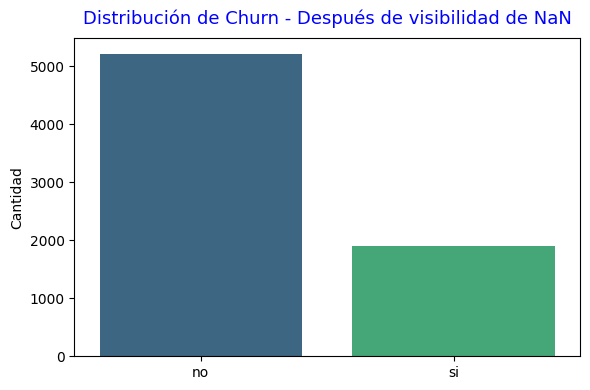

In [10]:
## Gráfica previo a poner visibles los valores NaN
plt.figure(figsize=(6, 4))
sns.countplot(data=datos_churn, x='Churn', palette='viridis')
plt.title('Distribución de Churn - Después de visibilidad de NaN', pad=10, fontdict={'fontsize': 13, 'color':'blue', 'fontweight': 'normal'})
plt.xlabel('')
plt.ylabel('Cantidad')
plt.tight_layout()
plt.show()

In [11]:
datos_churn['Churn'].value_counts()

,count
Churn,
no,5223
si,1895


In [12]:
datos_churn['Churn'].isnull().sum()

226

* Tenemos en totalidad 226 valores nulos en el dataframe con respecto a la variable CHURN.
* Después de analizar las demás variables, llegamos a la conclusión que esta variable al ser la variable objetivo, no podemos imputarla de manera aleatoria. Si bien es cierto se podría colocar como la moda, pero esto solo haría aumentar la cantidad de valores NO. Lo que requerimos en nuestro modelo posterior es determinar el valor SI, ya que implica que serían los que abandanarían la compañía.
* Por esta razón, decidimos eliminar estos valores nulos, dado que tenemos un dataset todavia amplio y 226 filas representan solo el 3% de todo el dataset.

In [13]:
# Eliminar las filas que tengan valores nulos en la columna 'Churn'
datos_churn = datos_churn.dropna(subset=['Churn'])

# Restablecer el índice para que sea consecutivo
datos_churn.reset_index(drop=True, inplace=True)

datos_churn['Churn'].isnull().sum()

0

In [14]:
datos_churn['Churn'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 7118 entries, 0 to 7117
Series name: Churn
Non-Null Count  Dtype 
--------------  ----- 
7118 non-null   object
dtypes: object(1)
memory usage: 55.7+ KB


* Conseguimos eliminar los valores nulos satisfactoriamente de nuestra variable objetivo.

### **2.2.1 Analizando valores duplicados**

In [15]:
## Validando la cantidad de datos del dataframe con un shape
datos_churn.shape

(7118, 21)

In [16]:
## Verificando cantidad de datos duplicados
datos_churn.duplicated().sum()

75

* Notamos que tenemos 75 valores duplicados en nuestro dataframe. Realizaremos un drop_duplicates a fin de eliminar estos valores.

In [17]:
## Realizamos eliminación de valores duplicados en nuestro dataframe
datos_churn = datos_churn.drop_duplicates()
datos_churn.reset_index(drop=True, inplace=True)
datos_churn.shape

(7043, 21)

* Observamos que se eliminaron correctamente los valores duplicados y reseteamos el índice para evitar complicaciones posteriores.

### **2.2.2 Analizando valores Nulos**

In [18]:
## Visualizando la cantidad de nulos existentes en el dataframe con su correspondiente categoría
columns_with_null = datos_churn.columns[datos_churn.isnull().any() == True]
datos_churn[columns_with_null].isnull().sum().sort_values(ascending=False).rename('Cantidad de nulos')

,Cantidad de nulos
cuenta.contrato,31
cuenta.metodo_pago,26
cuenta.facturacion_electronica,17
cuenta.cobros.mensual,17
cuenta.cobros.Total,15
cliente.tiempo_servicio,8


In [19]:
columns_with_null

Index(['cliente.tiempo_servicio', 'cuenta.contrato',
       'cuenta.facturacion_electronica', 'cuenta.metodo_pago',
       'cuenta.cobros.mensual', 'cuenta.cobros.Total'],
      dtype='object')

In [20]:
## Verificando los tipos de datos para las variables a analizar
datos_churn[columns_with_null].dtypes.rename('Tipos de datos')

,Tipos de datos
cliente.tiempo_servicio,float64
cuenta.contrato,object
cuenta.facturacion_electronica,object
cuenta.metodo_pago,object
cuenta.cobros.mensual,float64
cuenta.cobros.Total,object


In [21]:
## Verificando la correspondencia del tipo de dato con su variable respectiva
for i in columns_with_null:
  print('*****'*5)
  print(f'<<<-----{i}----->>>')
  print(datos_churn[i].unique())
  print('*****'*5)
  print('')

*************************
<<<-----cliente.tiempo_servicio----->>>
[9.00e+00 4.00e+00 1.30e+01 3.00e+00 7.10e+01 6.30e+01 7.00e+00      nan
 5.40e+01 7.20e+01 5.00e+00 5.60e+01 3.40e+01 1.00e+00 4.50e+01 5.00e+01
 2.30e+01 5.50e+01 2.60e+01 6.90e+01 3.70e+01 4.90e+01 6.60e+01 6.70e+01
 2.00e+01 4.30e+01 5.90e+01 1.20e+01 2.70e+01 2.00e+00 2.50e+01 2.90e+01
 1.40e+01 3.50e+01 6.40e+01 3.90e+01 4.00e+01 1.10e+01 6.00e+00 3.00e+01
 7.00e+01 5.70e+01 5.80e+01 1.60e+01 3.20e+01 3.30e+01 1.00e+01 2.10e+01
 6.10e+01 1.50e+01 4.40e+01 2.20e+01 2.40e+01 1.90e+01 4.70e+01 6.20e+01
 4.60e+01 5.20e+01 8.00e+00 6.00e+01 4.80e+01 2.80e+01 4.10e+01 5.30e+01
 6.80e+01 3.10e+01 3.60e+01 1.70e+01 1.80e+01 6.50e+01 5.10e+01 3.80e+01
 4.20e+01 0.00e+00 1.08e+03 1.00e+03 9.50e+02 2.54e+02 3.21e+02 6.50e+02
 7.21e+02 5.55e+02 4.33e+02 5.12e+02]
*************************

*************************
<<<-----cuenta.contrato----->>>
[None 'mensual' 'dos años' 'un año']
*************************

*****************

* Observamos que de todas estas variables, la única que no corresponde el tipo de datos es la variable **cuenta.cobros.Total**, en la cual se tendrá que corregir el tipo de dato de **object** a **float64**

In [22]:
# Convertir las columnas 'cuenta.cobros.Total' y 'cuenta.cobros.mensual' a numérico
datos_churn['cuenta.cobros.Total'] = pd.to_numeric(datos_churn['cuenta.cobros.Total'], errors='coerce')

In [23]:
## Observando los tipos de datos de mis columnas con nulos
datos_churn[columns_with_null].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 6 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   cliente.tiempo_servicio         7035 non-null   float64
 1   cuenta.contrato                 7012 non-null   object 
 2   cuenta.facturacion_electronica  7026 non-null   object 
 3   cuenta.metodo_pago              7017 non-null   object 
 4   cuenta.cobros.mensual           7026 non-null   float64
 5   cuenta.cobros.Total             7017 non-null   float64
dtypes: float64(3), object(3)
memory usage: 330.3+ KB


**<INS>GRÁFICA DE MATRIX DE NULOS</INS>**

<Axes: >

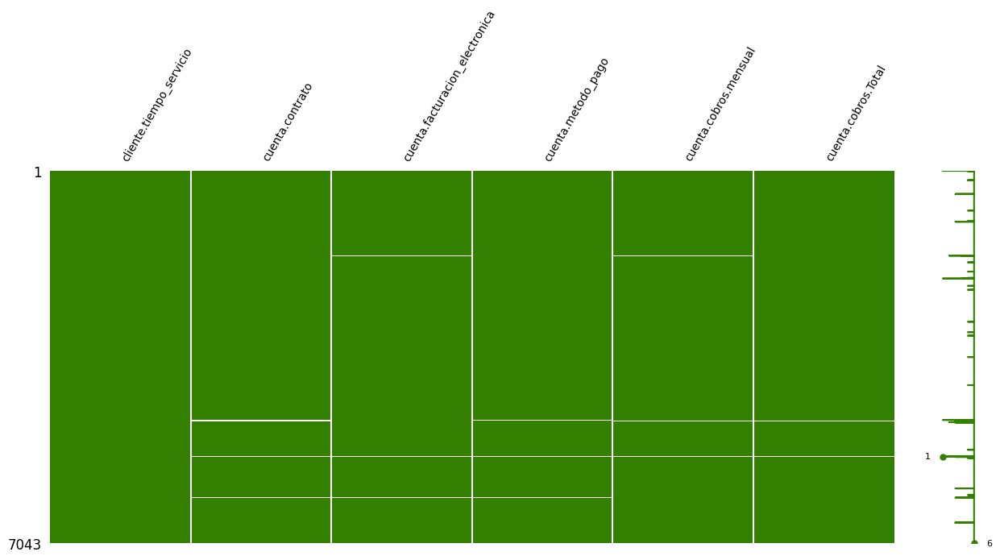

In [24]:
## Representando en gráfico nuestros valores nulos del dataframe
msno.matrix(datos_churn[columns_with_null], figsize=(15, 6), fontsize=10, color=(0.2, 0.5, 0), label_rotation=60)

In [25]:
# msno.bar(datos_churn[columns_with_null], figsize=(15, 10), fontsize=10, color=(0.2, 0.2, 0.4), label_rotation=60)

**<INS>GRÁFICA DE HEATMAP DE NULOS - CORRELACIÓN DE NULOS ENTRE VARIABLES</INS>**

<Axes: >

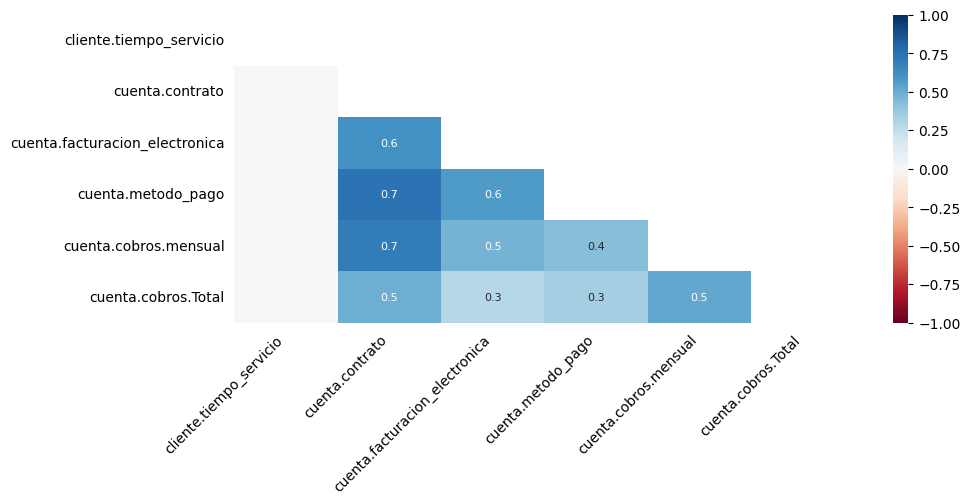

In [26]:
msno.heatmap(datos_churn, figsize=(10, 4), fontsize=10)

* Tanto en nuestra Matriz de Nulos como en nuestro Heatmap de correlación de valores nulos, observamos que casi todas las variables se relacionan entre nulos, es decir que en las mismas filas tenemos valores nulos para esas variables.
* Asimismo, observamos que la única variable que no tiene relación de nulos con las demás varaibles es **cliente.tiempo_servicio**, se empezará a analizar por esta variable a fin de ver si se puede imputar de alguna manera.

**<INS>GRÁFICA DE CORRELACIÓN DE NULOS ENTRE VARIABLES Y CANTIDAD DE NULOS POR VARIABLE</INS>**

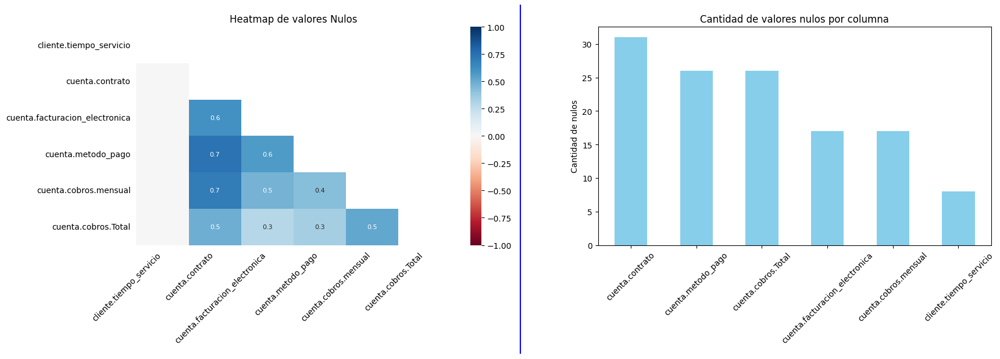

In [27]:
# Identificamos las columnas con valores nulos y calculamos la cantidad de nulos
columns_with_null = datos_churn.columns[datos_churn.isnull().any() == True]
null_counts = datos_churn[columns_with_null].isnull().sum().sort_values(ascending=False).rename('Cantidad de nulos')

# Creamos una figura con dos subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Graficamos el Heatmap de missingno en el primer subplot
ax1.set_title('Heatmap de valores Nulos')
msno.heatmap(datos_churn, ax=ax1, figsize=(10, 4), fontsize=10)

# Graficamos el Barplot para la cantidad de nulos por columna en el segundo subplot
null_counts.plot(kind='bar', ax=ax2, color='Skyblue', rot= 45)
ax2.set_title('Cantidad de valores nulos por columna')
ax2.set_ylabel('Cantidad de nulos')
ax2.set_xlabel('')

# Dibujar una línea de separación entre los gráficos
fig.subplots_adjust(wspace=100)  # Ajusta el espacio entre los subplots
fig.add_artist(plt.Line2D([0.5, 0.5], [0, 1], color='blue', linestyle='-'))  # Línea de separación

# Ajustamos el espaciado entre los subplots
plt.tight_layout()
plt.show()

* Podemos observar que tenemos 6 columnas con valores nulos, las cuales son: **'cliente.tiempo_servicio', 'cuenta.contrato',
'cuenta.facturacion_electronica', 'cuenta.metodo_pago',
'cuenta.cobros.mensual', 'cuenta.cobros.Total'**
* Notamos en el Heatmap, que muchas variables con nulos, están relacionadas entre sí, verificaremos si esta relación es a considerar.
* La variable **'cliente.tiempo_servicio'**, es la única que no tienen relación de nulos con las demás variables, esto quiere decir que en sus filas de nulos, no existen nulos para las otras variables.
* Notamos que **'cliente.tiempo_servicio'** es la variable que tiene menos cantidad de valores nulos en su composición.
* La variable **'cuenta.contrato'** es la variable que tiene mayor cantidad de nulos.

### **2.2.2.1 cliente.tiempo_servicio**

In [28]:
## Analizando los nulos en la variable 'cliente.tiempo_servicio'
datos_churn[datos_churn['cliente.tiempo_servicio'].isnull()][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
9,NaN,dos años,si,cheque,90.45,5957.90
176,NaN,mensual,si,cheque,29.30,355.90
181,NaN,mensual,si,tarjeta de credito (automatico),63.95,318.10
751,NaN,dos años,si,transferencia bancaria (automatica),101.05,5971.25
3523,NaN,dos años,no,transferencia bancaria (automatica),76.10,1054.80
5273,NaN,un año,no,cheque,20.60,116.60
5276,NaN,un año,si,transferencia bancaria (automatica),73.85,3581.40
6134,NaN,un año,no,transferencia bancaria (automatica),69.05,1958.45


* Notamos que si bien tiene valores nulos, estos se pueden imputar aplicando una fórmula, ya que podemos observar que:

  > **$cliente.tiempo\_servicio \times cuenta.cobros.mensual = cuenta.cobros.Total$**

In [29]:
## Consiguiendo los índices de las filas de valores nulos para esta variable
idx = datos_churn[datos_churn['cliente.tiempo_servicio'].isnull()][columns_with_null].index
idx

Index([9, 176, 181, 751, 3523, 5273, 5276, 6134], dtype='int64')

In [30]:
## Aplicando la fórmula planteada e imputando los valores nulos de esta columna
# datos_churn.iloc[idx]['cliente.tiempo_servicio'] = datos_churn.iloc[idx]['cuenta.cobros.Total'] // datos_churn.iloc[idx]['cuenta.cobros.mensual']
datos_churn['cliente.tiempo_servicio'].fillna(datos_churn['cuenta.cobros.Total'] // datos_churn['cuenta.cobros.mensual'], inplace=True)
datos_churn['cliente.tiempo_servicio'].isnull().sum()

0

In [31]:
datos_churn.iloc[idx][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
9,65.0,dos años,si,cheque,90.45,5957.90
176,12.0,mensual,si,cheque,29.30,355.90
181,4.0,mensual,si,tarjeta de credito (automatico),63.95,318.10
751,59.0,dos años,si,transferencia bancaria (automatica),101.05,5971.25
3523,13.0,dos años,no,transferencia bancaria (automatica),76.10,1054.80
5273,5.0,un año,no,cheque,20.60,116.60
5276,48.0,un año,si,transferencia bancaria (automatica),73.85,3581.40
6134,28.0,un año,no,transferencia bancaria (automatica),69.05,1958.45


* Notamos que la imputación se desarrolló de manera satisfactoria.

In [32]:
datos_churn[columns_with_null].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 6 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   cliente.tiempo_servicio         7043 non-null   float64
 1   cuenta.contrato                 7012 non-null   object 
 2   cuenta.facturacion_electronica  7026 non-null   object 
 3   cuenta.metodo_pago              7017 non-null   object 
 4   cuenta.cobros.mensual           7026 non-null   float64
 5   cuenta.cobros.Total             7017 non-null   float64
dtypes: float64(3), object(3)
memory usage: 330.3+ KB


* La variable **cliente.tiempo_servicio** ya no presenta valores nulos.

### **2.2.2.2 cuenta.cobros.mensual y cuenta.cobros.Total**

* Ahora analizaremos las columnas **cuenta.cobros.mensual y cuenta.cobros.mensual**, ya que tienen relación de 0.7 en el **Heatmap**, lo cual es elevado. Validaremos si se puede imputar o eliminar. Haremos correspondendia con la fórmula planteada y si no se pudiera conseguir algún valor se vería la posibilidad de eliminar la fila.

In [33]:
## Verificando los valores nulos en 'cuenta.cobros.Total'
datos_churn[datos_churn['cuenta.cobros.Total'].isnull()][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,9.0,None,None,None,NaN,NaN
945,0.0,dos años,no,tarjeta de credito (automatico),56.05,NaN
1604,18.0,None,no,None,20.05,NaN
1605,23.0,None,no,None,NaN,NaN
1606,55.0,None,si,tarjeta de credito (automatico),NaN,NaN
1731,0.0,dos años,no,cheque,20.00,NaN
1906,0.0,dos años,si,transferencia bancaria (automatica),61.90,NaN
2025,0.0,dos años,si,cheque,19.70,NaN
2037,40.0,None,None,None,NaN,NaN
2176,0.0,dos años,no,cheque,20.25,NaN


In [34]:
## Verificando los valores nulos en 'cuenta.cobros.mensual'
datos_churn[datos_churn['cuenta.cobros.mensual'].isnull()][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,9.0,None,None,None,NaN,NaN
437,67.0,None,None,tarjeta de credito (automatico),NaN,6886.25
963,21.0,None,si,None,NaN,1565.70
1605,23.0,None,no,None,NaN,NaN
1606,55.0,None,si,tarjeta de credito (automatico),NaN,NaN
1608,9.0,mensual,None,cheque,NaN,890.60
2037,40.0,None,None,None,NaN,NaN
4712,5.0,None,None,None,NaN,NaN
4716,62.0,None,si,cheque electronico,NaN,NaN
4721,1.0,None,si,transferencia bancaria (automatica),NaN,NaN


* Nos damos cuenta que hay varias filas con valores nulos, tienen relación entre estas dos variables. Realizando nuestro análisis, entendemos que si no podemos tener al menos uno de estos valores, no podremos conseguir el otro, es por eso que decidiremos eliminar las filas que tengan a ambos con valores nulos.
* Se analizarán los índices de las filas de los valores nulos para cada variable y se desarrollará una intersección.

In [35]:
## Índices de las filas con valores nulos para la variable 'cuenta.cobros.Total'
idx_total_null = datos_churn[datos_churn['cuenta.cobros.Total'].isnull() == True].index
idx_total_null

Index([   0,  945, 1604, 1605, 1606, 1731, 1906, 2025, 2037, 2176, 2250, 2855,
       3052, 3118, 4054, 4712, 4716, 4721, 4728, 4731, 4733, 4745, 4755, 5402,
       5404, 5433],
      dtype='int64')

In [36]:
## Índices de las filas con valores nulos para la variable 'cuenta.cobros.mensual'
idx_mensual_null = datos_churn[datos_churn['cuenta.cobros.mensual'].isnull() == True].index
idx_mensual_null

Index([   0,  437,  963, 1605, 1606, 1608, 2037, 4712, 4716, 4721, 4733, 4755,
       5397, 5402, 5404, 5410, 6007],
      dtype='int64')

In [37]:
## Consiguiendo las filas con nulos en ambas columnas
idx_combined = []
for i in idx_mensual_null:
  if i in idx_total_null:
    idx_combined.append(i)
idx_combined

[0, 1605, 1606, 2037, 4712, 4716, 4721, 4733, 4755, 5402, 5404]

In [38]:
datos_churn.iloc[idx_combined][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,9.0,None,None,None,NaN,NaN
1605,23.0,None,no,None,NaN,NaN
1606,55.0,None,si,tarjeta de credito (automatico),NaN,NaN
2037,40.0,None,None,None,NaN,NaN
4712,5.0,None,None,None,NaN,NaN
4716,62.0,None,si,cheque electronico,NaN,NaN
4721,1.0,None,si,transferencia bancaria (automatica),NaN,NaN
4733,56.0,None,si,cheque electronico,NaN,NaN
4755,18.0,None,no,None,NaN,NaN
5402,22.0,None,no,transferencia bancaria (automatica),NaN,NaN


In [39]:
## Eliminado las filas que tienen nulos en ambas columnas
datos_churn.drop(idx_combined, inplace=True)
datos_churn.reset_index(drop=True, inplace=True)

In [40]:
datos_churn[columns_with_null].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 6 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   cliente.tiempo_servicio         7032 non-null   float64
 1   cuenta.contrato                 7012 non-null   object 
 2   cuenta.facturacion_electronica  7019 non-null   object 
 3   cuenta.metodo_pago              7012 non-null   object 
 4   cuenta.cobros.mensual           7026 non-null   float64
 5   cuenta.cobros.Total             7017 non-null   float64
dtypes: float64(3), object(3)
memory usage: 329.8+ KB


* Observamos que se eliminaron las filas con nulos en ambas columnas satisfactoriamente.
* Vemos que tenemos menos valores nulos a analizar en esas columnas.

>>> <ins>**cuenta.cobros.mensual**</ins>

In [41]:
datos_churn[datos_churn['cuenta.cobros.mensual'].isnull()==True][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
436,67.0,None,None,tarjeta de credito (automatico),NaN,6886.25
962,21.0,None,si,None,NaN,1565.70
1605,9.0,mensual,None,cheque,NaN,890.60
5388,45.0,None,None,None,NaN,4368.85
5399,56.0,None,si,None,NaN,4824.45
5996,62.0,None,None,transferencia bancaria (automatica),NaN,7159.05


* Aplicando la fórmula:
  > **$cliente.tiempo\_servicio \times cuenta.cobros.mensual = cuenta.cobros.Total$**

In [42]:
idx_cobros_mensual_null = datos_churn[datos_churn['cuenta.cobros.mensual'].isnull() == True].index
idx_cobros_mensual_null

Index([436, 962, 1605, 5388, 5399, 5996], dtype='int64')

In [43]:
datos_churn['cuenta.cobros.mensual'].fillna(round(datos_churn['cuenta.cobros.Total'] / datos_churn['cliente.tiempo_servicio'],2), inplace=True)

In [44]:
datos_churn.iloc[idx_cobros_mensual_null][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
436,67.0,None,None,tarjeta de credito (automatico),102.78,6886.25
962,21.0,None,si,None,74.56,1565.70
1605,9.0,mensual,None,cheque,98.96,890.60
5388,45.0,None,None,None,97.09,4368.85
5399,56.0,None,si,None,86.15,4824.45
5996,62.0,None,None,transferencia bancaria (automatica),115.47,7159.05


In [45]:
datos_churn[columns_with_null].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 6 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   cliente.tiempo_servicio         7032 non-null   float64
 1   cuenta.contrato                 7012 non-null   object 
 2   cuenta.facturacion_electronica  7019 non-null   object 
 3   cuenta.metodo_pago              7012 non-null   object 
 4   cuenta.cobros.mensual           7032 non-null   float64
 5   cuenta.cobros.Total             7017 non-null   float64
dtypes: float64(3), object(3)
memory usage: 329.8+ KB


* Observamos que **cuenta.cobros.mensual** ya se encuentra imputada.
* Ahora validaremos **cuenta.cobros.Total**

>>> <ins>**cuenta.cobros.Total**</ins>

In [46]:
datos_churn[datos_churn['cuenta.cobros.Total'].isnull()==True][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
944,0.0,dos años,no,tarjeta de credito (automatico),56.05,NaN
1603,18.0,None,no,None,20.05,NaN
1728,0.0,dos años,no,cheque,20.00,NaN
1903,0.0,dos años,si,transferencia bancaria (automatica),61.90,NaN
2022,0.0,dos años,si,cheque,19.70,NaN
2172,0.0,dos años,no,cheque,20.25,NaN
2246,0.0,dos años,no,cheque,25.35,NaN
2851,0.0,dos años,no,cheque,73.35,NaN
3048,0.0,dos años,no,cheque,25.75,NaN
3114,0.0,dos años,si,transferencia bancaria (automatica),52.55,NaN


* Notamos algo interesante para estas filas con valores nulos en **cuenta.cobros.Total**, la variable **cliente.tiempo_servicio** figura con valor **0.0**, lo cual no es correcto.
* Analizaremos en que índices figura este valor para nuestra variable **cliente.tiempo_servicio**

In [47]:
## Analizando cuando nuestra variable 'cliente.tiempo_servicio' == 0.0
datos_churn[datos_churn['cliente.tiempo_servicio'] == 0.0][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
944,0.0,dos años,no,tarjeta de credito (automatico),56.05,NaN
1728,0.0,dos años,no,cheque,20.00,NaN
1903,0.0,dos años,si,transferencia bancaria (automatica),61.90,NaN
2022,0.0,dos años,si,cheque,19.70,NaN
2172,0.0,dos años,no,cheque,20.25,NaN
2246,0.0,dos años,no,cheque,25.35,NaN
2851,0.0,dos años,no,cheque,73.35,NaN
3048,0.0,dos años,no,cheque,25.75,NaN
3114,0.0,dos años,si,transferencia bancaria (automatica),52.55,NaN
4050,0.0,dos años,no,cheque,80.85,NaN


* Observamos que para todos estos valores de **'cliente.tiempo_servicio' == 0-0**, tenemos que la **cuenta.contrato** es de **dos años**, lo cual nos indica que podríamos corregir estos valores ayudandonos de esta variable, ya que podemos decir que el tiempo de servicio seria de 24 meses, al estar esta variable en meses.

In [48]:
# ## Analizando
# datos_churn[(datos_churn['cuenta.contrato'] == 'dos años') & (datos_churn['cliente.tiempo_servicio'] == 0.0)][columns_with_null]

In [49]:
idx_cliente_tiempo_servicio_zero = datos_churn[datos_churn['cliente.tiempo_servicio'] == 0.0].index
idx_cliente_tiempo_servicio_zero

Index([944, 1728, 1903, 2022, 2172, 2246, 2851, 3048, 3114, 4050, 5422], dtype='int64')

In [50]:
# Usar .loc para modificar directamente el DataFrame original
datos_churn.loc[idx_cliente_tiempo_servicio_zero, 'cliente.tiempo_servicio'] = datos_churn.loc[idx_cliente_tiempo_servicio_zero, 'cliente.tiempo_servicio'] + 24.0
datos_churn.iloc[idx_cliente_tiempo_servicio_zero]['cliente.tiempo_servicio']

,cliente.tiempo_servicio
944,24.0
1728,24.0
1903,24.0
2022,24.0
2172,24.0
2246,24.0
2851,24.0
3048,24.0
3114,24.0
4050,24.0


In [51]:
## Volvemos al dataframe inicial de nulos para cuenta.cobros.Total
datos_churn[datos_churn['cuenta.cobros.Total'].isnull()==True][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
944,24.0,dos años,no,tarjeta de credito (automatico),56.05,NaN
1603,18.0,None,no,None,20.05,NaN
1728,24.0,dos años,no,cheque,20.00,NaN
1903,24.0,dos años,si,transferencia bancaria (automatica),61.90,NaN
2022,24.0,dos años,si,cheque,19.70,NaN
2172,24.0,dos años,no,cheque,20.25,NaN
2246,24.0,dos años,no,cheque,25.35,NaN
2851,24.0,dos años,no,cheque,73.35,NaN
3048,24.0,dos años,no,cheque,25.75,NaN
3114,24.0,dos años,si,transferencia bancaria (automatica),52.55,NaN


* Aplicando la fórmula:
  > **$cliente.tiempo\_servicio \times cuenta.cobros.mensual = cuenta.cobros.Total$**

In [52]:
idx_cobros_total_null = datos_churn[datos_churn['cuenta.cobros.Total'].isnull() == True].index
idx_cobros_total_null

Index([ 944, 1603, 1728, 1903, 2022, 2172, 2246, 2851, 3048, 3114, 4050, 4721,
       4724, 4737, 5422],
      dtype='int64')

In [53]:
datos_churn['cuenta.cobros.Total'].fillna(round(datos_churn['cliente.tiempo_servicio'] * datos_churn['cuenta.cobros.mensual'],2), inplace=True)

In [54]:
datos_churn.iloc[idx_cobros_total_null][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
944,24.0,dos años,no,tarjeta de credito (automatico),56.05,1345.2
1603,18.0,None,no,None,20.05,360.9
1728,24.0,dos años,no,cheque,20.00,480.0
1903,24.0,dos años,si,transferencia bancaria (automatica),61.90,1485.6
2022,24.0,dos años,si,cheque,19.70,472.8
2172,24.0,dos años,no,cheque,20.25,486.0
2246,24.0,dos años,no,cheque,25.35,608.4
2851,24.0,dos años,no,cheque,73.35,1760.4
3048,24.0,dos años,no,cheque,25.75,618.0
3114,24.0,dos años,si,transferencia bancaria (automatica),52.55,1261.2


In [55]:
datos_churn[columns_with_null].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 6 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   cliente.tiempo_servicio         7032 non-null   float64
 1   cuenta.contrato                 7012 non-null   object 
 2   cuenta.facturacion_electronica  7019 non-null   object 
 3   cuenta.metodo_pago              7012 non-null   object 
 4   cuenta.cobros.mensual           7032 non-null   float64
 5   cuenta.cobros.Total             7032 non-null   float64
dtypes: float64(3), object(3)
memory usage: 329.8+ KB


* Notamos que la variable **cuenta.cobros.Total** ya no tiene valores nulos.
* Todavía tenemos 3 variables que tenemos que analizar sus valores nulos.

### **2.2.1.3 Valores Atípicos - Outliers**

* Antes de continuar con la imputación de las demás variables, realizaremos el análisis de los valores atípicos de nuestro dataset.
* Esto debido a que para las otras variables con valores nulos, tendremos que realizar correlaciones a fin de imputar por métodos de KNN y Árboles de decisión.

In [56]:
datos_churn.describe()

,cliente.anciano,cliente.tiempo_servicio,cuenta.cobros.mensual,cuenta.cobros.Total
count,7032.000000,7032.000000,7032.000000,7032.000000
mean,0.162116,33.295648,64.752426,2319.592200
std,0.368583,35.273030,30.091303,2874.845725
min,0.000000,1.000000,18.250000,18.800000
25%,0.000000,9.000000,35.487500,402.362500
50%,0.000000,29.000000,70.350000,1396.125000
75%,0.000000,56.000000,89.850000,3792.325000
max,1.000000,1080.000000,118.750000,112212.000000


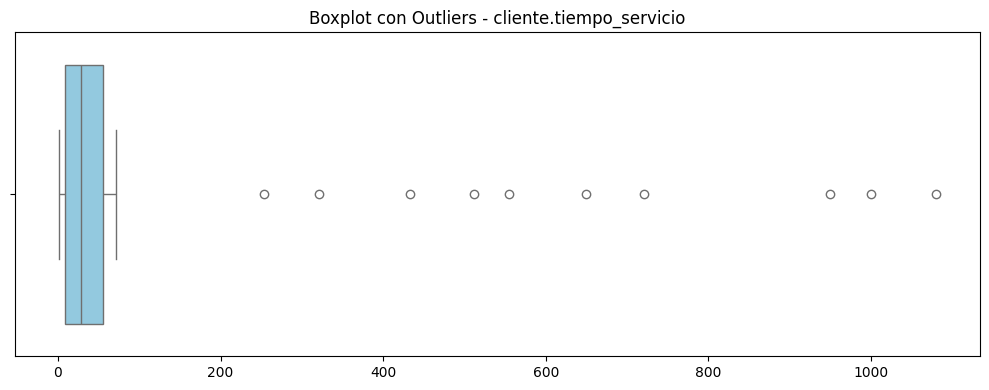

In [57]:
plt.figure(figsize=(10, 4))
sns.boxplot(data=datos_churn, x='cliente.tiempo_servicio',color='skyblue')
plt.title('Boxplot con Outliers - cliente.tiempo_servicio')
plt.xlabel('')
plt.tight_layout()
plt.show()

In [58]:
datos_churn.describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.80,0.85,0.90,0.925, 0.95, 0.97,0.98, 0.99, 0.995])

,cliente.anciano,cliente.tiempo_servicio,cuenta.cobros.mensual,cuenta.cobros.Total
count,7032.000000,7032.000000,7032.000000,7032.000000
mean,0.162116,33.295648,64.752426,2319.592200
std,0.368583,35.273030,30.091303,2874.845725
min,0.000000,1.000000,18.250000,18.800000
5%,0.000000,1.000000,19.650000,49.650000
25%,0.000000,9.000000,35.487500,402.362500
50%,0.000000,29.000000,70.350000,1396.125000
75%,0.000000,56.000000,89.850000,3792.325000
80%,0.000000,61.000000,94.250000,4478.260000
85%,1.000000,65.000000,98.550000,5202.812500


* Notamos que en cliente.tiempo_servicio existe unos valores atípicos muy grandes, se observa al analizar los percentiles, asi como la gráfica boxplot.
* Se decide eliminar estos valores atípicos, ya que si solo se truncan, tendríamos que corregir los demás valores de las otras columnas y podría generar inconvenientes posteriores.
* Decidimos eliminar los valores que sean mayores de 72, que es donde observamos en el percentil 99%, de esta manera tratamos de mantener el máximo de valores posibles del dataset.

In [59]:
datos_churn[datos_churn['cliente.tiempo_servicio']>72][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
1949,1080.0,un año,no,tarjeta de credito (automatico),103.90,112212.00
1950,1000.0,mensual,si,cheque electronico,45.90,45900.00
1956,950.0,mensual,no,cheque electronico,84.10,79895.00
1960,254.0,mensual,no,transferencia bancaria (automatica),46.05,80.35
1962,321.0,mensual,si,cheque electronico,99.80,4259.30
1967,650.0,un año,si,cheque electronico,73.00,47450.00
1970,721.0,mensual,si,cheque,89.55,3856.75
1974,555.0,un año,no,cheque,19.15,124.40
1977,433.0,mensual,si,cheque electronico,89.20,346.20
1978,512.0,mensual,no,cheque,19.55,19.55


* Si bien se podrían corregir algunos valores, consideramos que sería estar adivinando los valores de cliente.tiempo_servicio, es por eso que decidimos eliminar estos valores que serían Outliers, por más que en las demás variables se tenga valores a considerar.

In [60]:
datos_churn[datos_churn['cliente.tiempo_servicio']>72][columns_with_null].index

Index([1949, 1950, 1956, 1960, 1962, 1967, 1970, 1974, 1977, 1978], dtype='int64')

In [61]:
datos_churn.drop(datos_churn[datos_churn['cliente.tiempo_servicio']>72][columns_with_null].index, inplace=True)
datos_churn.reset_index(drop=True, inplace=True)

In [62]:
datos_churn.describe()

,cliente.anciano,cliente.tiempo_servicio,cuenta.cobros.mensual,cuenta.cobros.Total
count,7022.000000,7022.000000,7022.000000,7022.000000
mean,0.161777,32.420820,64.749197,2281.006665
std,0.368273,24.534421,30.090856,2265.759951
min,0.000000,1.000000,18.250000,18.800000
25%,0.000000,9.000000,35.462500,402.600000
50%,0.000000,29.000000,70.350000,1395.525000
75%,0.000000,55.000000,89.850000,3781.512500
max,1.000000,72.000000,118.750000,8684.800000


* COmo observamos, ya quedo corregido el dataset, sin outliers posibles.
* COmo no eran demasiados outliers, decidimos eliminarlos y asi no complicarnos posteriormente corrigiendo otras variables relacionadas.

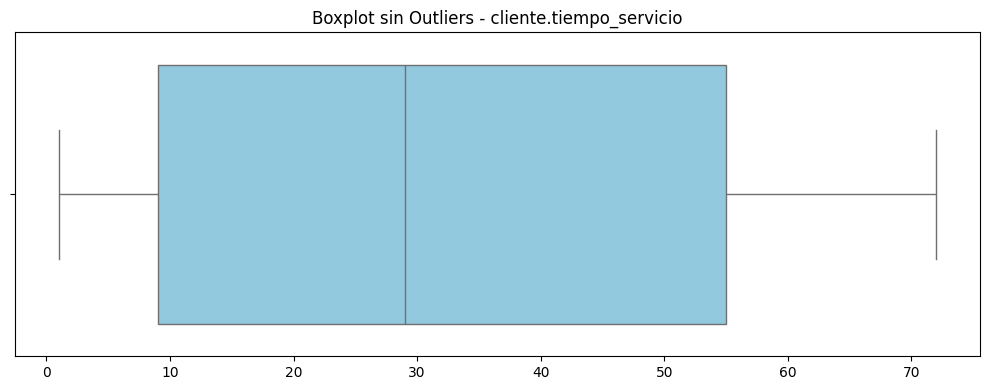

In [63]:
## Gráfica después de tratar los valores atípicos
plt.figure(figsize=(10, 4))
sns.boxplot(data=datos_churn, x='cliente.tiempo_servicio',color='skyblue')
plt.title('Boxplot sin Outliers - cliente.tiempo_servicio')
plt.xlabel('')
plt.tight_layout()
plt.show()

### **2.2.2.4 cuenta.facturacion_electronica, cuenta.metodo_pago y cuenta.contrato**

>>> <ins>**cuenta.facturacion_electronica**</ins>

In [64]:
datos_churn[datos_churn['cuenta.facturacion_electronica'].isnull()==True][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
436,67.0,None,None,tarjeta de credito (automatico),102.78,6886.25
1605,9.0,mensual,None,cheque,98.96,890.60
2025,50.0,None,None,cheque,103.05,5153.50
4711,72.0,None,None,tarjeta de credito (automatico),83.55,6015.60
4727,60.0,dos años,None,None,20.95,1257.00
4731,5.0,mensual,None,None,78.95,378.40
4743,1.0,None,None,None,43.30,43.30
5378,45.0,None,None,None,97.09,4368.85
5391,6.0,None,None,None,19.70,111.65
5986,62.0,None,None,transferencia bancaria (automatica),115.47,7159.05


In [65]:
datos_churn['cuenta.facturacion_electronica'].unique()

array(['no', 'si', None], dtype=object)

In [66]:
datos_churn['cuenta.facturacion_electronica'].isnull().sum()

13

* Sabemos que la facturación electrónica es si el cliente quiere recibir el recibo en línea o no. Por ende el valor de None, entendemos que es porque no hay referencia de este dato.
* Dada esta situación, y tratandose de un aspecto binario y de decisión del cliente que quizás no se pudo conseguir, trataremos de analizar las cantidad que tenemos en nuestra base de datos para estas subcategorías.
* Decidimos imputar estos valores con el **most frecuente (moda)**, debido a que la cantidad de nulos que se tiene en esta variable es pequeña comparado con el dataset total y consideramos no afectaría en gran medida realizar este ajuste. Además, se tienen valores numéricos en otras variables para estos índices, por ende eliminarlos, quizás no sea la mejor opción, ya que podemos utilizar los demás datos para nuestro modelo.

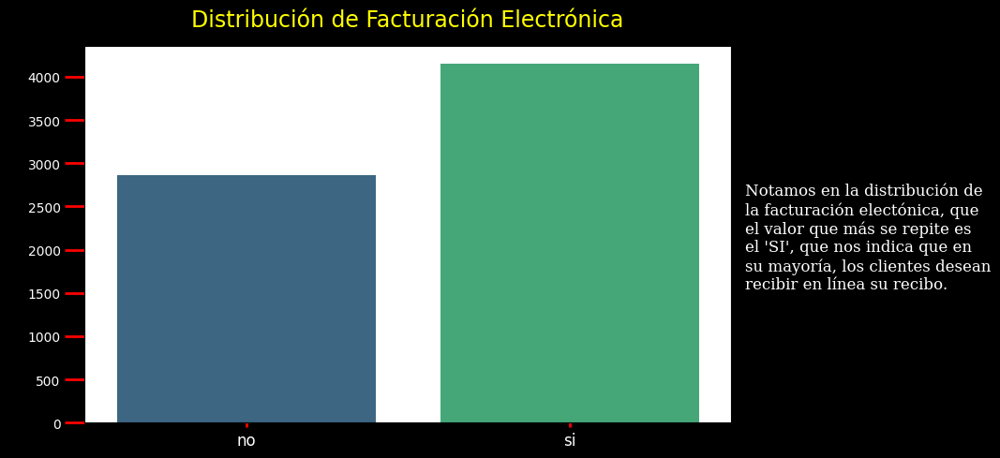

In [67]:
plt.figure(figsize=(8, 5))
sns.countplot(data=datos_churn, x='cuenta.facturacion_electronica', palette='viridis')

# Añadir texto de conclusión
conclusion_text = '''
Notamos en la distribución de
la facturación electónica, que
el valor que más se repite es
el 'SI', que nos indica que en
su mayoría, los clientes desean
recibir en línea su recibo.'''

plt.figtext(1, 0.5, conclusion_text, fontdict={'fontsize': 12, 'fontfamily':'serif', 'fontstyle':'normal', 'fontweight': 'normal', 'color': 'white'}, va='center', ha='left')

# Establecer el color de fondo del gráfico
plt.gcf().set_facecolor('black')

# Cambiar el color de las etiquetas en el eje x - y
plt.tick_params(axis='y', labelcolor='white', width=2, length = 15, colors='r', grid_color='r',grid_alpha=0.2)
plt.tick_params(axis='x', labelcolor='white', width=2, labelsize='large', colors='r', grid_color='r',grid_alpha=0.2)

# # Agregar los porcentajes sobre las barras
# for bar in bars.patches:
#     width = bar.get_width()
#     height = bar.get_height()
#     y = bar.get_y()
#     media = bar.get_y() + bar.get_height() / 2
#     # print((width, height, y, media))
#     percentage = f'{100 * width / total:.1f}%'
#     plt.text(width, media, percentage,  # Ajustando posición horizontal y vertical
#               ha='left', va='center', color='black')  #, fontweight='bold'

plt.title('Distribución de Facturación Electrónica', pad=15, fontdict={'fontsize': 17, 'color':'yellow', 'fontweight': 'normal'})
plt.xlabel('')
plt.ylabel('Cantidad')

plt.tight_layout()
plt.show()

In [68]:
datos_churn['cuenta.facturacion_electronica'].value_counts()

,count
cuenta.facturacion_electronica,
si,4150
no,2859


In [69]:
datos_churn['cuenta.facturacion_electronica'].mode()[0]

'si'

In [70]:
## consiguiendo los índices con valores nulos en esta variable, para validar posterior a la imputación
idx_facturacion_electronica_null = datos_churn[datos_churn['cuenta.facturacion_electronica'].isnull() == True].index
idx_facturacion_electronica_null

Index([436, 1605, 2025, 4711, 4727, 4731, 4743, 5378, 5391, 5986, 6160, 6631,
       6634],
      dtype='int64')

In [71]:
datos_churn['cuenta.facturacion_electronica'].fillna(datos_churn['cuenta.facturacion_electronica'].mode()[0], inplace=True)

In [72]:
datos_churn.iloc[idx_facturacion_electronica_null][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
436,67.0,None,si,tarjeta de credito (automatico),102.78,6886.25
1605,9.0,mensual,si,cheque,98.96,890.60
2025,50.0,None,si,cheque,103.05,5153.50
4711,72.0,None,si,tarjeta de credito (automatico),83.55,6015.60
4727,60.0,dos años,si,None,20.95,1257.00
4731,5.0,mensual,si,None,78.95,378.40
4743,1.0,None,si,None,43.30,43.30
5378,45.0,None,si,None,97.09,4368.85
5391,6.0,None,si,None,19.70,111.65
5986,62.0,None,si,transferencia bancaria (automatica),115.47,7159.05


* Observamos que nuestra imputación por la moda se realizó de manera satisfactoria.

In [73]:
datos_churn[columns_with_null].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7022 entries, 0 to 7021
Data columns (total 6 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   cliente.tiempo_servicio         7022 non-null   float64
 1   cuenta.contrato                 7002 non-null   object 
 2   cuenta.facturacion_electronica  7022 non-null   object 
 3   cuenta.metodo_pago              7002 non-null   object 
 4   cuenta.cobros.mensual           7022 non-null   float64
 5   cuenta.cobros.Total             7022 non-null   float64
dtypes: float64(3), object(3)
memory usage: 329.3+ KB


* Solo nos quedan dos variables a analizar sus valores nulos

>>> <ins>**cuenta.metodo_pago**</ins>

* En este caso, al ser variables categóricas, decidimos evaluar bien nuestro dataset y ver de que forma se le puede imputar, podría ser la moda, o alguna relación entre filas.
* De no encontrar algo óptimo, decidiremos eliminar las filas, pero como última opción.

In [74]:
datos_churn['cuenta.metodo_pago'].unique()

array(['cheque', 'cheque electronico', 'tarjeta de credito (automatico)',
       'transferencia bancaria (automatica)', None], dtype=object)

In [75]:
idx_metodo_null = datos_churn[datos_churn['cuenta.metodo_pago'].isnull() == True].index
idx_metodo_null

Index([ 962, 1603, 2023, 4702, 4708, 4714, 4720, 4722, 4727, 4731, 4733, 4743,
       5378, 5389, 5391, 5394, 6160, 6631, 6634, 6635],
      dtype='int64')

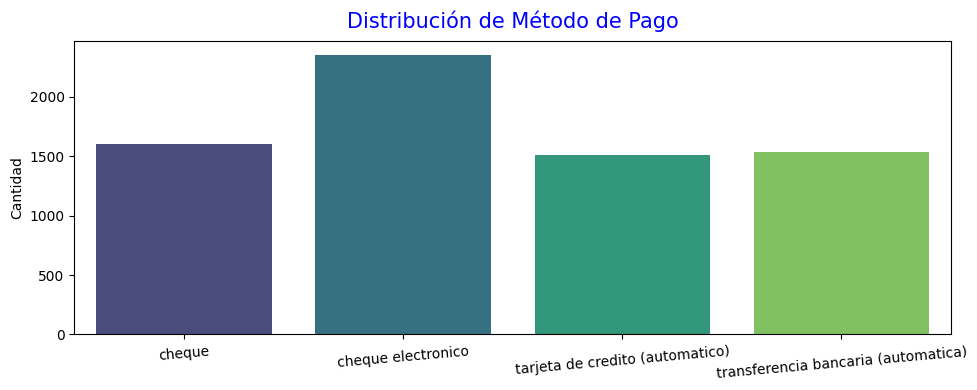

In [76]:
plt.figure(figsize=(10, 4))
sns.countplot(data=datos_churn, x='cuenta.metodo_pago', palette='viridis')
plt.title('Distribución de Método de Pago', pad=10, fontdict={'fontsize': 15, 'color':'Blue', 'fontweight': 'normal'})
plt.xlabel('')
plt.xticks(rotation=5)
plt.ylabel('Cantidad')
plt.tight_layout()
plt.show()

In [77]:
datos_churn.iloc[idx_metodo_null][list(columns_with_null) + ['Churn']]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total,Churn
962,21.0,None,si,None,74.56,1565.70,si
1603,18.0,None,no,None,20.05,360.90,no
2023,13.0,mensual,si,None,59.90,788.35,no
4702,30.0,None,no,None,110.45,3327.05,no
4708,1.0,None,si,None,70.30,70.30,si
4714,42.0,None,si,None,104.75,4399.50,si
4720,43.0,None,si,None,104.60,4759.85,si
4722,56.0,dos años,no,None,59.50,3389.25,no
4727,60.0,dos años,si,None,20.95,1257.00,no
4731,5.0,mensual,si,None,78.95,378.40,si


In [78]:
from scipy.stats import chi2_contingency

# Creamos una tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn['Churn'], datos_churn['cuenta.metodo_pago'])

# Realizamos la prueba de chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_contingencia)

# Imprimimimos el valor **p** para ver si la relación es significativa
print(f'Valor p: {p}')

# Si el valor p es pequeño (por ejemplo, < 0.05), entonces hay una relación significativa
if p < 0.05:
    print(f'Existe una relación significativa entre Churn y cuenta metodo_pago')
    print('*****'*5)
else:
    print(f'No hay relación significativa entre Churn y cuenta metodo_pago')
    print('*****'*5)

################################################################################
################################################################################

# Creamos una tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn['Churn'], datos_churn['cuenta.contrato'])

# Realizamos la prueba de chi-cuadrado
chi2, p, dof, expected = chi2_contingency(tabla_contingencia)

# Imprimimimos el valor **p** para ver si la relación es significativa
print(f'Valor p: {p}')

# Si el valor p es pequeño (por ejemplo, < 0.05), entonces hay una relación significativa
if p < 0.05:
    print(f'Existe una relación significativa entre Churn y cuenta contrato')
    print('*****'*5)
else:
    print(f'No hay relación significativa entre Churn y cuenta contrato')
    print('*****'*5)

Valor p: 1.4552636966710934e-138
Existe una relación significativa entre Churn y cuenta metodo_pago
*************************
Valor p: 3.7802691142460995e-257
Existe una relación significativa entre Churn y cuenta contrato
*************************


* Debido a que poseo más valores NO en CHURN que valores SI, y considerando que existe una relación significativa entre la variable objetivo con las variables contrato y metodo_pago, decidimos eliminar cuando el CHURN sea NO y existan valores NONE en las otras columnas. Esto porque tengo más valores NO en variable objetivo.
* No eliminamos el CHURN cuando es SI, ya que al tener relación significativa, puede ser de gran utilidad al momento de realizar el análisis, y como quedarían menos variables a imputar, el sesgo sería menor.

In [79]:
## Consiguiendo para los índices donde tengo nulos en método_pago, que sea CHURN NO
df = datos_churn.loc[idx_metodo_null][datos_churn.loc[idx_metodo_null]['Churn'] == 'no'][columns_with_null]
df

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
1603,18.0,None,no,None,20.05,360.90
2023,13.0,mensual,si,None,59.90,788.35
4702,30.0,None,no,None,110.45,3327.05
4722,56.0,dos años,no,None,59.50,3389.25
4727,60.0,dos años,si,None,20.95,1257.00
4733,62.0,None,si,None,84.95,5150.55
5378,45.0,None,si,None,97.09,4368.85
5389,56.0,None,si,None,86.15,4824.45
5391,6.0,None,si,None,19.70,111.65
6160,19.0,None,si,None,19.90,357.70


In [80]:
## Ahora validamos que metodo_pago y contrato, ambos sean NONE
df[(df['cuenta.metodo_pago'].isnull() == True) & (df['cuenta.contrato'].isnull() == True)]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
1603,18.0,None,no,None,20.05,360.90
4702,30.0,None,no,None,110.45,3327.05
4733,62.0,None,si,None,84.95,5150.55
5378,45.0,None,si,None,97.09,4368.85
5389,56.0,None,si,None,86.15,4824.45
5391,6.0,None,si,None,19.70,111.65
6160,19.0,None,si,None,19.90,357.70
6634,26.0,None,si,None,82.00,2083.10
6635,35.0,None,si,None,89.65,3161.60


In [81]:
## Conseguimos los índices para eliminar estas filas y reseteamos el índice
idx_new_drop = df[(df['cuenta.metodo_pago'].isnull() == True) & (df['cuenta.contrato'].isnull() == True)].index
idx_new_drop

Index([1603, 4702, 4733, 5378, 5389, 5391, 6160, 6634, 6635], dtype='int64')

In [82]:
## Eliminamos las filas con estos índices en el dataframe original
datos_churn.drop(idx_new_drop, inplace=True)
datos_churn.reset_index(drop=True, inplace=True)

In [83]:
## Validamos los nulos que ahora tenemos
datos_churn[columns_with_null].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7013 entries, 0 to 7012
Data columns (total 6 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   cliente.tiempo_servicio         7013 non-null   float64
 1   cuenta.contrato                 7002 non-null   object 
 2   cuenta.facturacion_electronica  7013 non-null   object 
 3   cuenta.metodo_pago              7002 non-null   object 
 4   cuenta.cobros.mensual           7013 non-null   float64
 5   cuenta.cobros.Total             7013 non-null   float64
dtypes: float64(3), object(3)
memory usage: 328.9+ KB


* Vemos que tenemos menos nulos que antes, la eliminación fue exitosa
* Ahora solo tenemos Nan, cuando el CHURN es SI, esto tenemos que imputarlo, para esto usaremos la moda

In [84]:
idx_metodo_null_2 = datos_churn[datos_churn['cuenta.metodo_pago'].isnull() == True].index
idx_metodo_null_2

Index([962, 2022, 4706, 4712, 4718, 4720, 4725, 4729, 4740, 5388, 6624], dtype='int64')

In [85]:
datos_churn.iloc[idx_metodo_null_2][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
962,21.0,None,si,None,74.56,1565.70
2022,13.0,mensual,si,None,59.90,788.35
4706,1.0,None,si,None,70.30,70.30
4712,42.0,None,si,None,104.75,4399.50
4718,43.0,None,si,None,104.60,4759.85
4720,56.0,dos años,no,None,59.50,3389.25
4725,60.0,dos años,si,None,20.95,1257.00
4729,5.0,mensual,si,None,78.95,378.40
4740,1.0,None,si,None,43.30,43.30
5388,37.0,mensual,si,None,78.95,2839.65


* Si bien vemos que en las dos variables con nulos, se tienen para las mismas filas, no las eliminamos porque estas estan en el CHURN SI.

In [86]:
## Llenamos con la moda, que sería cheque electrónico
datos_churn['cuenta.metodo_pago'].fillna(datos_churn['cuenta.metodo_pago'].mode()[0], inplace=True)

In [87]:
## validamos que se haya realizado satisfactoriamente la imputación
datos_churn.iloc[idx_metodo_null_2][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
962,21.0,None,si,cheque electronico,74.56,1565.70
2022,13.0,mensual,si,cheque electronico,59.90,788.35
4706,1.0,None,si,cheque electronico,70.30,70.30
4712,42.0,None,si,cheque electronico,104.75,4399.50
4718,43.0,None,si,cheque electronico,104.60,4759.85
4720,56.0,dos años,no,cheque electronico,59.50,3389.25
4725,60.0,dos años,si,cheque electronico,20.95,1257.00
4729,5.0,mensual,si,cheque electronico,78.95,378.40
4740,1.0,None,si,cheque electronico,43.30,43.30
5388,37.0,mensual,si,cheque electronico,78.95,2839.65


* La imputación se realizó satisfactoriamente para el método de pago

>>> <ins>**cuenta.contrato**</ins>

In [88]:
datos_churn['cuenta.contrato'].unique()

array(['mensual', 'dos años', 'un año', None], dtype=object)

In [89]:
idx_contrato_null = datos_churn[datos_churn['cuenta.contrato'].isnull() == True].index
idx_contrato_null

Index([436, 962, 2024, 4706, 4709, 4712, 4718, 4740, 5374, 5980, 6624], dtype='int64')

In [90]:
datos_churn.iloc[idx_contrato_null][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
436,67.0,None,si,tarjeta de credito (automatico),102.78,6886.25
962,21.0,None,si,cheque electronico,74.56,1565.70
2024,50.0,None,si,cheque,103.05,5153.50
4706,1.0,None,si,cheque electronico,70.30,70.30
4709,72.0,None,si,tarjeta de credito (automatico),83.55,6015.60
4712,42.0,None,si,cheque electronico,104.75,4399.50
4718,43.0,None,si,cheque electronico,104.60,4759.85
4740,1.0,None,si,cheque electronico,43.30,43.30
5374,72.0,None,si,tarjeta de credito (automatico),19.80,1468.75
5980,62.0,None,si,transferencia bancaria (automatica),115.47,7159.05


* Recordemos que ahora solo tenemos None para cuando el CHURN es SI, así que lo imputaremos.
* Para esto realizaremos otra forma, como sabemos que esta variable, esta relacionada con el tiempo_servicio, decidimos validar en lo más común del tiempo de servicio con la finalidad de compararlo con esta variable.

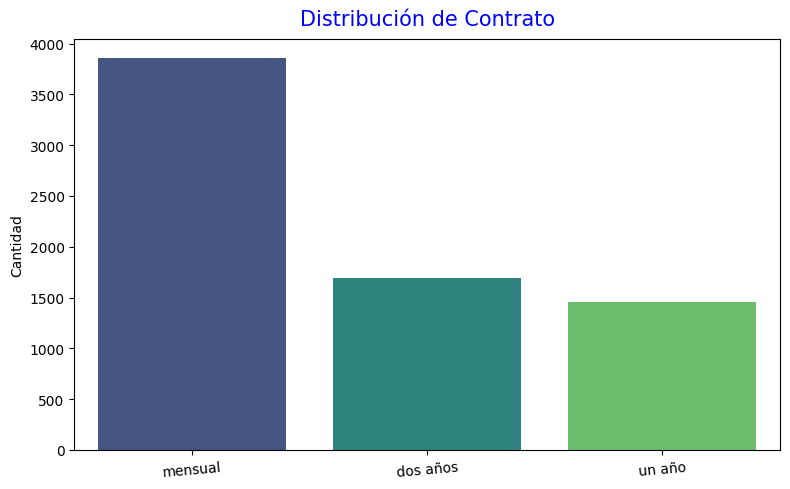

In [91]:
plt.figure(figsize=(8, 5))
sns.countplot(data=datos_churn, x='cuenta.contrato', palette='viridis')
plt.title('Distribución de Contrato', pad=10, fontdict={'fontsize': 15, 'color':'Blue', 'fontweight': 'normal'})
plt.xlabel('')
plt.xticks(rotation=5)
plt.ylabel('Cantidad')
plt.tight_layout()

* Notamos que la moda es mensual. Sin embargo, no solo analizaremos con la moda, sino también con el tiempo de servicio. Visualizar la gráfica posterior

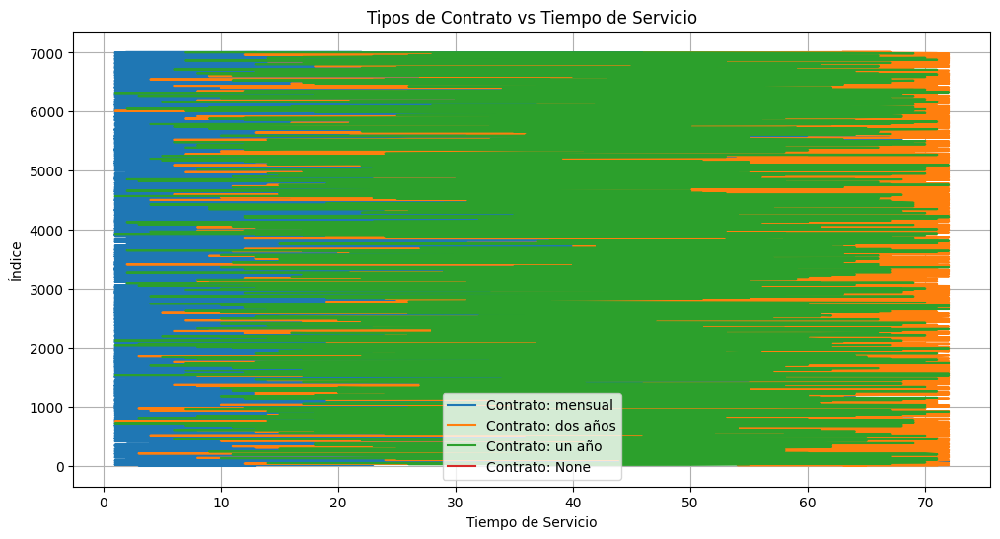

In [92]:
import matplotlib.pyplot as plt

# Crear una figura y un eje
plt.figure(figsize=(12, 6))

# Obtener los tipos únicos de contratos
tipos_contrato = datos_churn['cuenta.contrato'].unique()

# Graficar cada tipo de contrato
for contrato in tipos_contrato:
    # Filtrar datos por tipo de contrato
    datos_filtrados = datos_churn[datos_churn['cuenta.contrato'] == contrato]

    # Graficar 'cliente.tiempo_servicio' en el eje x y algún valor de y (por ejemplo, el índice o una métrica)
    plt.plot(datos_filtrados['cliente.tiempo_servicio'],
             datos_filtrados.index,  # Usar el índice o algún valor numérico
             label=f'Contrato: {contrato}')  # Leyenda para cada tipo de contrato

# Personalizar el gráfico
plt.title('Tipos de Contrato vs Tiempo de Servicio')
plt.xlabel('Tiempo de Servicio')
plt.ylabel('Índice')
plt.legend()  # Mostrar leyenda
plt.grid()    # Añadir cuadrícula para mejor visualización

# Mostrar el gráfico
plt.show()

* En la gráfica observamos que el contrato mensual, por lo general esta referenciado con tiempos de servicio menores de 20 en promedio.
* Tmabién observamos que el contrato de año, se mantiene perenme en general para tiempos de servicio de 20 a 60 en promedio.
* Y los contratos de dos años, se mantienen por lo general para tiempos de servicio mayores de 60.
* Esto no es una regla, pero consideramos que es mejor que solo imputar por la moda, ya que se podría generar cierto sesgo, y de esta manera quizás reducimos el sesgo.

In [93]:
## Validando los promedios para los tiempos de servicio
datos_churn.groupby('cuenta.contrato')['cliente.tiempo_servicio'].mean()

,cliente.tiempo_servicio
cuenta.contrato,
dos años,56.883294
mensual,18.006746
un año,42.110959


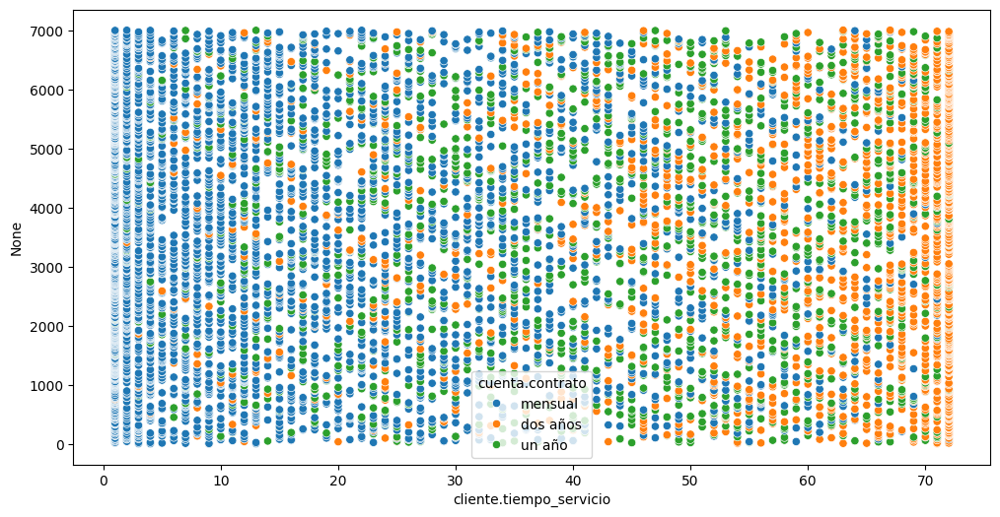

In [94]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=datos_churn,
                x='cliente.tiempo_servicio',
                y=datos_churn.index,  # Eje Y como los índices del DataFrame
                hue='cuenta.contrato')

# Mostrar el gráfico
plt.show()

* COnsiderando esto, decidimos realizar una imputación como sigue:
  > Menos de 25 se colocará MENSUAL

  > Entre 25 y 55 se colocará UN AÑO

  > Mayor de 55 se colocará DOS AÑOS

In [95]:
datos_churn.iloc[idx_contrato_null][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
436,67.0,None,si,tarjeta de credito (automatico),102.78,6886.25
962,21.0,None,si,cheque electronico,74.56,1565.70
2024,50.0,None,si,cheque,103.05,5153.50
4706,1.0,None,si,cheque electronico,70.30,70.30
4709,72.0,None,si,tarjeta de credito (automatico),83.55,6015.60
4712,42.0,None,si,cheque electronico,104.75,4399.50
4718,43.0,None,si,cheque electronico,104.60,4759.85
4740,1.0,None,si,cheque electronico,43.30,43.30
5374,72.0,None,si,tarjeta de credito (automatico),19.80,1468.75
5980,62.0,None,si,transferencia bancaria (automatica),115.47,7159.05


In [96]:
# Imputación basada en los tiempos de servicio
def imputar_contrato(row):
    if pd.isna(row['cuenta.contrato']):  # Solo imputar si el valor es NaN
        if row['cliente.tiempo_servicio'] < 25:
            return 'mensual'
        elif 25 <= row['cliente.tiempo_servicio'] <= 55:
            return 'un año'
        else:
            return 'dos años'
    return row['cuenta.contrato']  # Mantener el valor original si no es NaN

# Aplicar la función a la columna 'cuenta.contrato'
datos_churn['cuenta.contrato'] = datos_churn.apply(imputar_contrato, axis=1)

# Verificar los cambios
print(datos_churn['cuenta.contrato'].isnull().sum())

0


In [97]:
datos_churn.iloc[idx_contrato_null][columns_with_null]

,cliente.tiempo_servicio,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
436,67.0,dos años,si,tarjeta de credito (automatico),102.78,6886.25
962,21.0,mensual,si,cheque electronico,74.56,1565.70
2024,50.0,un año,si,cheque,103.05,5153.50
4706,1.0,mensual,si,cheque electronico,70.30,70.30
4709,72.0,dos años,si,tarjeta de credito (automatico),83.55,6015.60
4712,42.0,un año,si,cheque electronico,104.75,4399.50
4718,43.0,un año,si,cheque electronico,104.60,4759.85
4740,1.0,mensual,si,cheque electronico,43.30,43.30
5374,72.0,dos años,si,tarjeta de credito (automatico),19.80,1468.75
5980,62.0,dos años,si,transferencia bancaria (automatica),115.47,7159.05


* Validamos que la imputación fue realizada satisfactoriamente para variable contrato.

In [98]:
## Verificamos que ya no tenemos valores nulos en el dataframe final
datos_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7013 entries, 0 to 7012
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   id_cliente                       7013 non-null   object 
 1   Churn                            7013 non-null   object 
 2   cliente.genero                   7013 non-null   object 
 3   cliente.anciano                  7013 non-null   int64  
 4   cliente.pareja                   7013 non-null   object 
 5   cliente.dependientes             7013 non-null   object 
 6   cliente.tiempo_servicio          7013 non-null   float64
 7   telefono.servicio_telefono       7013 non-null   object 
 8   telefono.varias_lineas           7013 non-null   object 
 9   internet.servicio_internet       7013 non-null   object 
 10  internet.seguridad_online        7013 non-null   object 
 11  internet.backup_online           7013 non-null   object 
 12  internet.proteccion_

* NO TENEMOS MÁS VALORES NULOS EN NUESTRO DATASET.
* AHORA SI PODEMOS TRABAJARLO PARA REALIZAR NUESTRO MODELO

##**2.3 Normalizacion de datos**

###**2.3.1 Sin segmentar las variables continuas**

In [99]:
datos_churn_new = datos_churn.copy()
datos_churn_new.head()

,id_cliente,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,0003-MKNFE,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.40
1,0004-TLHLJ,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
2,0011-IGKFF,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
3,0013-EXCHZ,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.40
4,0013-MHZWF,no,femenino,0,no,si,9.0,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.4,571.45


* Observamos que tenemos columnas binarias y con más de dos subcategorías.
* La variable id_cliente, se procede a eliminarla, ya que no aporta valor a nuestro objetivo.
* Se procederá a realizar una transformación de las variables binarias en 0 y 1
* Las variables con más de dos valores, se procederá a realizar un one_hot_encoding ya que no presentan una relación de jerarquía.

In [100]:
## Eliminado columna id_cliente
datos_churn_new.drop('id_cliente', axis=1, inplace=True)
datos_churn_new.head()

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.40
1,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
2,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
3,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.40
4,no,femenino,0,no,si,9.0,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.4,571.45


In [101]:
## verificando nuestras variables categóricas
variables_categoricas = datos_churn_new.select_dtypes(include=['object']).columns
variables_categoricas

Index(['Churn', 'cliente.genero', 'cliente.pareja', 'cliente.dependientes',
       'telefono.servicio_telefono', 'telefono.varias_lineas',
       'internet.servicio_internet', 'internet.seguridad_online',
       'internet.backup_online', 'internet.proteccion_dispositivo',
       'internet.soporte_tecnico', 'internet.tv_streaming',
       'internet.peliculas_streaming', 'cuenta.contrato',
       'cuenta.facturacion_electronica', 'cuenta.metodo_pago'],
      dtype='object')

In [102]:
# Verificar cuántas categorías tiene cada variable categórica

variables_categoricas_binarias = []
variables_categoricas_multiples = []

for col in variables_categoricas:
    unique_values = datos_churn[col].nunique()

    if unique_values == 2:
        variables_categoricas_binarias.append(col)
    else:
        variables_categoricas_multiples.append(col)

print("Variables categóricas binarias:")
print(variables_categoricas_binarias)
print("\nVariables categóricas con múltiples categorías:")
print(variables_categoricas_multiples)

Variables categóricas binarias:
['Churn', 'cliente.genero', 'cliente.pareja', 'cliente.dependientes', 'telefono.servicio_telefono', 'cuenta.facturacion_electronica']

Variables categóricas con múltiples categorías:
['telefono.varias_lineas', 'internet.servicio_internet', 'internet.seguridad_online', 'internet.backup_online', 'internet.proteccion_dispositivo', 'internet.soporte_tecnico', 'internet.tv_streaming', 'internet.peliculas_streaming', 'cuenta.contrato', 'cuenta.metodo_pago']


In [103]:
## Transformando las variables binarias en 0 y 1
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

for col in variables_categoricas_binarias:
    datos_churn_new[col] = label_encoder.fit_transform(datos_churn_new[col])

In [104]:
datos_churn_new[variables_categoricas_binarias].head(10)

,Churn,cliente.genero,cliente.pareja,cliente.dependientes,telefono.servicio_telefono,cuenta.facturacion_electronica
0,0,1,0,0,1,0
1,1,1,0,0,1,1
2,1,1,1,0,1,1
3,1,0,1,0,1,1
4,0,0,0,1,1,1
5,0,0,1,0,1,1
6,0,1,1,0,1,1
7,0,0,0,0,1,1
8,0,0,1,1,1,1
9,0,1,0,0,0,0


* Solo para recordar, notamos que el CHURN NO == 0 y el CHURN SI = 1

In [105]:
## Aplicando one-hot-encoding a las demás variables categóricas múltiples
datos_churn_new = pd.get_dummies(datos_churn_new, columns=variables_categoricas_multiples, drop_first=True)

In [106]:
datos_churn_new.replace(True, 1, inplace=True)
datos_churn_new.replace(False, 0, inplace=True)

In [107]:
datos_churn_new.head(8)

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,cuenta.facturacion_electronica,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.servicio_internet_fibra optica,internet.servicio_internet_no,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica)
0,0,1,0,0,0,9.0,1,0,59.90,542.40,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,1,1,0,0,0,4.0,1,1,73.90,280.85,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
2,1,1,1,1,0,13.0,1,1,98.00,1237.85,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0
3,1,0,1,1,0,3.0,1,1,83.90,267.40,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,1,9.0,1,1,69.40,571.45,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0
5,0,0,1,1,0,71.0,1,1,109.70,7904.25,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,1
6,0,1,0,1,0,63.0,1,1,84.65,5377.80,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
7,0,0,1,0,0,7.0,1,1,48.20,340.35,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0


* Validamos que se haya realizado la Normalización de variables correctamente.

###**2.3.2 Segmentando las variables continuas**

In [108]:
datos_churn_segmentado = datos_churn.copy()
datos_churn_segmentado.head()

,id_cliente,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,0003-MKNFE,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.40
1,0004-TLHLJ,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
2,0011-IGKFF,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
3,0013-EXCHZ,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.40
4,0013-MHZWF,no,femenino,0,no,si,9.0,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.4,571.45


In [109]:
datos_churn_segmentado['id_cliente'].unique()

array(['0003-MKNFE', '0004-TLHLJ', '0011-IGKFF', ..., '9992-UJOEL',
       '9993-LHIEB', '9995-HOTOH'], dtype=object)

* No existe alguna relación en id_cliente y tiene demasiados valores diferentes que según vemos no podemos agrupar

In [110]:
## Eliminamos id_cliente
datos_churn_segmentado.drop('id_cliente', axis=1, inplace=True)
datos_churn_segmentado.head()

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.40
1,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
2,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
3,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.40
4,no,femenino,0,no,si,9.0,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.4,571.45


>>> **cliente.tiempo_servicio**

<Axes: xlabel='None', ylabel='cliente.tiempo_servicio'>

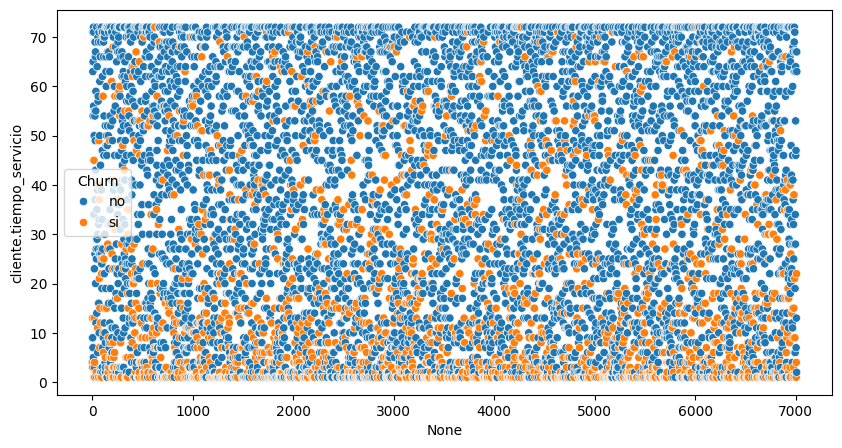

In [111]:
plt.figure(figsize=(10, 5))
sns.scatterplot(data=datos_churn, x=datos_churn.index, y='cliente.tiempo_servicio', hue='Churn')

In [112]:
datos_churn_segmentado['cliente.tiempo_servicio'].unique()

array([ 9.,  4., 13.,  3., 71., 63.,  7., 65., 54., 72.,  5., 56., 34.,
        1., 45., 50., 23., 55., 26., 69., 37., 49., 66., 67., 20., 43.,
       59., 12., 27.,  2., 25., 29., 14., 35., 64., 39., 40., 11.,  6.,
       30., 70., 57., 58., 16., 32., 33., 10., 21., 61., 15., 44., 22.,
       24., 19., 47., 62., 46., 52.,  8., 60., 48., 28., 41., 53., 68.,
       31., 36., 17., 18., 51., 38., 42.])

* Tal como habiamos observado en las gráficas anteriores, notamos que el tiempo_servicio seguía un patrón en general con respecto al contrato.
* También podemos indicar que se generan aglomeraciones para tiempos de servicios bajos y muy altos, dando un desbalance en el dataset, por esta razón, decidimos segmentar por tiempo:

  > Menor de 6 meses == Demasiado Bajo == 1

  > Entre 6 y 18 meses == Bajo == 2

  > Entre 18 y 36 meses == Medio == 3

  > Entre 36 y 50 meses == Alto == 4

  > Entre 50 y 65 meses == Muy alto == 5
  
  > Mayor de 65 meses == Demasiado Alto == 6

In [113]:
## mapeando para la variable cliente.tiempo_servicio

# Crear los segmentos para tiempo de servicio
# bins = [0, 24, 48, float('inf')]  # Intervalos: <24, 24-48, >48
# labels = [1, 2, 3]  # 1 = Bajo, 2 = Medio, 3 = Alto

bins = [0, 6, 18, 36, 50, 65, float('inf')]
labels = [1, 2, 3, 4, 5, 6]

# Sobrescribir la columna 'cliente.tiempo_servicio' con los valores segmentados
datos_churn_segmentado['cliente.tiempo_servicio'] = pd.cut(datos_churn_segmentado['cliente.tiempo_servicio'], bins=bins, labels=labels, right=False)

# Verificar el resultado
datos_churn_segmentado.head(12)

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,no,masculino,0,no,no,2,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.90,542.40
1,si,masculino,0,no,no,1,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.90,280.85
2,si,masculino,1,si,no,2,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.00,1237.85
3,si,femenino,1,si,no,1,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.90,267.40
4,no,femenino,0,no,si,2,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.40,571.45
5,no,femenino,1,si,no,6,si,no,fibra optica,si,si,si,si,si,si,dos años,si,transferencia bancaria (automatica),109.70,7904.25
6,no,masculino,0,si,no,5,si,si,fibra optica,si,no,no,si,no,no,dos años,si,tarjeta de credito (automatico),84.65,5377.80
7,no,femenino,1,no,no,2,si,no,DSL,si,no,no,no,no,no,mensual,si,cheque electronico,48.20,340.35
8,no,femenino,0,si,si,6,si,si,DSL,si,si,si,si,si,si,dos años,si,cheque,90.45,5957.90
9,no,masculino,0,no,no,5,no,sin servicio de telefono,DSL,si,no,no,si,si,no,dos años,no,tarjeta de credito (automatico),45.20,2460.55


* Se observa buena variabilidad en nuestra segmentación, para evitar sesgo

>>> **cuenta.cobros.mensual**

In [114]:
datos_churn_segmentado['cuenta.cobros.mensual'].unique(), datos_churn_segmentado['cuenta.cobros.mensual'].min(), datos_churn_segmentado['cuenta.cobros.mensual'].max()

(array([59.9 , 73.9 , 98.  , ..., 91.75, 68.8 , 67.85]), 18.25, 118.75)

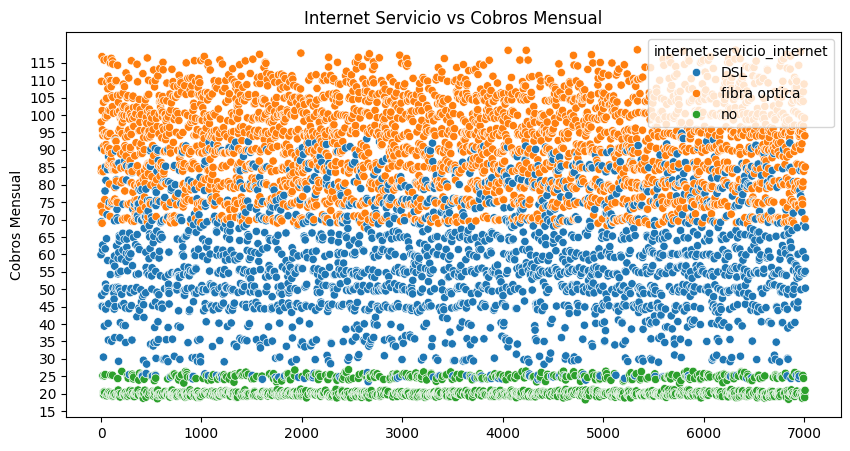

In [115]:
plt.figure(figsize=(10, 5))
sns.scatterplot(data=datos_churn_segmentado, x=datos_churn_segmentado.index, y='cuenta.cobros.mensual', hue ='internet.servicio_internet')
plt.title('Internet Servicio vs Cobros Mensual')
plt.xlabel('')
plt.ylabel('Cobros Mensual')
plt.yticks(np.arange(datos_churn_segmentado['cuenta.cobros.mensual'].min()-3.25, datos_churn_segmentado['cuenta.cobros.mensual'].max()+1.25, 5))
plt.show()

* Tal como observamos en la gráfica scatterplot, notamos que el cobros.mensual esta relacionado intimamente con el tipo de servicio proporcionado, por esta razón, decidimos segmentar en varios niveles:

  > Menor de 30 == 1

  > Entre 30 y 60 == 2

  > Entre 60 y 80 == 3

  > Entre 80 y 95 == 4
  
  > Mayor de 95 == Alto == 5

In [116]:
## mapeando para la variable cuenta.cobros.mensual

# Crear los segmentos para cuenta.cobros.mensual
# bins = [0, 30, 80, float('inf')]  # Intervalos: <30, 30-80, >80
# labels = [1, 2, 3]  # 1 = Bajo, 2 = Medio, 3 = Alto

bins = [0, 30, 60, 80, 95, float('inf')]
labels = [1, 2, 3, 4, 5]

# Sobrescribir la columna 'cuenta.cobros.mensual' con los valores segmentados
datos_churn_segmentado['cuenta.cobros.mensual'] = pd.cut(datos_churn_segmentado['cuenta.cobros.mensual'], bins=bins, labels=labels, right=False)

# Verificar el resultado
datos_churn_segmentado.head(10)

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,no,masculino,0,no,no,2,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,2,542.40
1,si,masculino,0,no,no,1,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,3,280.85
2,si,masculino,1,si,no,2,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,5,1237.85
3,si,femenino,1,si,no,1,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,4,267.40
4,no,femenino,0,no,si,2,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),3,571.45
5,no,femenino,1,si,no,6,si,no,fibra optica,si,si,si,si,si,si,dos años,si,transferencia bancaria (automatica),5,7904.25
6,no,masculino,0,si,no,5,si,si,fibra optica,si,no,no,si,no,no,dos años,si,tarjeta de credito (automatico),4,5377.80
7,no,femenino,1,no,no,2,si,no,DSL,si,no,no,no,no,no,mensual,si,cheque electronico,2,340.35
8,no,femenino,0,si,si,6,si,si,DSL,si,si,si,si,si,si,dos años,si,cheque,4,5957.90
9,no,masculino,0,no,no,5,no,sin servicio de telefono,DSL,si,no,no,si,si,no,dos años,no,tarjeta de credito (automatico),2,2460.55


* Observamos buena variabilidad en nuestros datos

>>> **cuenta.cobros.Total**

* Sabemos que esta variable esta relacionada con el tiempo_servicio y cobros.mensual, asi que analizaremos por estos puntos.

In [117]:
datos_churn_segmentado['cuenta.cobros.Total'].unique(), datos_churn_segmentado['cuenta.cobros.Total'].min(), datos_churn_segmentado['cuenta.cobros.Total'].max()

(array([ 542.4 ,  280.85, 1237.85, ...,  742.9 , 4627.65, 3707.6 ]),
 18.8,
 8684.8)

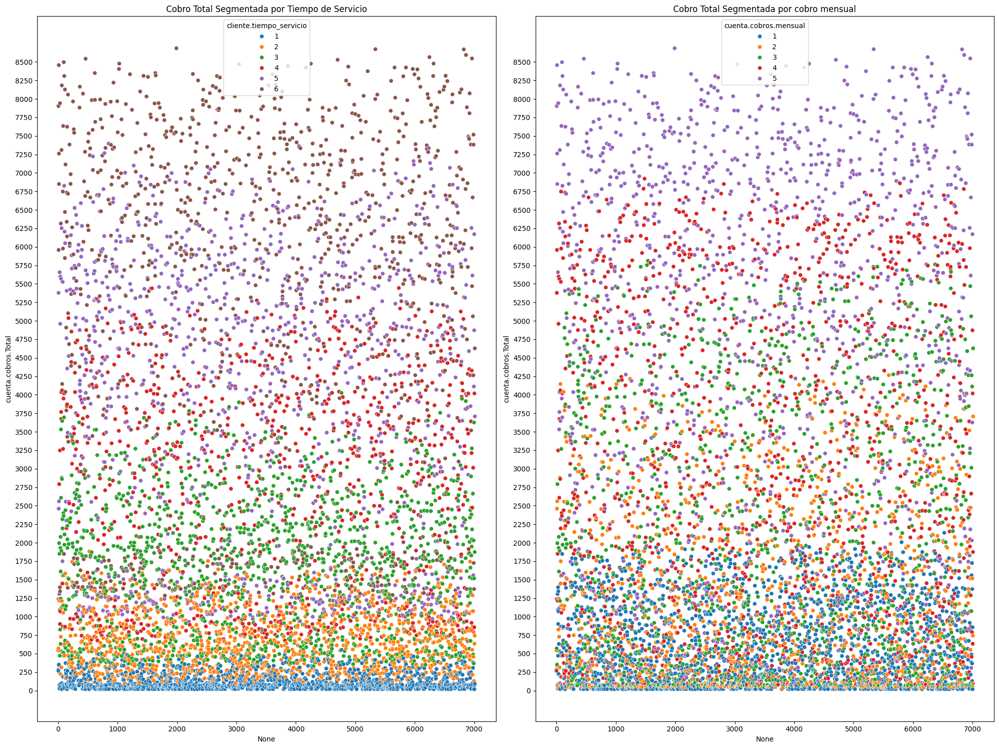

In [118]:
# Creamos una figura con dos subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 15))

# Graficamos el primer subplot
ax1.set_title('Cobro Total Segmentada por Tiempo de Servicio')
sns.scatterplot(x=datos_churn_segmentado.index, y='cuenta.cobros.Total', hue='cliente.tiempo_servicio', data=datos_churn_segmentado, ax=ax1)

# Graficamos el primer subplot
ax2.set_title('Cobro Total Segmentada por cobro mensual')
sns.scatterplot(x=datos_churn_segmentado.index, y='cuenta.cobros.Total', hue='cuenta.cobros.mensual', data=datos_churn_segmentado, ax=ax2)

# Personalizamos los ticks del eje y para el heatmap
ax1.set_yticks(np.arange(0, datos_churn_segmentado['cuenta.cobros.Total'].max(), 250))
ax2.set_yticks(np.arange(0, datos_churn_segmentado['cuenta.cobros.Total'].max(), 250))

plt.tight_layout()
plt.show()

* Tal como observamos en la gráfica doble de scatterplot, notamos que el cobros.Total esta relacionado intimamente con estas dos variables tiempo_servicio y cobros.mensual.
* También notamos que los valores tienden en su mayoria a montos bajos, es por eso que nuestra segmentación se dividirá de la forma en que se pueda reducir el sesgo y las proporciones de datos:

  > Menor de 1500 == Bajo == 1

  > Entre 1500 y 4500 == Medio == 2
  
  > Mayor de 4500 == Alto == 3

In [119]:
## mapeando para la variable cuenta.cobros.mensual

# Crear los segmentos para cuenta.cobros.mensual
# bins = [0, 1500, 4500, float('inf')]  # Intervalos: <1500, 1500-4500, >4500
# labels = [1, 2, 3]  # 1 = Bajo, 2 = Medio, 3 = Alto

bins = [0, 100, 300, 550, 1000, 2000, 3500, 5500, float('inf')]
labels = [1, 2, 3, 4, 5, 6, 7, 8]

# Sobrescribir la columna 'cuenta.cobros.mensual' con los valores segmentados
datos_churn_segmentado['cuenta.cobros.Total'] = pd.cut(datos_churn_segmentado['cuenta.cobros.Total'], bins=bins, labels=labels, right=False)

# Verificar el resultado
datos_churn_segmentado.head(10)

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,no,masculino,0,no,no,2,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,2,3
1,si,masculino,0,no,no,1,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,3,2
2,si,masculino,1,si,no,2,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,5,5
3,si,femenino,1,si,no,1,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,4,2
4,no,femenino,0,no,si,2,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),3,4
5,no,femenino,1,si,no,6,si,no,fibra optica,si,si,si,si,si,si,dos años,si,transferencia bancaria (automatica),5,8
6,no,masculino,0,si,no,5,si,si,fibra optica,si,no,no,si,no,no,dos años,si,tarjeta de credito (automatico),4,7
7,no,femenino,1,no,no,2,si,no,DSL,si,no,no,no,no,no,mensual,si,cheque electronico,2,3
8,no,femenino,0,si,si,6,si,si,DSL,si,si,si,si,si,si,dos años,si,cheque,4,8
9,no,masculino,0,no,no,5,no,sin servicio de telefono,DSL,si,no,no,si,si,no,dos años,no,tarjeta de credito (automatico),2,6


* Con esto temrinamos de segmentar los valores continuos de nuestro dataframe. COnsideramos que de esta manera podemos incorporarlo a nuestro modelo de machine learning y obtener mejores resultados.

In [120]:
## Transformando las variables binarias en 0 y 1
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

for col in variables_categoricas_binarias:
    datos_churn_segmentado[col] = label_encoder.fit_transform(datos_churn_segmentado[col])

In [121]:
datos_churn_segmentado[variables_categoricas_binarias].head(8)

,Churn,cliente.genero,cliente.pareja,cliente.dependientes,telefono.servicio_telefono,cuenta.facturacion_electronica
0,0,1,0,0,1,0
1,1,1,0,0,1,1
2,1,1,1,0,1,1
3,1,0,1,0,1,1
4,0,0,0,1,1,1
5,0,0,1,0,1,1
6,0,1,1,0,1,1
7,0,0,0,0,1,1


In [122]:
## Aplicando one-hot-encoding a las demás variables categóricas múltiples
datos_churn_segmentado = pd.get_dummies(datos_churn_segmentado, columns=variables_categoricas_multiples, drop_first=True)

In [123]:
datos_churn_segmentado.replace(True, 1, inplace=True)
datos_churn_segmentado.replace(False, 0, inplace=True)

In [124]:
datos_churn_segmentado.head(8)

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,cuenta.facturacion_electronica,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.servicio_internet_fibra optica,internet.servicio_internet_no,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica)
0,0,1,0,0,0,2,1,0,2,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,1,1,0,0,0,1,1,1,3,2,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
2,1,1,1,1,0,2,1,1,5,5,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0
3,1,0,1,1,0,1,1,1,4,2,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,1,2,1,1,3,4,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0
5,0,0,1,1,0,6,1,1,5,8,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,1
6,0,1,0,1,0,5,1,1,4,7,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
7,0,0,1,0,0,2,1,1,2,3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0


* Quedo listo para incorporarlo a nuestor modelo

###**2.3.3 Transformación Logarítmica y Exponencial Inversa para las variables continuas**

https://chatgpt.com/share/66f5dc64-cd94-800f-8e66-308335ec8391

In [125]:
datos_churn_log = datos_churn.copy()
datos_churn_log.head()

,id_cliente,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,0003-MKNFE,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.40
1,0004-TLHLJ,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
2,0011-IGKFF,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
3,0013-EXCHZ,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.40
4,0013-MHZWF,no,femenino,0,no,si,9.0,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.4,571.45


In [126]:
datos_churn_log.drop('id_cliente', axis=1, inplace=True)
datos_churn_log.head()

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.40
1,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
2,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
3,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.40
4,no,femenino,0,no,si,9.0,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.4,571.45


**VARIABLES CONTÍNUAS**

* Ahora analizaremos el sesgo que puede estar presente en nuestras variables contínuas:  **cliente.tiempo_servicio, cuenta.cobros.mensual y cuenta.cobros.Total**

verificar el sesgo de las variables continuas es importante antes de aplicar cualquier transformación, y también es clave saber si el sesgo es hacia la derecha o la izquierda, ya que eso determinará qué tipo de transformación podría ser más efectiva.

* Tipos de Sesgo:

 > Sesgo hacia la derecha (Right Skewed): La mayoría de los valores están concentrados en el extremo izquierdo, con una "cola" extendiéndose hacia la derecha. Esto indica que tienes muchos valores pequeños y algunos grandes. La transformación logarítmica es útil en este caso.

 > Sesgo hacia la izquierda (Left Skewed): La mayoría de los valores están en el extremo derecho, con una "cola" extendiéndose hacia la izquierda. En este caso, una transformación como la exponencial inversa o elevar a una potencia menor que 1 puede ser más apropiada.

* Cómo verificar el sesgo:
Puedes usar histogramas y la métrica de asimetría (skewness) para medir si las distribuciones están sesgadas y hacia qué lado. El valor de la asimetría indica lo siguiente:

 > Asimetría positiva (>0): Sesgo hacia la derecha.

 > Asimetría negativa (<0): Sesgo hacia la izquierda.

 > Cercano a 0: Distribución aproximadamente simétrica.

In [127]:
from scipy.stats import skew

# Seleccionar las columnas que contienen variables continuas
variables_continuas = ['cliente.tiempo_servicio', 'cuenta.cobros.mensual' , 'cuenta.cobros.Total']

# Calcular el sesgo (asimetría)
skewness = datos_churn_log[variables_continuas].apply(lambda x: skew(x))

# Mostrar el sesgo
print(skewness)

cliente.tiempo_servicio    0.239308
cuenta.cobros.mensual     -0.220211
cuenta.cobros.Total        0.965633
dtype: float64


* Observamos que, **cliente.tiempo_servicio y cuenta.cobros.Total** tienen sesgo hacia la derecha por lo cuál sería recomendable aplicar transformación logarítimica. Por otro lado **cuenta.cobros.mensual** tiene sesgo hacia la izquierda, en este caso aplicaríamos exponencial inversa.

* También es importante analizar los histogramas, que nos podrán mostrar la tendencia de los datos en estas variables, y corroborar nuestra información.

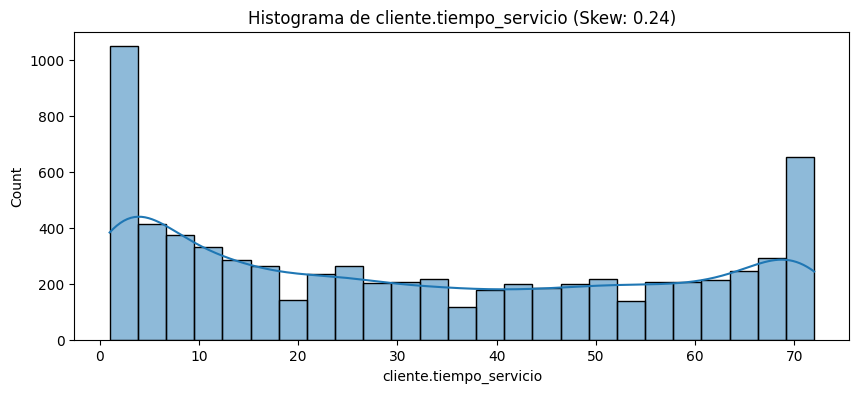

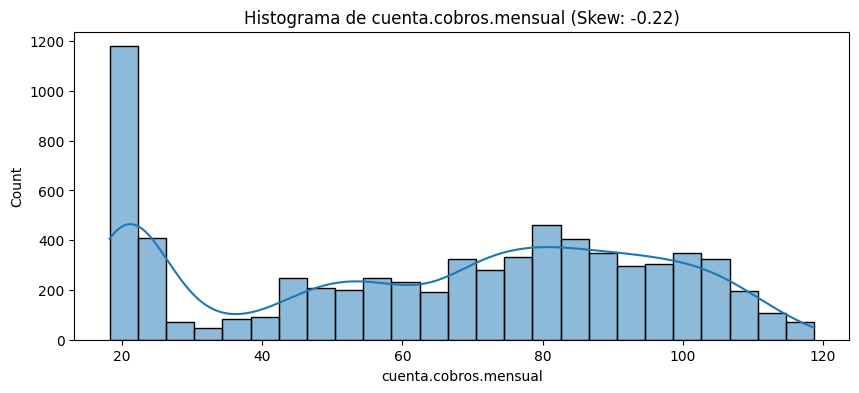

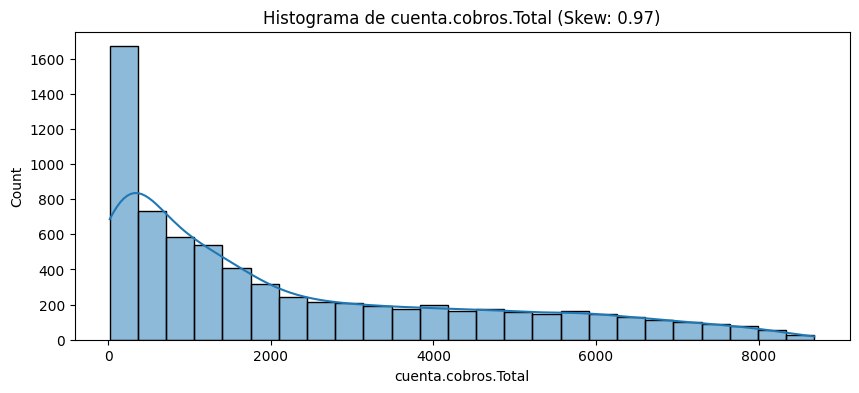

In [128]:
# Graficando  histogramas para ver la distribución de las variables contínuas
for var in variables_continuas:
    plt.figure(figsize=(10, 4))
    sns.histplot(datos_churn_log[var], bins=25, kde=True)
    plt.title(f'Histograma de {var} (Skew: {skew(datos_churn_log[var]):.2f})')
    plt.show()

* Observamos que la cobros.Total es la que tiene mayor tendencia hacia la derecha. Sesgo de tener mucha data concentrada en esos valores.
* Las otras dos variables tienen un sesgo moderado, tanto para la derecha como para la izquierda.
* Se procederá a aplicar la transformación logarítmica y exponencial inversa de acuerdo sea el caso.
* Luego se observará nuevamente el gráfico a ver como mejora

OBS:

* np.log1p(): Aplica logaritmo natural (base e) a 1 + x, lo cual es útil si hay valores cercanos a cero (log(0) es indefinido).

> Sesgo hacia la derecha: La transformación logarítmica es más efectiva.

> Sesgo hacia la izquierda: Prueba la raíz cuadrada o cúbica (inversas exponenciales) para reducir el sesgo negativo.

In [129]:
# Aplicar la transformación logarítmica
# Usamos log1p para evitar problemas con valores 0 o cercanos a 0.
datos_churn_log['cliente.tiempo_servicio'] = np.log1p(datos_churn_log['cliente.tiempo_servicio'])
datos_churn_log['cuenta.cobros.Total'] = np.log1p(datos_churn_log['cuenta.cobros.Total'])

# Aplicar la transformación exponencial inversa
# Invertimos los valores, luego aplicamos la transformación exponencial
datos_churn_log['cuenta.cobros.mensual'] = np.power(datos_churn_log['cuenta.cobros.mensual'], 0.5)  # Elevar a 0.5 (raíz cuadrada) reduce el sesgo negativo

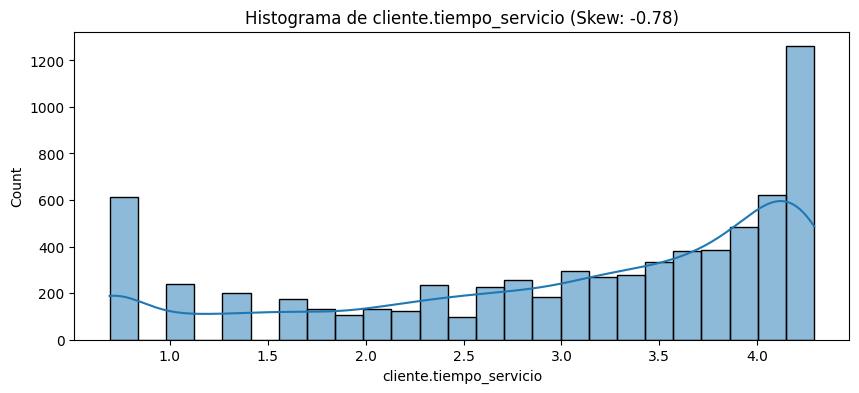

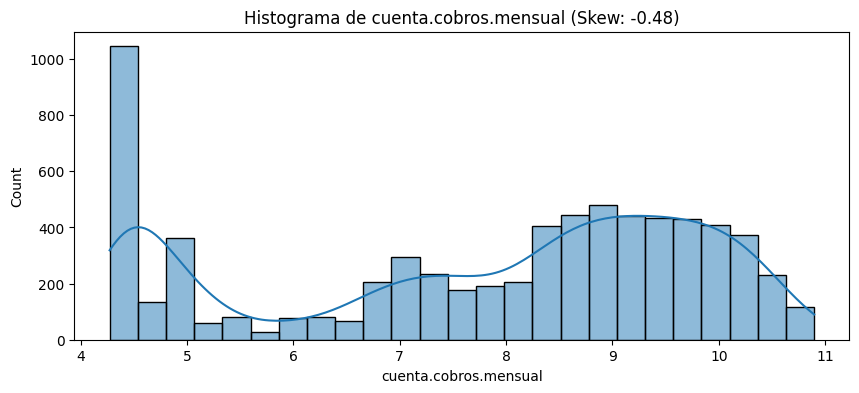

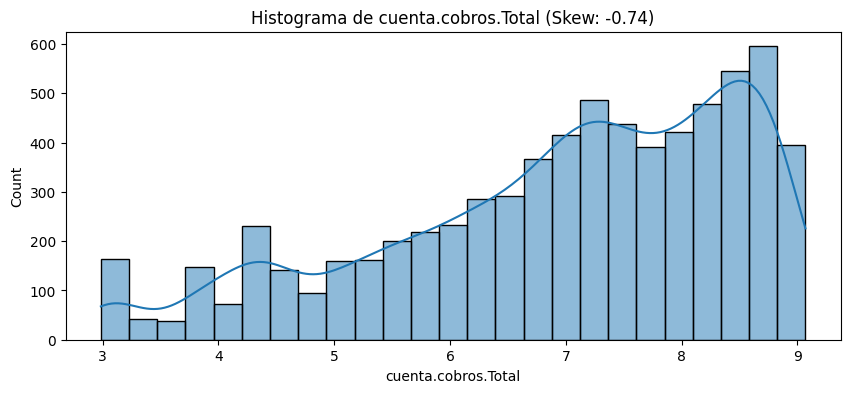

In [130]:
# Graficando  histogramas para ver la distribución de las variables contínuas después de las Transformaciones
for i in variables_continuas:
    plt.figure(figsize=(10, 4))
    sns.histplot(datos_churn_log[i], bins=25, kde=True)
    plt.title(f'Histograma de {i} (Skew: {skew(datos_churn_log[i]):.2f})')
    plt.show()

* Observamos que no mejoró nuestra distribución, de todas maneras lo incorporaremos al modelo para observar como se comporta, porque se bajo la escala de todas maneras.

In [131]:
## Transformando las variables binarias en 0 y 1
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

for col in variables_categoricas_binarias:
    datos_churn_log[col] = label_encoder.fit_transform(datos_churn_log[col])

datos_churn_log[variables_categoricas_binarias].head(8)

,Churn,cliente.genero,cliente.pareja,cliente.dependientes,telefono.servicio_telefono,cuenta.facturacion_electronica
0,0,1,0,0,1,0
1,1,1,0,0,1,1
2,1,1,1,0,1,1
3,1,0,1,0,1,1
4,0,0,0,1,1,1
5,0,0,1,0,1,1
6,0,1,1,0,1,1
7,0,0,0,0,1,1


In [132]:
## Aplicando one-hot-encoding a las demás variables categóricas múltiples
datos_churn_log = pd.get_dummies(datos_churn_log, columns=variables_categoricas_multiples, drop_first=True)

datos_churn_log.replace(True, 1, inplace=True)
datos_churn_log.replace(False, 0, inplace=True)

datos_churn_log.head(8)

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,cuenta.facturacion_electronica,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.servicio_internet_fibra optica,internet.servicio_internet_no,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica)
0,0,1,0,0,0,2.302585,1,0,7.739509,6.297846,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,1,1,0,0,0,1.609438,1,1,8.596511,5.641375,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
2,1,1,1,1,0,2.639057,1,1,9.899495,7.121939,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0
3,1,0,1,1,0,1.386294,1,1,9.159694,5.592478,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,1,2.302585,1,1,8.330666,6.349925,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0
5,0,0,1,1,0,4.276666,1,1,10.473777,8.975282,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,1
6,0,1,0,1,0,4.158883,1,1,9.200543,8.590221,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
7,0,0,1,0,0,2.079442,1,1,6.942622,5.832908,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0


###**2.3.4 Transformación Box-Cox para las variables continuas**

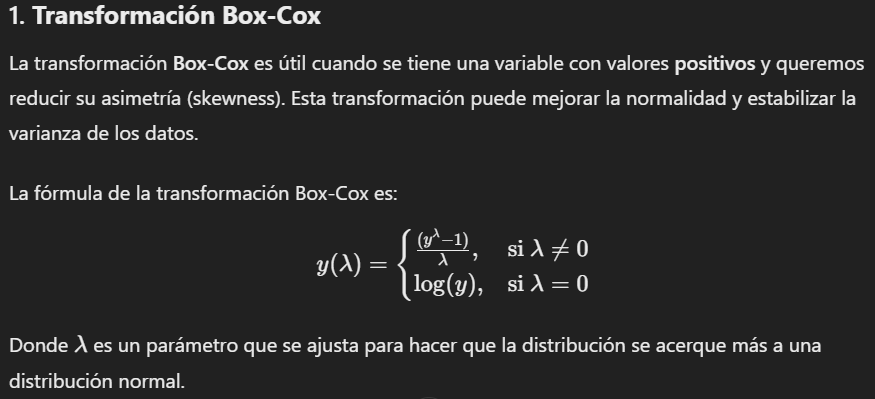

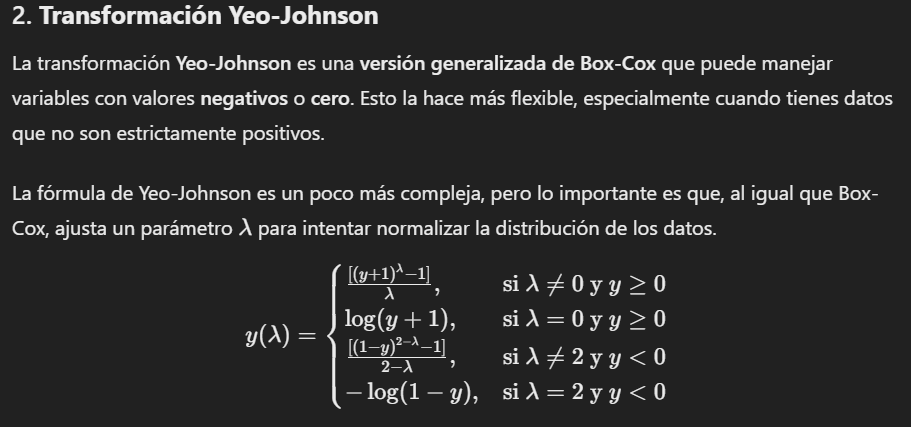

In [133]:
datos_churn_box = datos_churn.copy()
datos_churn_box.head()

,id_cliente,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,0003-MKNFE,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.40
1,0004-TLHLJ,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
2,0011-IGKFF,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
3,0013-EXCHZ,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.40
4,0013-MHZWF,no,femenino,0,no,si,9.0,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.4,571.45


In [134]:
datos_churn_box.drop('id_cliente', axis=1, inplace=True)
datos_churn_box.head()

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.40
1,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
2,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
3,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.40
4,no,femenino,0,no,si,9.0,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.4,571.45


**VARIABLES CONTÍNUAS**

* Ahora aplicaremos la transformación Box-Cox para reducir el sesgo presente en nuestras variables continúas:  **cliente.tiempo_servicio, cuenta.cobros.mensual y cuenta.cobros.Total**
* De esta manera también reducimos su dimensionalidad presente por el amplio rango que se maneja.

In [135]:
from scipy import stats

# Aplicar la transformación Box-Cox
variables_continuas = ['cliente.tiempo_servicio', 'cuenta.cobros.mensual', 'cuenta.cobros.Total']
for col in variables_continuas:
    # # Asegú de que no haya valores negativos, ya que Box-Cox requiere datos positivos
    # if (df[col] <= 0).any():
    #     raise ValueError(f"La columna {col} contiene valores cero o negativos. Box-Cox no puede aplicarse.")
    datos_churn_box[col], lambda_param = stats.boxcox(datos_churn_box[col])
    print(f"Transformación de {col} realizada con lambda = {lambda_param}")

Transformación de cliente.tiempo_servicio realizada con lambda = 0.4572353614972442
Transformación de cuenta.cobros.mensual realizada con lambda = 0.9186694405013563
Transformación de cuenta.cobros.Total realizada con lambda = 0.2541879184564337


In [136]:
datos_churn_box.head()

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,no,masculino,0,no,no,3.785683,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,45.653592,15.558788
1,si,masculino,0,no,no,1.935278,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,55.601575,12.555791
2,si,masculino,1,si,no,4.879282,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,72.383032,20.107535
3,si,femenino,1,si,no,1.427182,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,62.611854,12.351369
4,no,femenino,0,no,si,3.785683,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),52.422264,15.819021


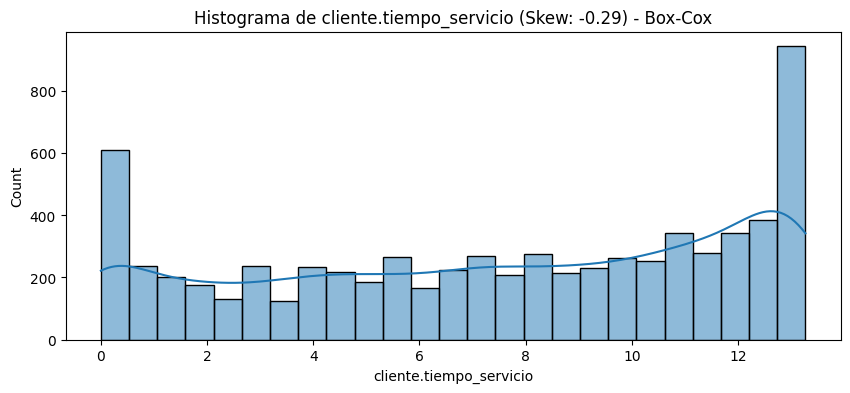

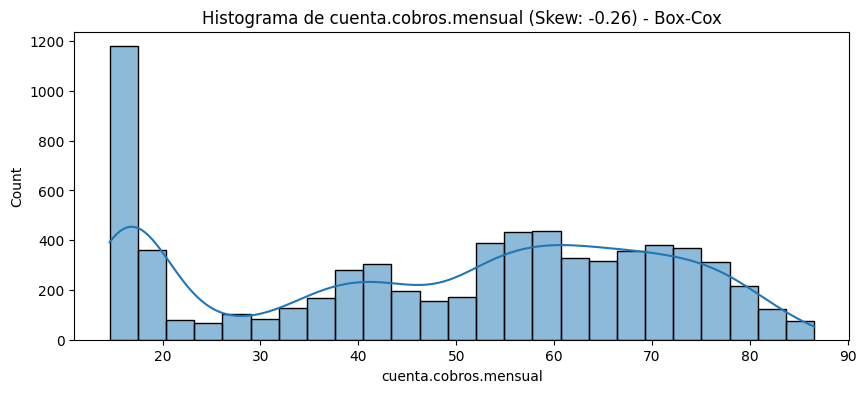

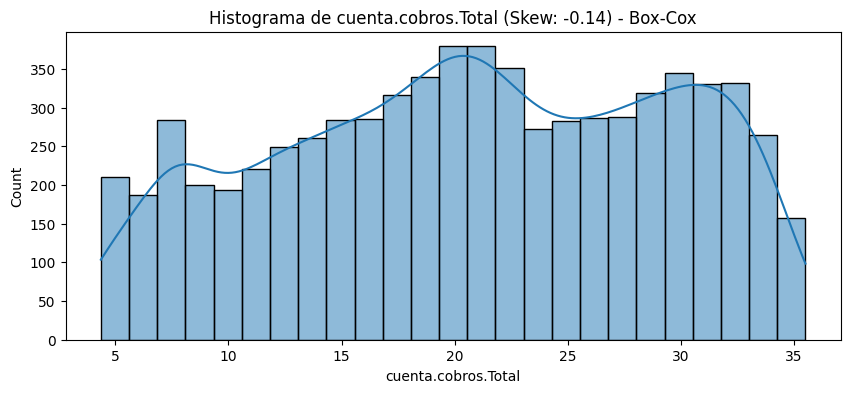

In [137]:
# Graficando  histogramas para ver la distribución de las variables contínuas después de las Transformaciones
for i in variables_continuas:
    plt.figure(figsize=(10, 4))
    sns.histplot(datos_churn_box[i], bins=25, kde=True)
    plt.title(f'Histograma de {i} (Skew: {skew(datos_churn_box[i]):.2f}) - Box-Cox')
    plt.show()

* Observamos que ayudo a bajar la dimensionalidad de los valores, reducción de rangos.
* La variable cobros.Total fue beneficiada con la transformación, se redujo el sesgo.

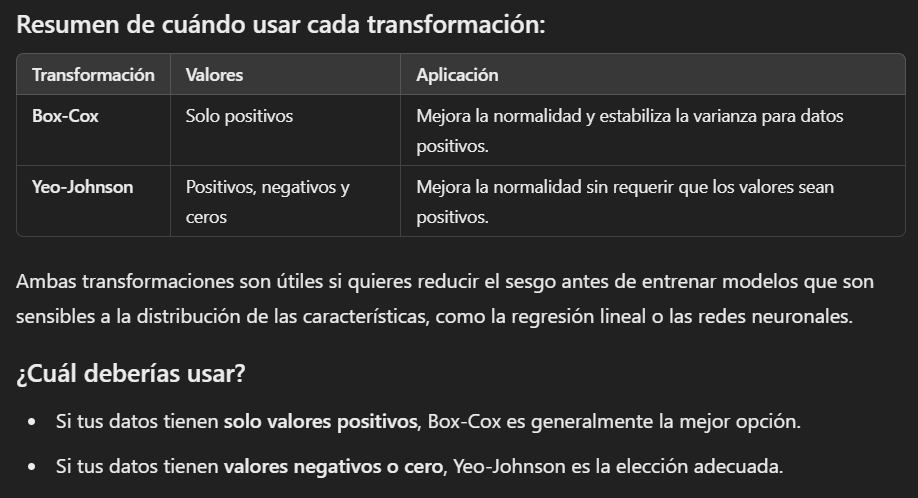

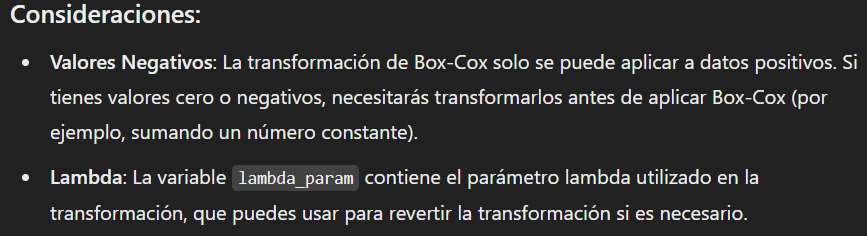

In [138]:
## Transformando las variables binarias en 0 y 1
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

for col in variables_categoricas_binarias:
    datos_churn_box[col] = label_encoder.fit_transform(datos_churn_box[col])

datos_churn_box[variables_categoricas_binarias].head(8)

,Churn,cliente.genero,cliente.pareja,cliente.dependientes,telefono.servicio_telefono,cuenta.facturacion_electronica
0,0,1,0,0,1,0
1,1,1,0,0,1,1
2,1,1,1,0,1,1
3,1,0,1,0,1,1
4,0,0,0,1,1,1
5,0,0,1,0,1,1
6,0,1,1,0,1,1
7,0,0,0,0,1,1


In [139]:
## Aplicando one-hot-encoding a las demás variables categóricas múltiples
datos_churn_box = pd.get_dummies(datos_churn_box, columns=variables_categoricas_multiples, drop_first=True)

datos_churn_box.replace(True, 1, inplace=True)
datos_churn_box.replace(False, 0, inplace=True)

datos_churn_box.head(8)

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,cuenta.facturacion_electronica,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.servicio_internet_fibra optica,internet.servicio_internet_no,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica)
0,0,1,0,0,0,3.785683,1,0,45.653592,15.558788,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,1,1,0,0,0,1.935278,1,1,55.601575,12.555791,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
2,1,1,1,1,0,4.879282,1,1,72.383032,20.107535,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0
3,1,0,1,1,0,1.427182,1,1,62.611854,12.351369,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,1,3.785683,1,1,52.422264,15.819021,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0
5,0,0,1,1,0,13.170458,1,1,80.403701,34.581283,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,1
6,0,1,0,1,0,12.353542,1,1,63.134783,30.989561,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
7,0,0,1,0,0,3.137321,1,1,37.194350,13.381203,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0


###**2.3.5 Normalización de datos usando Transformación Box-Cox y eliminando variables - Análisis gráfico y Entendimiento del Negocio**

* En este apartado, analizaremos eliminar algunas variables que consideramos no relevantes y crear otras que puedan ser importantes, pero sin utilizar técnicas de selección de variables, importancia de variables o reducción de dimensionalidad.

* Nos guiaremos del diccionario del dataset, el cual nos puede dar algún indicio sobre que variables son más importantes y cuales se podrían descartar.

In [140]:
datos_churn_norm = datos_churn_box.copy()
datos_churn_norm.head()

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,cuenta.facturacion_electronica,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.servicio_internet_fibra optica,internet.servicio_internet_no,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica)
0,0,1,0,0,0,3.785683,1,0,45.653592,15.558788,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,1,1,0,0,0,1.935278,1,1,55.601575,12.555791,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
2,1,1,1,1,0,4.879282,1,1,72.383032,20.107535,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0
3,1,0,1,1,0,1.427182,1,1,62.611854,12.351369,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,1,3.785683,1,1,52.422264,15.819021,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0


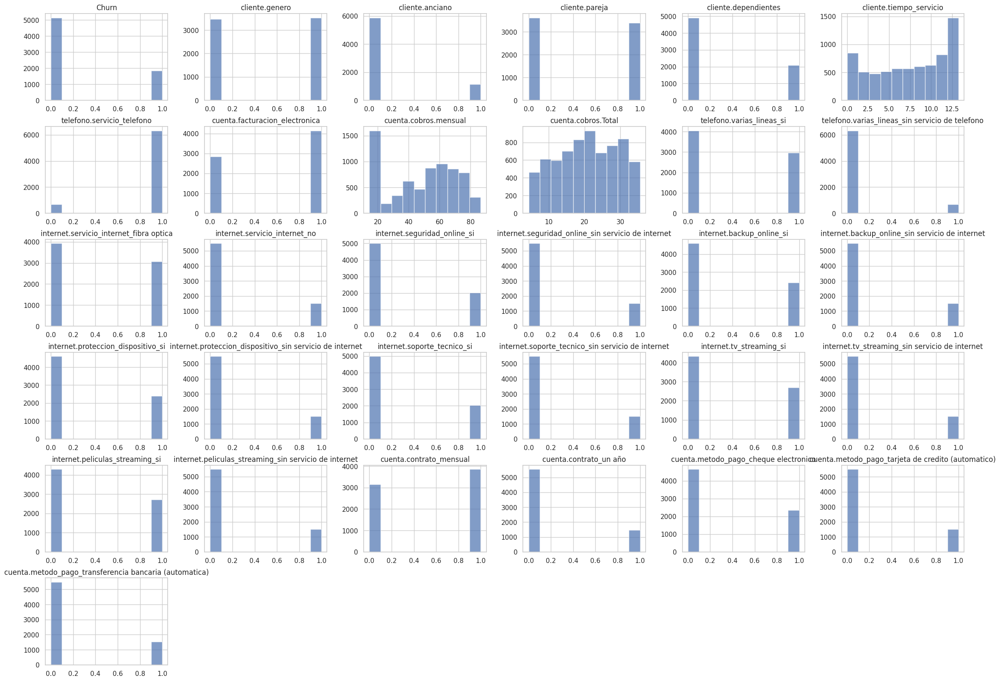

In [141]:
# Configuración de rcParams
# plt.rcParams['figure.figsize'] = (20, 15)   # Tamaño de la figura
plt.rcParams['axes.titlesize'] = 'large'    # Tamaño del título
plt.rcParams['axes.labelsize'] = 'medium'   # Tamaño de las etiquetas
plt.rcParams['xtick.labelsize'] = 'medium'   # Tamaño de las etiquetas del eje x
plt.rcParams['ytick.labelsize'] = 'medium'   # Tamaño de las etiquetas del eje y
plt.rcParams['legend.fontsize'] = 'medium'   # Tamaño de la leyenda
plt.rcParams['lines.linewidth'] = 2           # Ancho de línea
plt.rcParams['lines.color'] = 'blue'          # Color de las líneas

# Graficar un histograma de los datos transformados
# plt.hist(datos_churn_norm, bins=30, alpha=0.7, edgecolor='black')
# plt.title('Histograma de Valores Transformados por Box-Cox')
# plt.xlabel('Valores')
# plt.ylabel('Frecuencia')
# plt.grid(True)
# plt.show()

plt.rcParams['figure.figsize'] = [28,20];
sns.set(style="whitegrid")
datos_churn_norm.hist(alpha=0.7)
plt.show()

* Según el gráfico de histograma que realizamos para todas las variables, observamos que tenemos casi todas las variables binarias y 3 contínuas.
* Nos damos cuenta que en las variables contínuas se tiene información en todo el rango, por esta razon no podemos eliminarlas, aportan valor en todos sus niveles.
* Observamos que de las variables binarias, la mayoría siempre tiene una tendencia para un lado. Sin embargo observamos unas 3 variables que podemos considerar que no nos aportarian cierto valor al modelo, ya que si casi en su totalidad es de una clase, el modelo siempre tendería para esa clase, el sesgo sería grande. Estas variables, las cuales no podemos eliminar por que sí, son: **telefono.varias_lineas_sin servicio de telefono, servicio.servicio_telefono y cliente.anciano**
* De todas maneras, estas variables tenemos que cotejarlo con la variable objetivo, para ver si en realidad se puede eliminar. Por ejemplo, si tenemos que la clase minoritaria para esta variable tiene CHURN SI, no es recomendable eliminar, por que es lo que en sí queremos conseguir, perderíamos este valor de la variable.

In [142]:
%%capture
!pip install tabulate


Relación entre telefono.varias_lineas_sin servicio de telefono y churn:
+-------------------------------------------------+--------------------+---------------------+---------------------+
| telefono.varias_lineas_sin servicio de telefono |         0          |          1          |  Proporción Churn   |
+-------------------------------------------------+--------------------+---------------------+---------------------+
|                        0                        | 0.7328702241869277 | 0.2671297758130723  | 0.2671297758130723  |
|                        1                        | 0.7511045655375552 | 0.24889543446244478 | 0.24889543446244478 |
+-------------------------------------------------+--------------------+---------------------+---------------------+


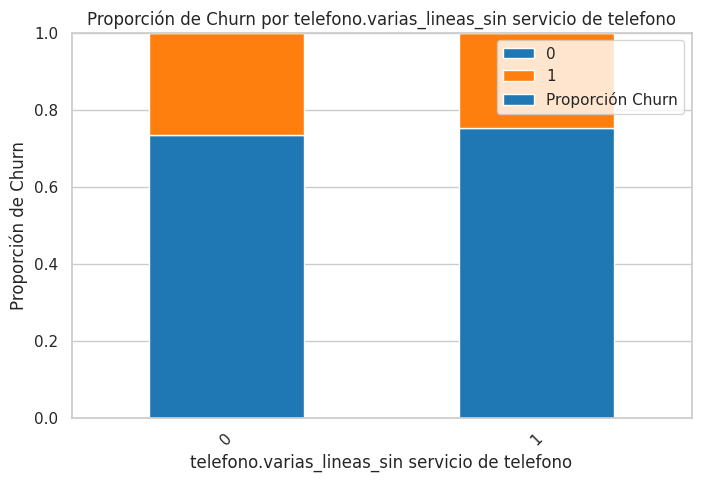


Relación entre telefono.servicio_telefono y churn:
+----------------------------+--------------------+---------------------+---------------------+
| telefono.servicio_telefono |         0          |          1          |  Proporción Churn   |
+----------------------------+--------------------+---------------------+---------------------+
|             0              | 0.7511045655375552 | 0.24889543446244478 | 0.24889543446244478 |
|             1              | 0.7328702241869277 | 0.2671297758130723  | 0.2671297758130723  |
+----------------------------+--------------------+---------------------+---------------------+


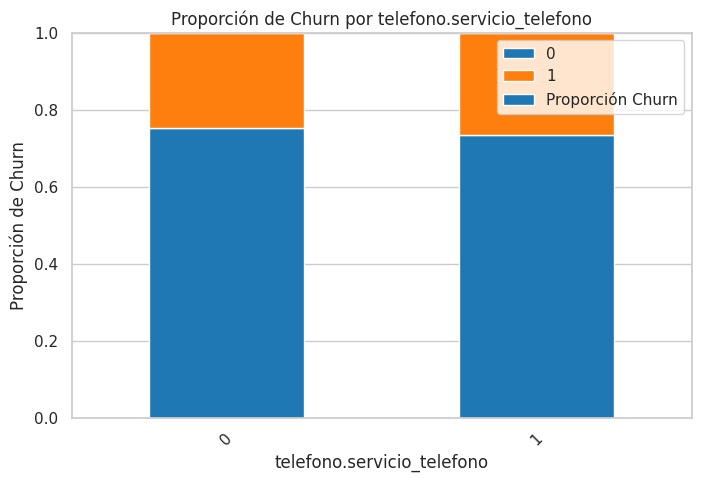


Relación entre cliente.anciano y churn:
+-----------------+--------------------+---------------------+---------------------+
| cliente.anciano |         0          |          1          |  Proporción Churn   |
+-----------------+--------------------+---------------------+---------------------+
|        0        | 0.7635250085062947 | 0.23647499149370535 | 0.23647499149370535 |
|        1        | 0.5850220264317181 | 0.4149779735682819  | 0.4149779735682819  |
+-----------------+--------------------+---------------------+---------------------+


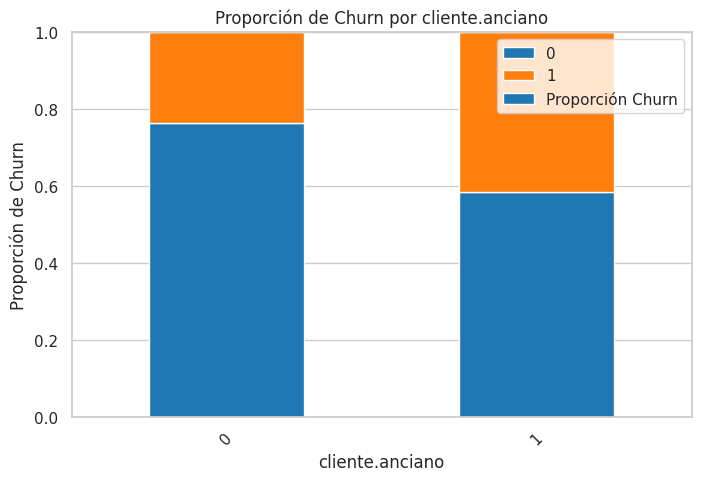

In [143]:
from tabulate import tabulate
## Analizando las variables posibles a eliminar, y 'churn' que indica si hay churn (1) o no (0)
variables_eliminar = ['telefono.varias_lineas_sin servicio de telefono', 'telefono.servicio_telefono', 'cliente.anciano']

# Analizar la relación de las variables con churn
for var in variables_eliminar:
    # Crear tabla de contingencia entre la variable y el churn
    tabla_contingencia = pd.crosstab(datos_churn_norm[var], datos_churn_norm['Churn'], normalize='index')

    # Calcular las proporciones de churn por cada categoría
    tabla_contingencia['Proporción Churn'] = tabla_contingencia[1] / (tabla_contingencia[0] + tabla_contingencia[1])

    # # Mostrar la tabla de resultados
    # print(f"\nRelación entre {var} y churn:")
    # print(tabla_contingencia)

    # Mostrar la tabla de resultados en formato tabulado
    print(f"\nRelación entre {var} y churn:")
    print(tabulate(tabla_contingencia, headers='keys', tablefmt='pretty'))

    # Graficar la proporción de churn
    # Graficar el stacked barplot
    tabla_contingencia.plot(kind='bar', stacked=True, color=['#1f77b4', '#ff7f0e'], figsize=(8, 5))
    plt.title(f'Proporción de Churn por {var}')
    plt.xlabel(var)
    plt.ylabel('Proporción de Churn')
    plt.xticks(rotation=45)  # Rotar etiquetas si son largas
    plt.ylim(0, 1)  # Limitar el eje y de 0 a 1
    plt.legend()
    plt.show()

* Según esto, notamos que la variable anciano es la que nos aporta más valor, ya que si el cliente es anciano, tiene más tendencia a salir con CHURN SI.
* Las otras dos variables, se mantienen en proporción de acuerdo a sus cantidades.

* La otra variable a analizar es cliente.genero, ya que vemos en el histograma que practicamente tienen la misma proporción, lo cual nos indicaría que tenemos datos de ambos géneros. Sin embargo, si analizamos su relación con churn obtenemos:

Text(0, 0.5, 'Número de Clientes')

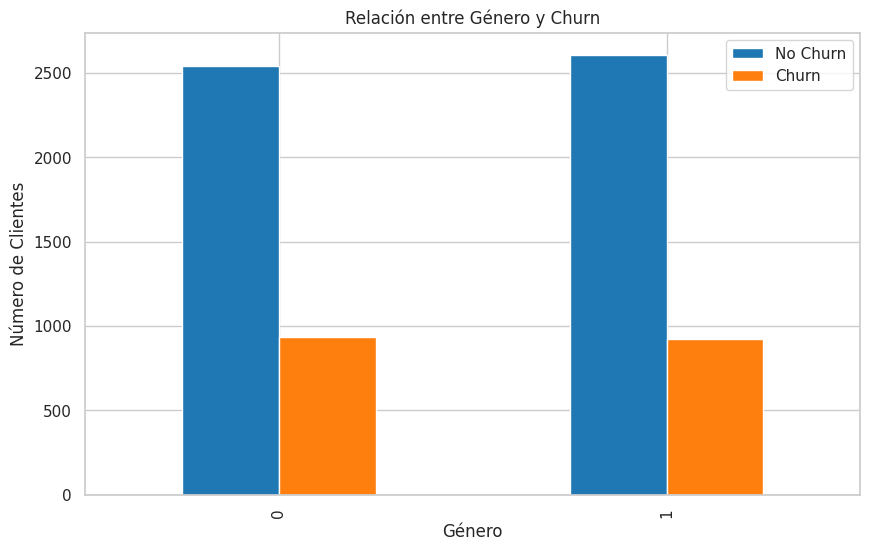

In [144]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm['cliente.genero'], datos_churn_norm['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(10, 6), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre Género y Churn')
plt.xlabel('Género')
plt.ylabel('Número de Clientes')

* Vemos que tienen la misma proporción en todo, por ende consideramos no relevante, ya que para cualquier clase tiene la misma proporción de churn.

In [145]:
## Eliminado las variables que consideramos no aportaran valor al modelo
datos_churn_norm.drop(columns=['telefono.varias_lineas_sin servicio de telefono', 'telefono.servicio_telefono', 'cliente.genero'], inplace=True)
datos_churn_norm.head()

,Churn,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,cuenta.facturacion_electronica,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_si,internet.servicio_internet_fibra optica,internet.servicio_internet_no,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica)
0,0,0,0,0,3.785683,0,45.653592,15.558788,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,1,0,0,0,1.935278,1,55.601575,12.555791,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
2,1,1,1,0,4.879282,1,72.383032,20.107535,0,1,0,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0
3,1,1,1,0,1.427182,1,62.611854,12.351369,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0
4,0,0,0,1,3.785683,1,52.422264,15.819021,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0


###**2.3.6 Normalización de datos usando Transformación Box-Cox, Feature engineering y eliminando variables - Análisis gráfico y Entendimiento del Negocio**

* En este apartado, analizaremos eliminar algunas variables que consideramos no relevantes y crear otras que puedan ser importantes, pero sin utilizar técnicas de selección de variables, importancia de variables o reducción de dimensionalidad.

* Nos guiaremos del diccionario del dataset, el cual nos puede dar algún indicio sobre que variables son más importantes y cuales se podrían descartar.

In [146]:
datos_churn_norm_2 = datos_churn.copy()
datos_churn_norm_2.head()

,id_cliente,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,0003-MKNFE,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.40
1,0004-TLHLJ,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
2,0011-IGKFF,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
3,0013-EXCHZ,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.40
4,0013-MHZWF,no,femenino,0,no,si,9.0,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.4,571.45


In [147]:
datos_churn_norm_2.drop(columns='id_cliente', inplace=True)
datos_churn_norm_2.head()

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,telefono.varias_lineas,internet.servicio_internet,internet.seguridad_online,internet.backup_online,internet.proteccion_dispositivo,internet.soporte_tecnico,internet.tv_streaming,internet.peliculas_streaming,cuenta.contrato,cuenta.facturacion_electronica,cuenta.metodo_pago,cuenta.cobros.mensual,cuenta.cobros.Total
0,no,masculino,0,no,no,9.0,si,si,DSL,no,no,no,no,no,si,mensual,no,cheque,59.9,542.40
1,si,masculino,0,no,no,4.0,si,no,fibra optica,no,no,si,no,no,no,mensual,si,cheque electronico,73.9,280.85
2,si,masculino,1,si,no,13.0,si,no,fibra optica,no,si,si,no,si,si,mensual,si,cheque electronico,98.0,1237.85
3,si,femenino,1,si,no,3.0,si,no,fibra optica,no,no,no,si,si,no,mensual,si,cheque,83.9,267.40
4,no,femenino,0,no,si,9.0,si,no,DSL,no,no,no,si,si,si,mensual,si,tarjeta de credito (automatico),69.4,571.45


In [148]:
## Transformando las variables binarias en 0 y 1
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

for col in variables_categoricas_binarias:
    datos_churn_norm_2[col] = label_encoder.fit_transform(datos_churn_norm_2[col])

datos_churn_norm_2[variables_categoricas_binarias].head(8)

,Churn,cliente.genero,cliente.pareja,cliente.dependientes,telefono.servicio_telefono,cuenta.facturacion_electronica
0,0,1,0,0,1,0
1,1,1,0,0,1,1
2,1,1,1,0,1,1
3,1,0,1,0,1,1
4,0,0,0,1,1,1
5,0,0,1,0,1,1
6,0,1,1,0,1,1
7,0,0,0,0,1,1


In [149]:
## Aplicando one-hot-encoding a las demás variables categóricas múltiples
datos_churn_norm_2 = pd.get_dummies(datos_churn_norm_2, columns=variables_categoricas_multiples, drop_first=True)

datos_churn_norm_2.replace(True, 1, inplace=True)
datos_churn_norm_2.replace(False, 0, inplace=True)

datos_churn_norm_2.head(8)

,Churn,cliente.genero,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,cuenta.facturacion_electronica,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.servicio_internet_fibra optica,internet.servicio_internet_no,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica)
0,0,1,0,0,0,9.0,1,0,59.90,542.40,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,1,1,0,0,0,4.0,1,1,73.90,280.85,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
2,1,1,1,1,0,13.0,1,1,98.00,1237.85,0,0,1,0,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0
3,1,0,1,1,0,3.0,1,1,83.90,267.40,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,1,9.0,1,1,69.40,571.45,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0
5,0,0,1,1,0,71.0,1,1,109.70,7904.25,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,0,1
6,0,1,0,1,0,63.0,1,1,84.65,5377.80,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
7,0,0,1,0,0,7.0,1,1,48.20,340.35,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0


* Graficando Histograma de todos los datos para ver alguna correlación

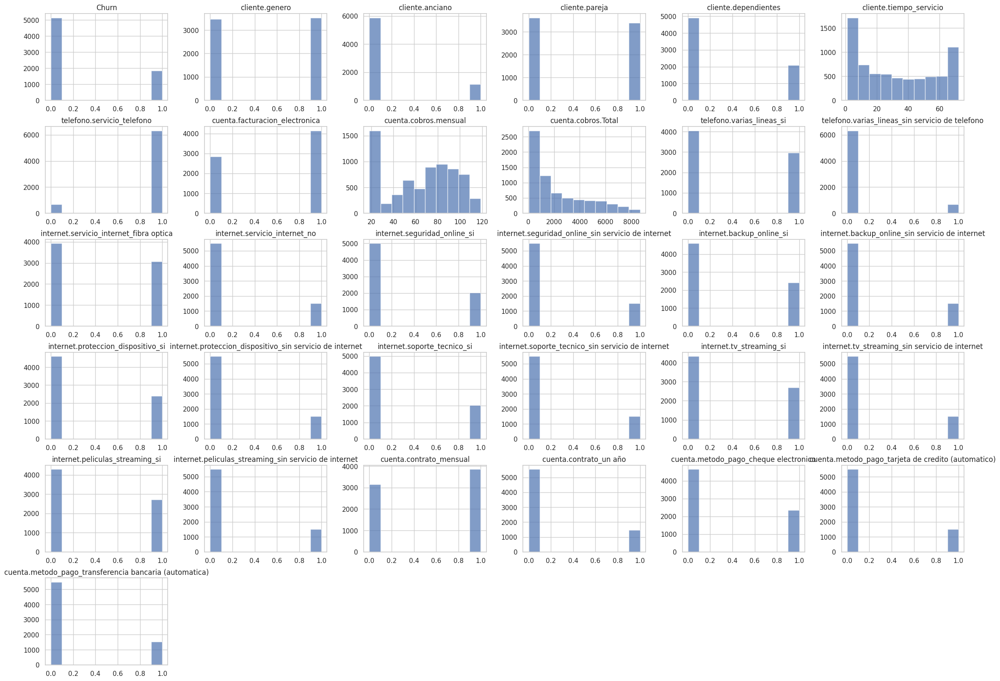

In [150]:
# Configuración de rcParams
plt.rcParams['axes.titlesize'] = 'large'    # Tamaño del título
plt.rcParams['axes.labelsize'] = 'medium'   # Tamaño de las etiquetas
plt.rcParams['xtick.labelsize'] = 'medium'   # Tamaño de las etiquetas del eje x
plt.rcParams['ytick.labelsize'] = 'medium'   # Tamaño de las etiquetas del eje y
plt.rcParams['legend.fontsize'] = 'medium'   # Tamaño de la leyenda
plt.rcParams['lines.linewidth'] = 2           # Ancho de línea
plt.rcParams['lines.color'] = 'blue'          # Color de las líneas

plt.rcParams['figure.figsize'] = [28,20];
sns.set(style="whitegrid")
datos_churn_norm_2.hist(alpha=0.7)
plt.show()

* Una variable a analizar es cliente.genero, ya que vemos en el histograma que practicamente tienen la misma proporción, lo cual nos indicaría que tenemos datos de ambos géneros. Sin embargo, si analizamos su relación con churn obtenemos:

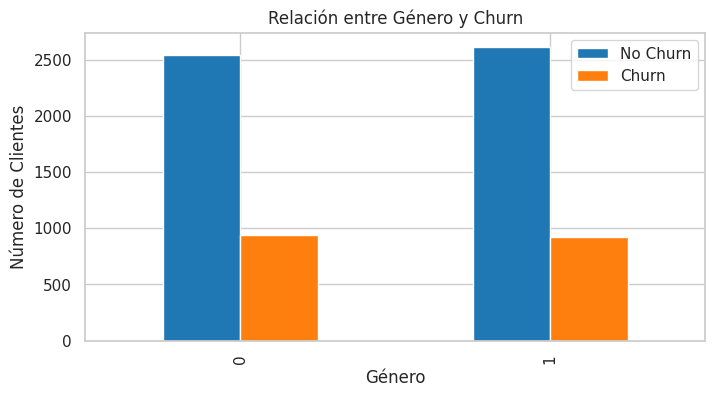

In [151]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['cliente.genero'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre Género y Churn')
plt.xlabel('Género')
plt.ylabel('Número de Clientes')
plt.show()

* Vemos que tienen la misma proporción en todo, por ende consideramos no relevante, ya que para cualquier clase tiene la misma proporción de churn, sea hombre o mujer tiene la misma razón de fuga.

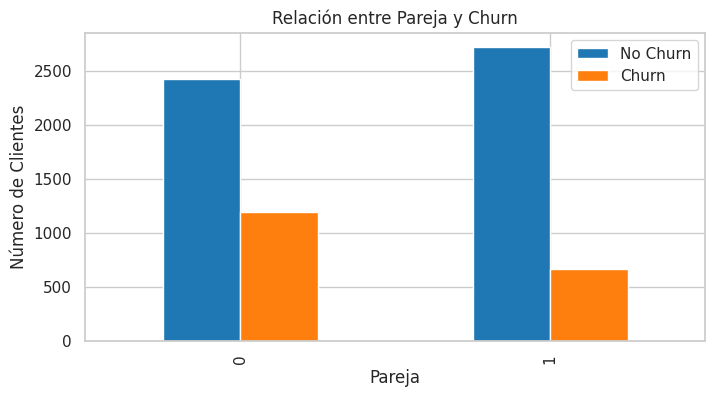

In [152]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['cliente.pareja'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre Pareja y Churn')
plt.xlabel('Pareja')
plt.ylabel('Número de Clientes')
plt.show()

* podemos observar que si tiene pareja se fuga menos, y cuando no tiene pareja se fuga más, esto podría darse debido a que en pareja se pasa más tiempo en casa y se usa más el servicio completo de telecomunicaciones y se tiende a cambiar menos. Variable a considerar.

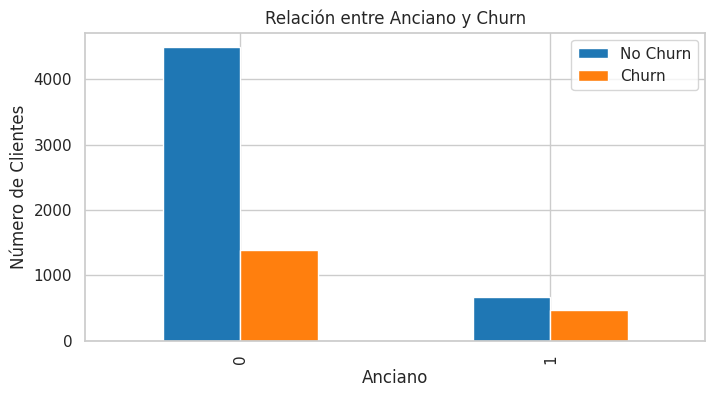

In [153]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['cliente.anciano'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre Anciano y Churn')
plt.xlabel('Anciano')
plt.ylabel('Número de Clientes')
plt.show()

* Esta variable es a considerar, ya que vemos que si bien hay pocos ancianos, notamos que practicamente todos los ancianos tienden a fugar.

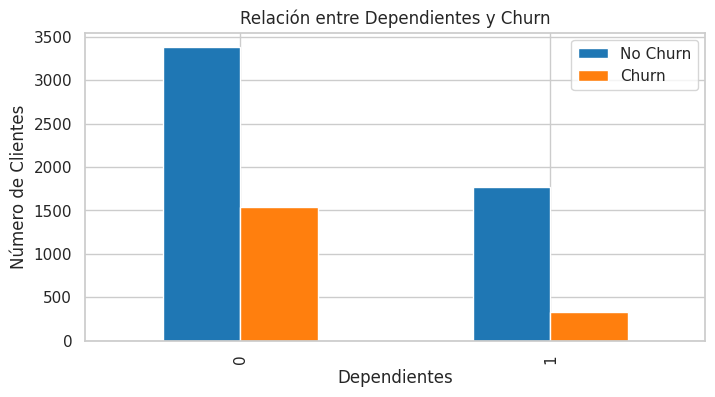

In [154]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['cliente.dependientes'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre Dependientes y Churn')
plt.xlabel('Dependientes')
plt.ylabel('Número de Clientes')
plt.show()

* Variable a considerar, ya que notamos que si tiene dependientes tiende a fugar menos en proporcion a su cantidad de valores, que comparado cuando no tiene dependientes, ya que ahi tiende a fugar más en proporción a su cantidad de valores. Variable que aporta valor para detectar CHURN SI.

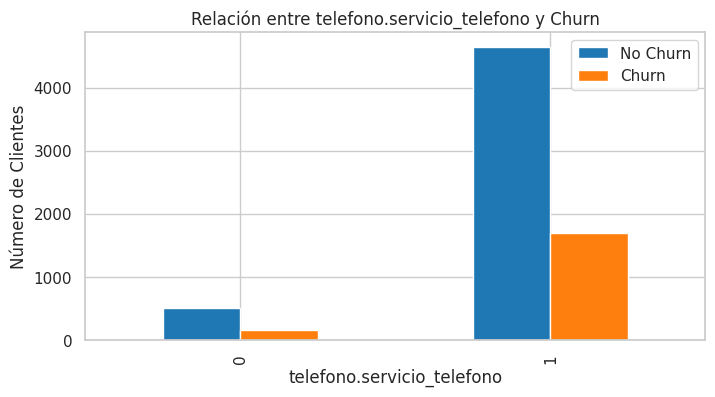

In [155]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['telefono.servicio_telefono'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre telefono.servicio_telefono y Churn')
plt.xlabel('telefono.servicio_telefono')
plt.ylabel('Número de Clientes')
plt.show()

* Observamos que los que tienen servicio de telefono, son casi todos y por ende aca es donde se observa mayor cantidad de gente que fuga. Sin embargo, las personas que no tienen telefono son pocos, pero en proporcion con personas que salen, se puede considerar y no despreciar. Recomendaría no eliminar esta variable.

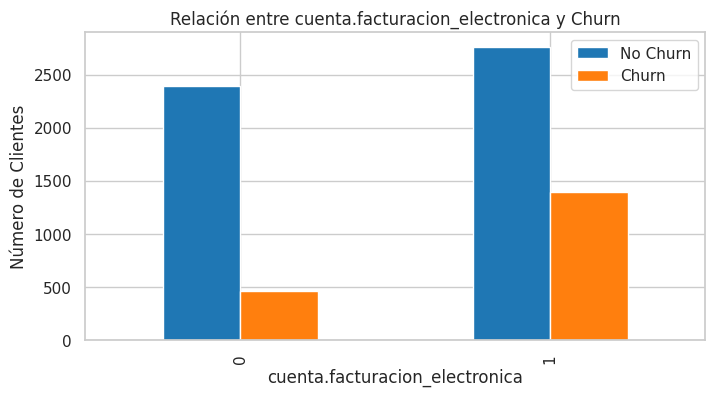

In [156]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['cuenta.facturacion_electronica'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre cuenta.facturacion_electronica y Churn')
plt.xlabel('cuenta.facturacion_electronica')
plt.ylabel('Número de Clientes')
plt.show()

* Variable a considerar, ya que para las dos clases se tiene los dos churn, en buena porción.

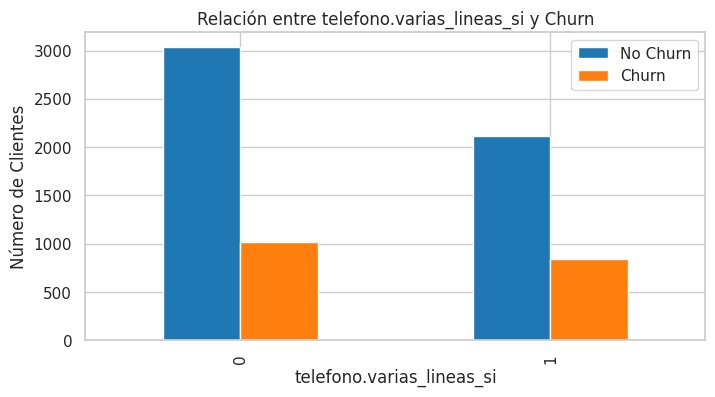

In [157]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['telefono.varias_lineas_si'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre telefono.varias_lineas_si y Churn')
plt.xlabel('telefono.varias_lineas_si')
plt.ylabel('Número de Clientes')
plt.show()

* Veo que existe casi la misma proporción de personas que se van, si tienen o no tienen linea, pero considero que esta variable si aporta valor al modelo.

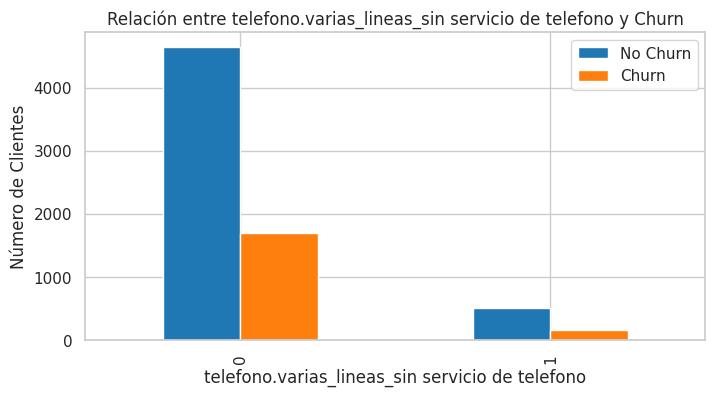

In [158]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['telefono.varias_lineas_sin servicio de telefono'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre telefono.varias_lineas_sin servicio de telefono y Churn')
plt.xlabel('telefono.varias_lineas_sin servicio de telefono')
plt.ylabel('Número de Clientes')
plt.show()

* Consideramos que esta variable puede que si aporte valor, pero en menor medida, analizando si descartarla.

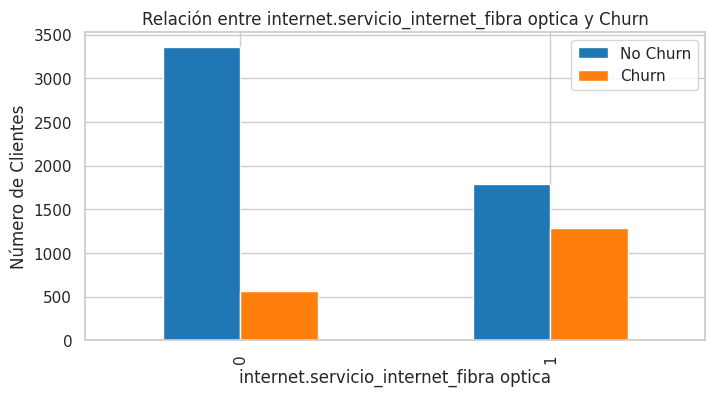

In [159]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['internet.servicio_internet_fibra optica'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre internet.servicio_internet_fibra optica y Churn')
plt.xlabel('internet.servicio_internet_fibra optica')
plt.ylabel('Número de Clientes')
plt.show()

* Esta variable si aporta valor, mayormente fugan las personas que están con fibra optica, comparado en proporción de su cantidad de valores, podría ser por costos altos.

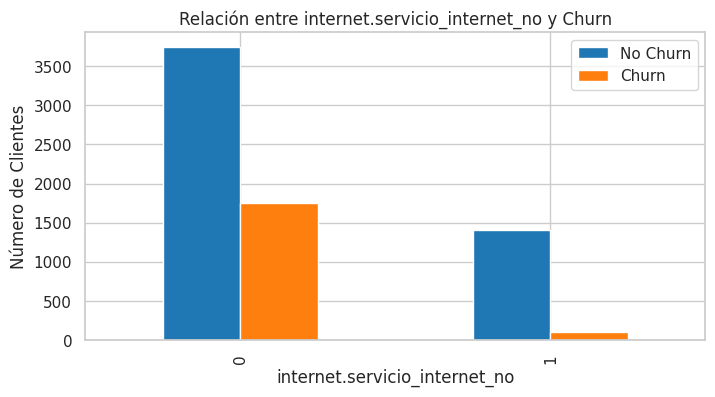

In [160]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['internet.servicio_internet_no'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre internet.servicio_internet_no y Churn')
plt.xlabel('internet.servicio_internet_no')
plt.ylabel('Número de Clientes')
plt.show()

* Vemos una desproporción en los datos, mayormente en esta variable fugan los que tienen servicio de internet, comparado con los que no tienen. Variable que por lo general tiende a una clase. Descartamos.

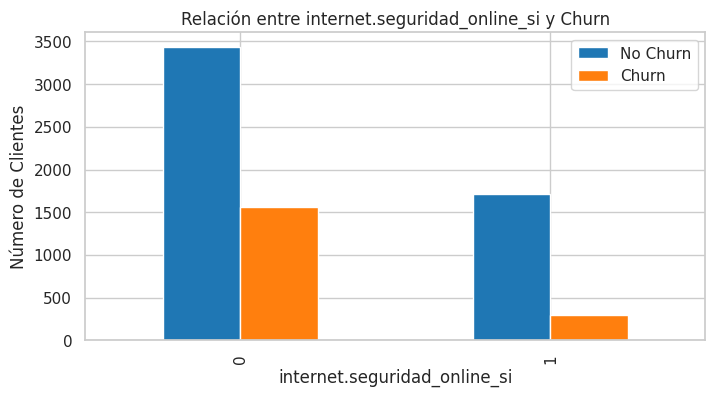

In [161]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['internet.seguridad_online_si'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre internet.seguridad_online_si y Churn')
plt.xlabel('internet.seguridad_online_si')
plt.ylabel('Número de Clientes')
plt.show()

* Variable a considerar, se observa relación en proporción.

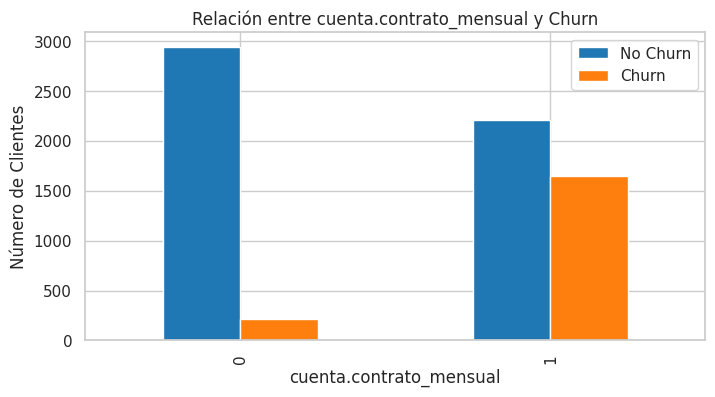

In [162]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['cuenta.contrato_mensual'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre cuenta.contrato_mensual y Churn')
plt.xlabel('cuenta.contrato_mensual')
plt.ylabel('Número de Clientes')
plt.show()

* Si bien vemos que el churn positivo se da cuando tienden a contratar por mes, esto no necesariamente es indicativo para elimianrlo, ya que para este aspecto tambien existen contratos por año y dos años, quizás esta variable si nos ayuda comparandola con las demás. Se mantiene.

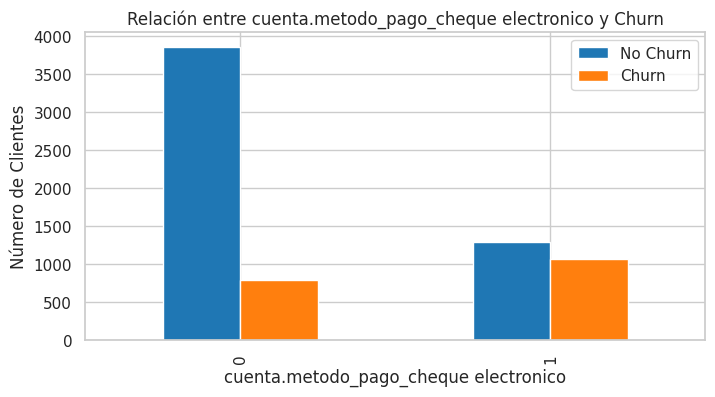

In [163]:
# Crear tabla de contingencia
tabla_contingencia = pd.crosstab(datos_churn_norm_2['cuenta.metodo_pago_cheque electronico'], datos_churn_norm_2['Churn'], margins=False)

# Renombrar las columnas para mayor claridad
tabla_contingencia.columns = ['No Churn', 'Churn']

# Graficar
tabla_contingencia.plot(kind='bar', figsize=(8, 4), color=['#1f77b4', '#ff7f0e'])
plt.title('Relación entre cuenta.metodo_pago_cheque electronico y Churn')
plt.xlabel('cuenta.metodo_pago_cheque electronico')
plt.ylabel('Número de Clientes')
plt.show()

* En los métodos de pago, consideramos que si aportan valor para determinar en el modelo si hay fuga o no. No se descarta ninguna.

In [164]:
variables_descartar = ['cliente.genero', 'internet.servicio_internet_no']

In [165]:
datos_churn_norm_2.drop(columns=variables_descartar, inplace=True)
datos_churn_norm_2.head()

,Churn,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,cuenta.facturacion_electronica,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.servicio_internet_fibra optica,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica)
0,0,0,0,0,9.0,1,0,59.9,542.40,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,1,0,0,0,4.0,1,1,73.9,280.85,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
2,1,1,1,0,13.0,1,1,98.0,1237.85,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0
3,1,1,1,0,3.0,1,1,83.9,267.40,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0
4,0,0,0,1,9.0,1,1,69.4,571.45,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0


* Sabemos que existe correlación entre las variables cliente.tiempo_servicio, cuenta.cobros.mensual y cuenta.cobros.Total, ya que el último es la múltiplicación de ambos.
* Esto genera una interdependencia lineal entre variables, por ende decidimos realizar un creación de una nueva variable que será tasa_cobro, la cual será la división de cobros.Total/cliente.tiempo_servicio, de esta manera podremos eliminar estas dos variables y no perder su aporte al modelo.

In [166]:
datos_churn_norm_2['tasa_cobro'] = round(datos_churn_norm_2['cuenta.cobros.Total']/datos_churn_norm_2['cliente.tiempo_servicio'], 2)
# datos_churn_norm_2.drop(columns=['cuenta.cobros.Total', 'cliente.tiempo_servicio'], inplace=True)
datos_churn_norm_2.head()

,Churn,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,cuenta.facturacion_electronica,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.servicio_internet_fibra optica,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica),tasa_cobro
0,0,0,0,0,9.0,1,0,59.9,542.40,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,60.27
1,1,0,0,0,4.0,1,1,73.9,280.85,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,70.21
2,1,1,1,0,13.0,1,1,98.0,1237.85,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0,95.22
3,1,1,1,0,3.0,1,1,83.9,267.40,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,89.13
4,0,0,0,1,9.0,1,1,69.4,571.45,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0,63.49


In [167]:
datos_churn_norm_2['tasa_cobro'].min(), datos_churn_norm_2['tasa_cobro'].max()

(13.78, 121.4)

* Ahora aplicaremos la Transformación Box-Cox de las variables contínuas.

In [168]:
from scipy import stats

# Aplicar la transformación Box-Cox
variables_continuas = ['cuenta.cobros.mensual', 'tasa_cobro', 'cuenta.cobros.Total', 'cliente.tiempo_servicio']
for col in variables_continuas:
    # # Asegú de que no haya valores negativos, ya que Box-Cox requiere datos positivos
    # if (df[col] <= 0).any():
    #     raise ValueError(f"La columna {col} contiene valores cero o negativos. Box-Cox no puede aplicarse.")
    datos_churn_norm_2[col], lambda_param = stats.boxcox(datos_churn_norm_2[col])
    print(f"Transformación de {col} realizada con lambda = {lambda_param}")

Transformación de cuenta.cobros.mensual realizada con lambda = 0.9186694405013563
Transformación de tasa_cobro realizada con lambda = 0.9087829860564308
Transformación de cuenta.cobros.Total realizada con lambda = 0.2541879184564337
Transformación de cliente.tiempo_servicio realizada con lambda = 0.4572353614972442


In [169]:
datos_churn_norm_2.head()

,Churn,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,cuenta.facturacion_electronica,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.servicio_internet_fibra optica,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica),tasa_cobro
0,0,0,0,0,3.785683,1,0,45.653592,15.558788,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,44.531205
1,1,0,0,0,1.935278,1,1,55.601575,12.555791,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,51.321893
2,1,1,1,0,4.879282,1,1,72.383032,20.107535,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0,68.046782
3,1,1,1,0,1.427182,1,1,62.611854,12.351369,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,64.015724
4,0,0,0,1,3.785683,1,1,52.422264,15.819021,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0,46.741453


#**3. Modelo Random Forest**


---

### **3.1 Modelo Random Forest con datos sin segmentar**

In [170]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

y = datos_churn_new['Churn']
x = datos_churn_new.drop(columns = 'Churn')

## estandarizando nuestro dataframe previo a ingresarlo al modelo
stdscaler = StandardScaler()
x_scaled = stdscaler.fit_transform(x)

x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.25, random_state=42)

rf = RandomForestClassifier(random_state=50)
rf.fit(x_train, y_train)

y_pred = rf.predict(x_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

Accuracy: 0.798745724059293


In [171]:
rf.score(x_test, y_test)

0.798745724059293

In [172]:
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1289
           1       0.66      0.49      0.56       465

    accuracy                           0.80      1754
   macro avg       0.75      0.70      0.72      1754
weighted avg       0.79      0.80      0.79      1754



### **3.2 Modelo Random Forest con datos segmentados**

In [173]:
y_2 = datos_churn_segmentado['Churn']
x_2 = datos_churn_segmentado.drop(columns = 'Churn')

## estandarizando nuestro dataframe previo a ingresarlo al modelo
stdscaler_2 = StandardScaler()
x_scaled_2 = stdscaler_2.fit_transform(x_2)

x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(x_scaled_2, y_2, test_size=0.25, random_state=42)

rf_2 = RandomForestClassifier(random_state=50)
rf_2.fit(x_train_2, y_train_2)

rf_2.score(x_test_2, y_test_2)

0.7884834663625998

In [174]:
y_pred_2 = rf_2.predict(x_test_2)
report_2 = classification_report(y_test_2, y_pred_2)
print(report_2)

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1289
           1       0.63      0.48      0.55       465

    accuracy                           0.79      1754
   macro avg       0.73      0.69      0.70      1754
weighted avg       0.78      0.79      0.78      1754



### **3.3 Modelo Random Forest con aplicaciones logarítmicas en los datos**

In [175]:
y_3 = datos_churn_log['Churn']
x_3 = datos_churn_log.drop(columns = 'Churn')

## estandarizando nuestro dataframe previo a ingresarlo al modelo
stdscaler_3 = StandardScaler()
x_scaled_3 = stdscaler_3.fit_transform(x_3)

x_train_3, x_test_3, y_train_3, y_test_3 = train_test_split(x_scaled_3, y_3, test_size=0.25, random_state=42)

rf_3 = RandomForestClassifier(random_state=50)
rf_3.fit(x_train_3, y_train_3)

rf_3.score(x_test_3, y_test_3)

0.7998859749144812

In [176]:
y_pred_3 = rf_3.predict(x_test_3)
report_3 = classification_report(y_test_3, y_pred_3)
print(report_3)

              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1289
           1       0.66      0.50      0.57       465

    accuracy                           0.80      1754
   macro avg       0.75      0.70      0.72      1754
weighted avg       0.79      0.80      0.79      1754



### **3.4 Modelo Random Forest con Transformación Box-Cox en los datos**

In [177]:
y_4 = datos_churn_box['Churn']
x_4 = datos_churn_box.drop(columns = 'Churn')

## estandarizando nuestro dataframe previo a ingresarlo al modelo
stdscaler_4 = StandardScaler()
x_scaled_4 = stdscaler_4.fit_transform(x_4)

x_train_4, x_test_4, y_train_4, y_test_4 = train_test_split(x_4, y_4, test_size=0.25, random_state=42)

rf_4 = RandomForestClassifier(random_state=50)
rf_4.fit(x_train_4, y_train_4)

rf_4.score(x_test_4, y_test_4)

0.7998859749144812

In [178]:
y_pred_4 = rf_4.predict(x_test_4)
report_4 = classification_report(y_test_4, y_pred_4)
print(report_4)

              precision    recall  f1-score   support

           0       0.83      0.91      0.87      1289
           1       0.66      0.50      0.57       465

    accuracy                           0.80      1754
   macro avg       0.75      0.70      0.72      1754
weighted avg       0.79      0.80      0.79      1754



### **3.5 Modelo Random Forest con Eliminación de variables y Transformación Box-Cox en los datos**

In [179]:
y_5 = datos_churn_norm['Churn']
x_5 = datos_churn_norm.drop(columns = 'Churn')

## estandarizando nuestro dataframe previo a ingresarlo al modelo
stdscaler_5 = StandardScaler()
x_scaled_5 = stdscaler_5.fit_transform(x_5)

x_train_5, x_test_5, y_train_5, y_test_5 = train_test_split(x_scaled_5, y_5, test_size=0.25, random_state=42)

rf_5 = RandomForestClassifier(random_state=50)
rf_5.fit(x_train_5, y_train_5)

rf_5.score(x_test_5, y_test_5)

0.8027366020524516

In [180]:
y_pred_5 = rf_5.predict(x_test_5)
report_5 = classification_report(y_test_5, y_pred_5)
print(report_5)

              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1289
           1       0.67      0.51      0.58       465

    accuracy                           0.80      1754
   macro avg       0.75      0.71      0.72      1754
weighted avg       0.79      0.80      0.79      1754



### **3.6 Modelo Random Forest con Feature engineering, Eliminación de variables y Transformación Box-Cox en los datos**

In [372]:
import time
from sklearn.metrics import f1_score

y_6 = datos_churn_norm_2['Churn']
x_6 = datos_churn_norm_2.drop(columns = 'Churn')

## estandarizando nuestro dataframe previo a ingresarlo al modelo
stdscaler_6 = StandardScaler()
x_scaled_6 = stdscaler_6.fit_transform(x_6)

x_train_6, x_test_6, y_train_6, y_test_6 = train_test_split(x_scaled_6, y_6, test_size=0.25, random_state=42)

rf_6 = RandomForestClassifier(random_state=50)

start_time = time.time()  # Iniciar temporizador
rf_6.fit(x_train_6, y_train_6)
end_time = time.time()  # Finalizar temporizador

# Calcular el tiempo total en segundos
training_time_6 = end_time - start_time

# Evaluar el modelo en los datos de prueba
accuracy_test_propio = rf_6.score(x_test_6, y_test_6)
f1_score_test_propio = f1_score(y_test_6, rf_6.predict(x_test_6), average='weighted')
print(f"Accuracy: {accuracy_test_propio}")
print(f"F1-Score: {f1_score_test_propio}")
print(f"Tiempo de entrenamiento: {training_time_6} segundos")
print(f"Número de características seleccionadas: {len(x_6.columns)}")

Accuracy: 0.8044469783352337
F1-Score: 0.7958292078619782
Tiempo de entrenamiento: 0.783104419708252 segundos
Número de características seleccionadas: 29


In [373]:
metricas_propio = pd.DataFrame({
    'Modelo': ['Random Forest'],
    'Técnica': ['Feature_engineering'],
    'Accuracy': [accuracy_test_propio],
    'F1-Score': [f1_score_test_propio],
    'Tiempo de entrenamiento': [training_time_6],
    '# de features': [len(x_6.columns)]
})
metricas_propio

,Modelo,Técnica,Accuracy,F1-Score,Tiempo de entrenamiento,# de features
0,Random Forest,Feature_engineering,0.804447,0.795829,0.783104,29


In [182]:
y_pred_6 = rf_6.predict(x_test_6)
report_6 = classification_report(y_test_6, y_pred_6)
print(report_6)

              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1289
           1       0.67      0.52      0.58       465

    accuracy                           0.80      1754
   macro avg       0.75      0.71      0.73      1754
weighted avg       0.79      0.80      0.80      1754



In [183]:
#0.8044469783352337

#**4. Reducción de Dimensionalidad**

---

##**4.1 Métodos Gráficos**


In [195]:
def diagrama_puntos(df):
    df = df[df.select_dtypes(include='int').columns]
    # y = df['Churn']
    # x = df.drop(columns='Churn')
    # df = pd.concat([y, x.iloc[:, inicio:fin]], axis=1)
    df_melted = pd.melt(df, id_vars='Churn', var_name='features', value_name='valores')

    plt.figure(figsize=(12, 6))
    sns.pointplot(x="features", y="valores", hue="Churn", data=df_melted)
    plt.xticks(rotation=90)
    plt.title(f'Diagrama de Puntos de la distribución de características respecto al Churn', pad=10)
    plt.show()

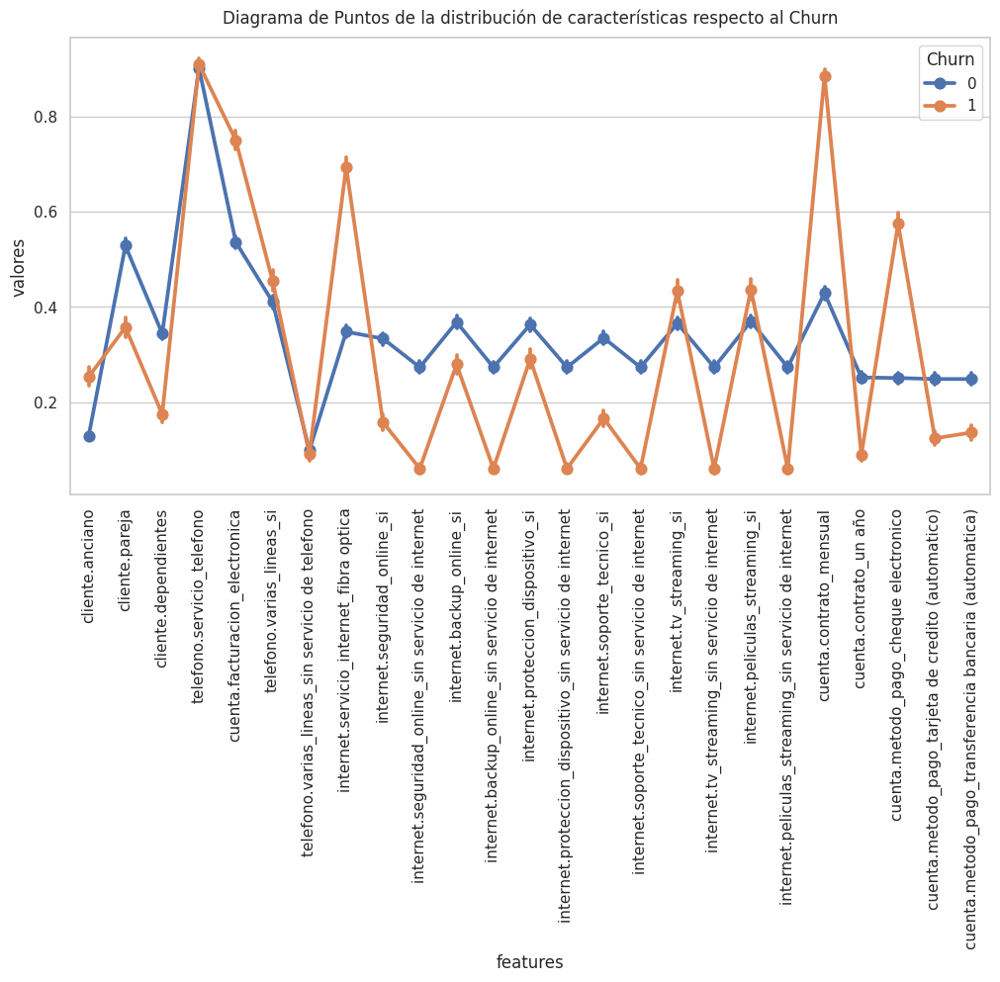

In [196]:
diagrama_puntos(datos_churn_norm_2)

In [184]:
df = datos_churn_norm_2[datos_churn_norm_2.select_dtypes(include='int').columns]
df.head()

,Churn,cliente.anciano,cliente.pareja,cliente.dependientes,telefono.servicio_telefono,cuenta.facturacion_electronica,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.servicio_internet_fibra optica,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica)
0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
2,1,1,1,0,1,1,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0
3,1,1,1,0,1,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0
4,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0


In [197]:
##Realizamos un dataframe para hacer un formato largo con melt, facilitando la visualización
df_melted = pd.melt(df, id_vars='Churn', var_name='features', value_name='valores')
df_melted.head()

,Churn,features,valores
0,0,cliente.anciano,0
1,1,cliente.anciano,0
2,1,cliente.anciano,1
3,1,cliente.anciano,1
4,0,cliente.anciano,0


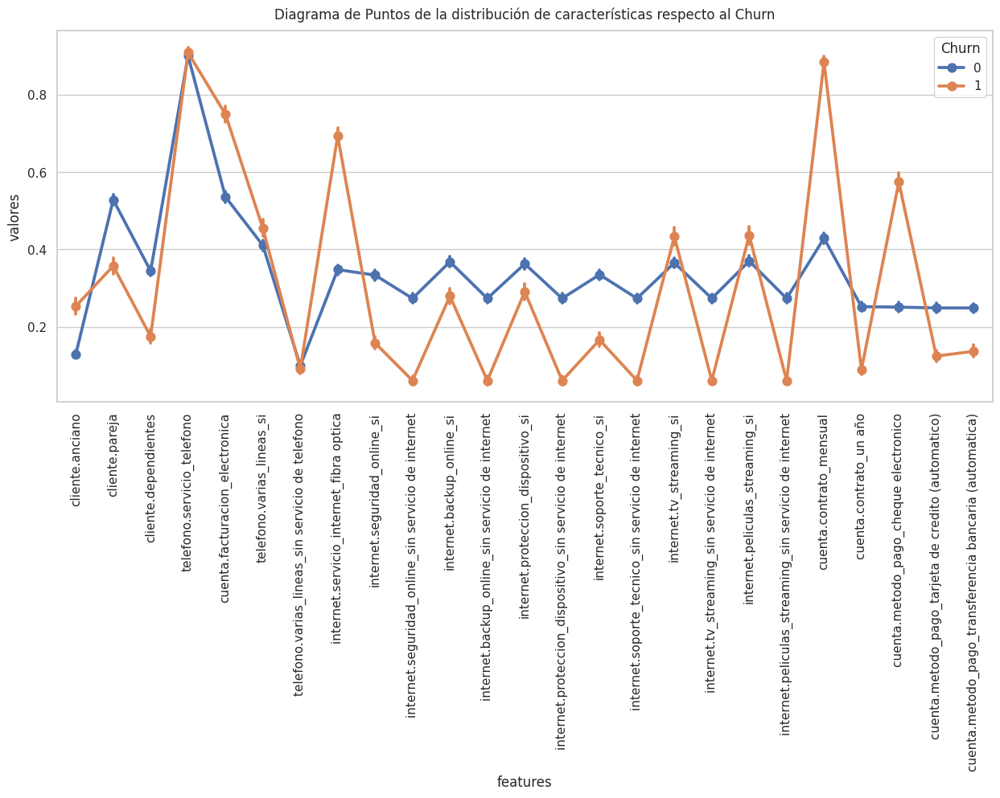

In [194]:
## Diagrama de puntos para analizar la distribución de características respecto al Churn.
plt.figure(figsize=(15, 6))
sns.pointplot(x="features", y="valores", hue="Churn", data=df_melted)
plt.xticks(rotation=90)
plt.title('Diagrama de Puntos de la distribución de características respecto al Churn', pad=10)
plt.show()

* Después de analizar el gráfico de distribución de características de los features con respecto al Churn, podemos concluir que algunas variables no aportan mucho valor al modelo, debido a que es indiferente al valor que resulte, puede salir un Churn 0 ó Churn 1. No nos da un resultado claro.
* Estas variables son: telefono.servicio_telefono, telefono.varias_lineas_si y telefono.varias_lineas_sin servicio de telefono.

In [198]:
## Eliminando esas variables del dataframe
df_grafic = df.drop(columns=['telefono.servicio_telefono', 'telefono.varias_lineas_si', 'telefono.varias_lineas_sin servicio de telefono'])
df_grafic.head()

,Churn,cliente.anciano,cliente.pareja,cliente.dependientes,cuenta.facturacion_electronica,internet.servicio_internet_fibra optica,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica)
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0
2,1,1,1,0,1,1,0,0,1,0,1,0,0,0,1,0,1,0,1,0,1,0,0
3,1,1,1,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0


**RANDOM FOREST SIN BALANCEO**

In [370]:
import time
from sklearn.metrics import f1_score

df_grafic = datos_churn_norm_2.drop(columns=['telefono.servicio_telefono', 'telefono.varias_lineas_si', 'telefono.varias_lineas_sin servicio de telefono'])

## Aplicando el modelo Random Forest y viendo la mejora
y_grafic = df_grafic['Churn']
x_grafic = df_grafic.drop(columns='Churn')

## estandarizando nuestro dataframe previo a ingresarlo al modelo
stdscaler_grafic = StandardScaler()
x_scaled_grafic = stdscaler_grafic.fit_transform(x_grafic)

x_train_grafic, x_test_grafic, y_train_grafic, y_test_grafic = train_test_split(x_scaled_grafic, y_grafic, test_size=0.25, random_state=42)

rf_grafic = RandomForestClassifier(random_state=50)

start_time = time.time()  # Iniciar temporizador
rf_grafic.fit(x_train_grafic, y_train_grafic)
end_time = time.time()  # Finalizar temporizador

# Calcular el tiempo total en segundos
training_time_grafic = end_time - start_time

# Evaluar el modelo en los datos de prueba
accuracy_test_grafic = rf_grafic.score(x_test_grafic, y_test_grafic)
f1_score_test_grafic = f1_score(y_test_grafic, rf_grafic.predict(x_test_grafic), average='weighted')
print(f"Accuracy: {accuracy_test_grafic}")
print(f"F1-Score: {f1_score_test_grafic}")
print(f"Tiempo de entrenamiento: {training_time_grafic} segundos")
print(f"Número de características seleccionadas: {len(x_grafic.columns)}")

Accuracy: 0.7998859749144812
F1-Score: 0.7916661034191252
Tiempo de entrenamiento: 1.3921120166778564 segundos
Número de características seleccionadas: 26


* Vemos que no mejoro el modelo, pero tampoco bajó en valor de accuracy, eso quiere decir que las variables que eliminamos, en realidad no aportaban valor. De esta manera tenemos un modelo con menos variables, menor coste computacional.

In [371]:
metricas_grafic = pd.DataFrame({
    'Modelo': ['Random Forest'],
    'Técnica': ['Graficos'],
    'Accuracy': [accuracy_test_grafic],
    'F1-Score': [f1_score_test_grafic],
    'Tiempo de entrenamiento': [training_time_grafic],
    '# de features': [len(x_grafic.columns)]
})
metricas_grafic

,Modelo,Técnica,Accuracy,F1-Score,Tiempo de entrenamiento,# de features
0,Random Forest,Graficos,0.799886,0.791666,1.392112,26


**RANDOM FOREST CON BALANCEO**

In [242]:
from imblearn.over_sampling import SMOTE
## Aplicando el modelo Random Forest y viendo la mejora
y_grafic = datos_churn_norm_2['Churn']
x_grafic = datos_churn_norm_2.drop(columns='Churn')

## estandarizando nuestro dataframe previo a ingresarlo al modelo
stdscaler_grafic = StandardScaler()
x_scaled_grafic = stdscaler_grafic.fit_transform(x_grafic)

x_train_grafic, x_test_grafic, y_train_grafic, y_test_grafic = train_test_split(x_scaled_grafic, y_grafic, test_size=0.25, random_state=42)

# Aplicar SMOTE para balancear el conjunto de entrenamiento
smo = SMOTE(random_state=42)
x_train_balanced, y_train_balanced = smo.fit_resample(x_train_grafic, y_train_grafic)

rf_grafic = RandomForestClassifier(random_state=50)
rf_grafic.fit(x_train_balanced, y_train_balanced)

rf_grafic.score(x_test_grafic, y_test_grafic)

0.7976054732041049

##**4.2 Mapa de Calor**

In [210]:
corr = datos_churn_norm_2.corr()
corr

,Churn,cliente.anciano,cliente.pareja,cliente.dependientes,cliente.tiempo_servicio,telefono.servicio_telefono,cuenta.facturacion_electronica,cuenta.cobros.mensual,cuenta.cobros.Total,telefono.varias_lineas_si,telefono.varias_lineas_sin servicio de telefono,internet.servicio_internet_fibra optica,internet.seguridad_online_si,internet.seguridad_online_sin servicio de internet,internet.backup_online_si,internet.backup_online_sin servicio de internet,internet.proteccion_dispositivo_si,internet.proteccion_dispositivo_sin servicio de internet,internet.soporte_tecnico_si,internet.soporte_tecnico_sin servicio de internet,internet.tv_streaming_si,internet.tv_streaming_sin servicio de internet,internet.peliculas_streaming_si,internet.peliculas_streaming_sin servicio de internet,cuenta.contrato_mensual,cuenta.contrato_un año,cuenta.metodo_pago_cheque electronico,cuenta.metodo_pago_tarjeta de credito (automatico),cuenta.metodo_pago_transferencia bancaria (automatica),tasa_cobro
Churn,1.000000,0.148901,-0.151093,-0.163444,-0.376238,0.012212,0.192021,0.194716,-0.238610,0.039400,-0.012212,0.307689,-0.171299,-0.227739,-0.082314,-0.227739,-0.067000,-0.227739,-0.164225,-0.227739,0.061880,-0.227739,0.060813,-0.227739,0.404742,-0.176800,0.302387,-0.133685,-0.119761,0.193950
cliente.anciano,0.148901,1.000000,0.016921,-0.210151,0.018339,0.007713,0.155528,0.219090,0.104526,0.142494,-0.007713,0.255099,-0.038198,-0.182400,0.066798,-0.182400,0.057031,-0.182400,-0.061589,-0.182400,0.103223,-0.182400,0.118495,-0.182400,0.139124,-0.046618,0.170317,-0.022317,-0.016318,0.216816
cliente.pareja,-0.151093,0.016921,1.000000,0.452277,0.381385,0.018267,-0.015786,0.094119,0.343296,0.141519,-0.018267,-0.000556,0.142756,0.001674,0.140012,0.001674,0.154454,0.001674,0.119893,0.001674,0.123726,0.001674,0.116739,0.001674,-0.280923,0.081407,-0.083491,0.081714,0.110180,0.093084
cliente.dependientes,-0.163444,-0.210151,0.452277,1.000000,0.169271,0.000136,-0.111106,-0.115161,0.086498,-0.024469,-0.000136,-0.166458,0.081305,0.140532,0.022433,0.140532,0.014444,0.140532,0.062801,0.140532,-0.016483,0.140532,-0.039703,0.140532,-0.231514,0.065920,-0.149136,0.060332,0.051056,-0.115465
cliente.tiempo_servicio,-0.376238,0.018339,0.381385,0.169271,1.000000,0.006371,0.006150,0.240838,0.902275,0.332008,-0.006371,0.020396,0.319433,-0.036795,0.351239,-0.036795,0.356532,-0.036795,0.318139,-0.036795,0.280300,-0.036795,0.284464,-0.036795,-0.636600,0.239857,-0.206312,0.231646,0.243360,0.239441
telefono.servicio_telefono,0.012212,0.007713,0.018267,0.000136,0.006371,1.000000,0.017061,0.242905,0.084207,0.279885,-1.000000,0.289992,-0.092959,0.172304,-0.051834,0.172304,-0.071746,0.172304,-0.096772,0.172304,-0.023357,0.172304,-0.033496,0.172304,-0.001516,-0.002676,0.003666,-0.008921,0.007719,0.242393
cuenta.facturacion_electronica,0.192021,0.155528,-0.015786,-0.111106,0.006150,0.017061,1.000000,0.354217,0.152974,0.162327,-0.017061,0.329166,-0.003425,-0.320657,0.125953,-0.320657,0.104369,-0.320657,0.038131,-0.320657,0.223729,-0.320657,0.212222,-0.320657,0.168752,-0.051117,0.208697,-0.013431,-0.017309,0.351717
cuenta.cobros.mensual,0.194716,0.219090,0.094119,-0.115161,0.240838,0.242905,0.354217,1.000000,0.615045,0.486896,-0.242905,0.783454,0.299590,-0.773126,0.441400,-0.773126,0.481403,-0.773126,0.339162,-0.773126,0.625884,-0.773126,0.624037,-0.773126,0.064143,0.004131,0.273666,0.028599,0.042618,0.996340
cuenta.cobros.Total,-0.238610,0.104526,0.343296,0.086498,0.902275,0.084207,0.152974,0.615045,1.000000,0.465816,-0.084207,0.322930,0.404444,-0.381517,0.483667,-0.381517,0.502131,-0.381517,0.417957,-0.381517,0.489002,-0.381517,0.492894,-0.381517,-0.469712,0.209614,-0.059331,0.198609,0.211531,0.614666
telefono.varias_lineas_si,0.039400,0.142494,0.141519,-0.024469,0.332008,0.279885,0.162327,0.486896,0.465816,1.000000,-0.279885,0.365460,0.098614,-0.210289,0.201654,-0.210289,0.200273,-0.210289,0.100021,-0.210289,0.256629,-0.210289,0.258018,-0.210289,-0.089069,-0.002930,0.083175,0.058696,0.076732,0.485417


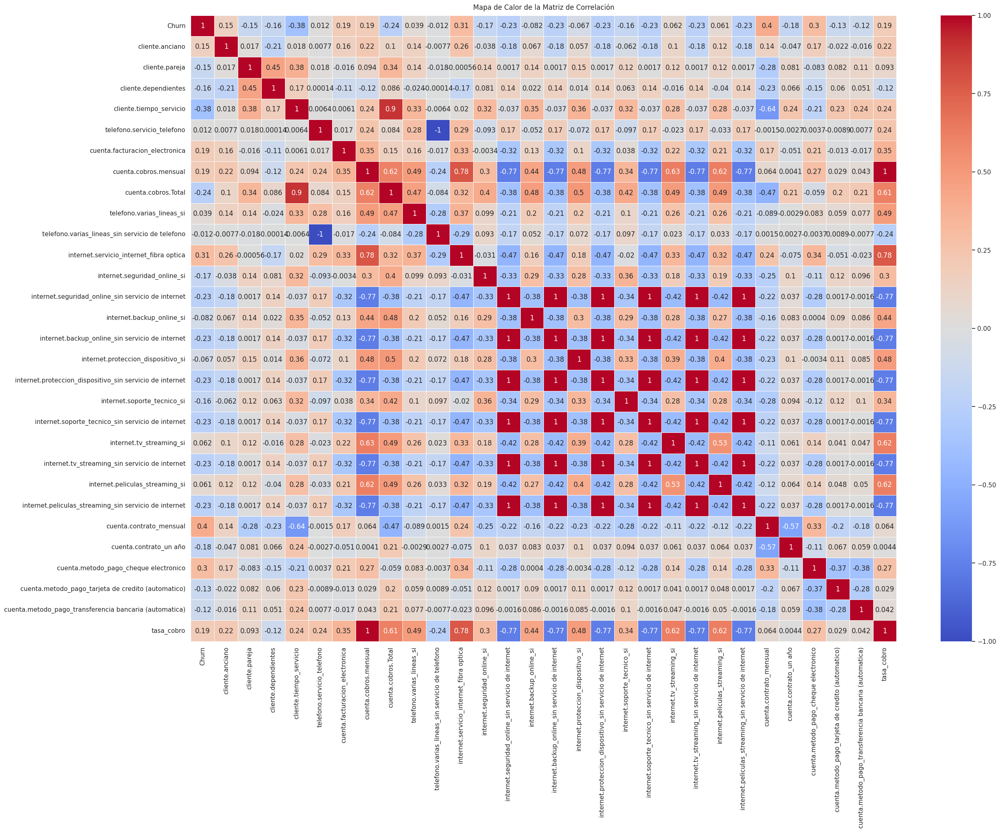

In [204]:
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Mapa de Calor de la Matriz de Correlación', pad=10)
plt.show()

* Observamos que tenemos variables que se correlacionan perfectamente unas de otras. Esto nos muestra que existe multicolinealidad, la cual debemos de trabajar para evitar que afecte a nuestro rendimiento del modelo.

In [211]:
corr_new = corr.drop(columns='Churn')
corr_new.columns

Index(['cliente.anciano', 'cliente.pareja', 'cliente.dependientes',
       'cliente.tiempo_servicio', 'telefono.servicio_telefono',
       'cuenta.facturacion_electronica', 'cuenta.cobros.mensual',
       'cuenta.cobros.Total', 'telefono.varias_lineas_si',
       'telefono.varias_lineas_sin servicio de telefono',
       'internet.servicio_internet_fibra optica',
       'internet.seguridad_online_si',
       'internet.seguridad_online_sin servicio de internet',
       'internet.backup_online_si',
       'internet.backup_online_sin servicio de internet',
       'internet.proteccion_dispositivo_si',
       'internet.proteccion_dispositivo_sin servicio de internet',
       'internet.soporte_tecnico_si',
       'internet.soporte_tecnico_sin servicio de internet',
       'internet.tv_streaming_si',
       'internet.tv_streaming_sin servicio de internet',
       'internet.peliculas_streaming_si',
       'internet.peliculas_streaming_sin servicio de internet',
       'cuenta.contrato_mensual',

In [230]:
## Agrupamos las variables que tienen un valor de correlación mayor de 70
lista_variables_correlacionadas = []
corr_new = corr.drop(columns='Churn')
for i in corr_new.columns:
  ## Consiguiendo un dataframe individual para cada columna
  new = corr_new[i].sort_values(ascending=False).drop(labels=i)
  ## Sacando el index de todos los valores mayores que la condición para esta variable
  variables = new[new>0.7].index
  if variables.empty:
    continue
  lista_variables_correlacionadas.extend(list(variables))
  print(f'Variable correlacionadas > 70 con la varaible {i}: \n {list(variables)}')

print('*********'*10)
lista_variables_correlacionadas = list(set(lista_variables_correlacionadas))
lista_variables_correlacionadas

Variable correlacionadas > 70 con la varaible cliente.tiempo_servicio: 
 ['cuenta.cobros.Total']
Variable correlacionadas > 70 con la varaible cuenta.cobros.mensual: 
 ['tasa_cobro', 'internet.servicio_internet_fibra optica']
Variable correlacionadas > 70 con la varaible cuenta.cobros.Total: 
 ['cliente.tiempo_servicio']
Variable correlacionadas > 70 con la varaible internet.servicio_internet_fibra optica: 
 ['cuenta.cobros.mensual', 'tasa_cobro']
Variable correlacionadas > 70 con la varaible internet.seguridad_online_sin servicio de internet: 
 ['internet.backup_online_sin servicio de internet', 'internet.proteccion_dispositivo_sin servicio de internet', 'internet.tv_streaming_sin servicio de internet', 'internet.peliculas_streaming_sin servicio de internet', 'internet.soporte_tecnico_sin servicio de internet']
Variable correlacionadas > 70 con la varaible internet.backup_online_sin servicio de internet: 
 ['internet.proteccion_dispositivo_sin servicio de internet', 'internet.tv_strea

['internet.backup_online_sin servicio de internet',
 'internet.proteccion_dispositivo_sin servicio de internet',
 'cliente.tiempo_servicio',
 'internet.peliculas_streaming_sin servicio de internet',
 'internet.soporte_tecnico_sin servicio de internet',
 'internet.tv_streaming_sin servicio de internet',
 'internet.seguridad_online_sin servicio de internet',
 'internet.servicio_internet_fibra optica',
 'cuenta.cobros.mensual',
 'cuenta.cobros.Total',
 'tasa_cobro']

Text(0.5, 1.0, 'Mapa de Calor de la Matriz de Correlación - Variables correlacionadas >70')

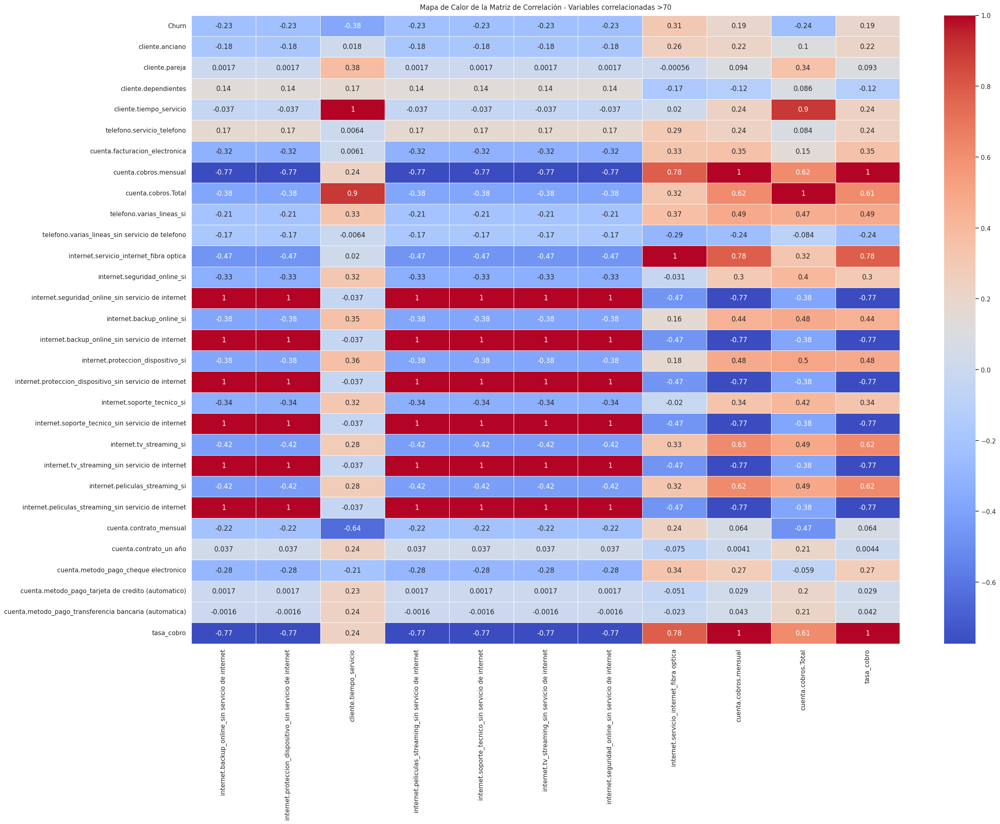

In [233]:
## Analizamos las variables que tienen mayor correlación > 70, para ver cual se puede descartar y cual mantendremos
sns.heatmap(corr_new[lista_variables_correlacionadas], annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Mapa de Calor de la Matriz de Correlación - Variables correlacionadas >70', pad=10)

* Observamos que todas las variables que indican sin servicio de internet se encuentran muy correlacionadas, generando multicolinealidad en el modelo. Es por eso que decidimos descartarlos.

* Notamos también que estas variables se relacionan de cierta manera con internet fibra óptica, tasa cobro, seguridad online si, entre otras. Nos aportan mucha multicolinealidad.

* Entendemos del negocio, que normalmente las personas que tienen un servicio adicional sin tener servicio de internet, es poco probable que abandonen por ese motivo, ya que estan teniendo ventajas sin tener otro servicio adicional, asi que no aportarían valor para nuestro objetivo a determinar.

* Además notamos que tas de cobro y cobro mensual, practicamente son variables con mismos valores de correlación con las demás variables. Se considera eliminar cobro mensual, que por más que aporta cierto valor, al haber creado tasa de cobro y al aportar lo mismo, no vemos la necesidad de mantener esa variable.

* Las demás variables si bien es cierto, también tienen multicolinealidad, consideramos importante para determinar nuestra variable objetivo, consideramos no eliminarlas.


In [234]:
variables_eliminar = ['internet.backup_online_sin servicio de internet',
 'internet.proteccion_dispositivo_sin servicio de internet',
 'internet.peliculas_streaming_sin servicio de internet',
 'internet.soporte_tecnico_sin servicio de internet',
 'internet.tv_streaming_sin servicio de internet',
 'internet.seguridad_online_sin servicio de internet',
 'cuenta.cobros.mensual']

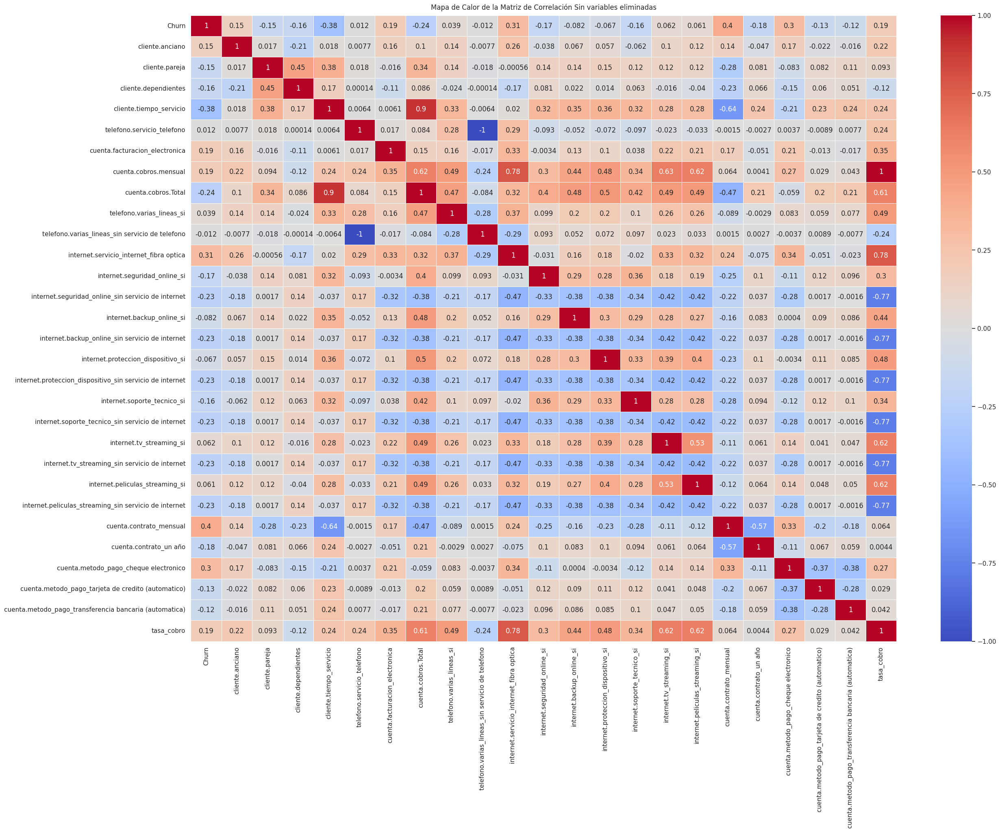

In [236]:
corr_new_2 = corr.drop(columns=variables_eliminar)
sns.heatmap(corr_new_2, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Mapa de Calor de la Matriz de Correlación Sin variables eliminadas', pad=10)
plt.show()

* Si bien es cierto, todavia existe correlación entre varais variables, pero estas correlaciones ya son menores que las que teniamos antes. Consideramos que nuestro modelo puede mejorar solo considerando estas variables.

* Tener en cuenta, que si nuestro modelo mejora o se mantiene en accuracy, también sería positivo, ya que con menos variables, se esta consiguiendo los mismo valores, y esto es beneficioso en términos de producción.

**RANDOM FOREST SIN BALANCEO**

In [363]:
from sklearn.metrics import f1_score
import time

## Aplicando el modelo Random Forest y viendo la mejora
df_heat = datos_churn_norm_2.drop(columns=variables_eliminar)

y_heat = df_heat['Churn']
x_heat = df_heat.drop(columns='Churn')

## estandarizando nuestro dataframe previo a ingresarlo al modelo
standar_scaler_heat = StandardScaler()
x_scaled_heat = standar_scaler_heat.fit_transform(x_heat)

x_train_heat, x_test_heat, y_train_heat, y_test_heat = train_test_split(x_scaled_heat, y_heat, test_size=0.25, random_state=42)

rf_heat = RandomForestClassifier(random_state=50)

start_time = time.time()  # Iniciar temporizador
rf_heat.fit(x_train_heat, y_train_heat)

end_time = time.time()  # Finalizar temporizador

# Calcular el tiempo total en segundos
training_time_heat = end_time - start_time

# Evaluar el modelo en los datos de prueba
accuracy_test_heat = rf_heat.score(x_test_heat, y_test_heat)
f1_score_test_heat = f1_score(y_test_heat, rf_heat.predict(x_test_heat), average='weighted')
print(f"Accuracy: {accuracy_test_heat}")
print(f"F1-Score: {f1_score_test_heat}")
print(f"Tiempo de entrenamiento: {training_time_heat} segundos")
print(f"Número de características seleccionadas: {len(x_heat.columns)}")

Accuracy: 0.806157354618016
F1-Score: 0.7965187719944903
Tiempo de entrenamiento: 1.1780307292938232 segundos
Número de características seleccionadas: 22


* Observamos que nuestro modelo mejoró ligeramente, subiendo de 0.8044 a 0.8061

In [364]:
metricas_heat = pd.DataFrame({
    'Modelo': ['Random Forest'],
    'Técnica': ['HeatMap'],
    'Accuracy': [accuracy_test_heat],
    'F1-Score': [f1_score_test_heat],
    'Tiempo de entrenamiento': [training_time_heat],
    '# de features': [len(x_heat.columns)]
})
metricas_heat

,Modelo,Técnica,Accuracy,F1-Score,Tiempo de entrenamiento,# de features
0,Random Forest,HeatMap,0.806157,0.796519,1.178031,22


**RANDOM FOREST CON BALANCEO**

In [240]:
from imblearn.over_sampling import SMOTE
## Aplicando el modelo Random Forest y viendo la mejora
df_heat = datos_churn_norm_2.drop(columns=variables_eliminar)

y_heat = df_heat['Churn']
x_heat = df_heat.drop(columns='Churn')

## estandarizando nuestro dataframe previo a ingresarlo al modelo
standar_scaler_heat = StandardScaler()
x_scaled_heat = standar_scaler_heat.fit_transform(x_heat)

x_train_heat, x_test_heat, y_train_heat, y_test_heat = train_test_split(x_scaled_heat, y_heat, test_size=0.25, random_state=42)

# Aplicar SMOTE para balancear el conjunto de entrenamiento
smo = SMOTE(random_state=42)
x_train_balanced, y_train_balanced = smo.fit_resample(x_train_heat, y_train_heat)

rf_heat = RandomForestClassifier(random_state=50)
rf_heat.fit(x_train_balanced, y_train_balanced)

rf_heat.score(x_test_heat, y_test_heat)

0.7953249714937286

##**4.3 Feature Importances**

## **4.3.1 SelectKBest:**

In [247]:
datos_churn_norm_2.shape

(7013, 30)

**SCORE FUNCTION CHI2 - DATOS NO NEGATIVOS**

In [360]:
from sklearn.metrics import f1_score
import time

x_selector = datos_churn_norm_2.drop(columns='Churn')
y_selector = datos_churn_norm_2['Churn']

## estandarizando nuestro dataframe previo a ingresarlo al modelo
# stdscaler_selector = StandardScaler()
# x_scaled_selector = stdscaler_selector.fit_transform(x_selector)

x_train_selector, x_test_selector, y_train_selector, y_test_selector = train_test_split(x_selector, y_selector, test_size=0.25, random_state=42)

selector = SelectKBest(score_func=chi2, k=23)

start_time = time.time()  # Iniciar temporizador

x_train_selector_new = selector.fit_transform(x_train_selector, y_train_selector)
x_test_selector_new = selector.transform(x_test_selector)

rf_selector = RandomForestClassifier(random_state=50)
rf_selector.fit(x_train_selector_new, y_train_selector)

end_time = time.time()  # Finalizar temporizador

# Calcular el tiempo total en segundos
training_time_selector = end_time - start_time

# Evaluar el modelo en los datos de prueba
accuracy_selector = rf_selector.score(x_test_selector_new, y_test_selector)
f1_score_test_selector = f1_score(y_test_selector, rf_selector.predict(x_test_selector_new), average='weighted')
print(f"Accuracy: {accuracy_selector}")
print(f"F1-Score: {f1_score_test_selector}")
print(f"Tiempo de entrenamiento: {training_time_selector} segundos")
print(f"Número de características seleccionadas: {selector.k}")

Accuracy: 0.8038768529076397
F1-Score: 0.7955289982095866
Tiempo de entrenamiento: 1.8036830425262451 segundos
Número de características seleccionadas: 23


In [278]:
# Obtener las puntuaciones de cada característica
feature_scores = selector.scores_

# Crear un DataFrame para ver las puntuaciones junto a los nombres de las características
feature_importances = pd.DataFrame({'Feature': x_selector.columns, 'Score': feature_scores})

# Ordenar por las puntuaciones más altas
feature_importances = feature_importances.sort_values(by='Score', ascending=False)

# Mostrar las características más relevantes
print(feature_importances)

                                              Feature        Score
23                            cuenta.contrato_mensual  1021.796432
3                             cliente.tiempo_servicio   837.238433
10            internet.servicio_internet_fibra optica   579.900041
25              cuenta.metodo_pago_cheque electronico   522.560042
7                                 cuenta.cobros.Total   297.013605
14    internet.backup_online_sin servicio de internet   280.659699
16  internet.proteccion_dispositivo_sin servicio d...   280.659699
22  internet.peliculas_streaming_sin servicio de i...   280.659699
20     internet.tv_streaming_sin servicio de internet   280.659699
18  internet.soporte_tecnico_sin servicio de internet   280.659699
12  internet.seguridad_online_sin servicio de inte...   280.659699
5                      cuenta.facturacion_electronica   238.285991
6                               cuenta.cobros.mensual   216.800718
28                                         tasa_cobro   214.41

* Notamos que para 23 características funciona muy bien el modelo. Si bien es cierto que para 29 o 30 variables, el modelo nos da 0.8044, con menos variables conseguimos casi los mismos niveles, lo cual resultará en menos coste computacional.

In [361]:
metricas_selector = pd.DataFrame({
    'Modelo': ['Random Forest'],
    'Técnica': ['SelectKBest'],
    'Accuracy': [accuracy_selector],
    'F1-Score': [f1_score_test_selector],
    'Tiempo de entrenamiento': [training_time_selector],
    '# de features': [selector.k]
})
metricas_selector

,Modelo,Técnica,Accuracy,F1-Score,Tiempo de entrenamiento,# de features
0,Random Forest,SelectKBest,0.803877,0.795529,1.803683,23


**CON BALANCEO DE DATOS**

In [289]:

# Separar las características y la variable objetivo
x_selector = datos_churn_norm_2.drop(columns='Churn')
y_selector = datos_churn_norm_2['Churn']

# Dividir el conjunto de datos en entrenamiento y prueba
x_train_selector, x_test_selector, y_train_selector, y_test_selector = train_test_split(x_selector, y_selector, test_size=0.25, random_state=42)

# Aplicar SMOTE para balancear los datos de entrenamiento
smo = SMOTE(random_state=42)
x_train_balanced, y_train_balanced = smo.fit_resample(x_train_selector, y_train_selector)

# Estandarizar los datos (opcional, descomentar si es necesario)
# stdscaler_selector = StandardScaler()
# x_train_balanced = stdscaler_selector.fit_transform(x_train_balanced)
# x_test_selector = stdscaler_selector.transform(x_test_selector)

# Aplicar SelectKBest para seleccionar las mejores características
selector = SelectKBest(score_func=chi2, k=23)
x_train_selector_new = selector.fit_transform(x_train_balanced, y_train_balanced)
x_test_selector_new = selector.transform(x_test_selector)

# Entrenar el modelo Random Forest
rf_selector = RandomForestClassifier(random_state=50)
rf_selector.fit(x_train_selector_new, y_train_balanced)

# Evaluar el modelo en los datos de prueba
accuracy = rf_selector.score(x_test_selector_new, y_test_selector)
print(f"Accuracy: {accuracy}")

Accuracy: 0.7856328392246295


## **4.3.2 RFE (Recursive Feature Elimination):**

**SIN BALANCEO DE DATOS**

In [355]:
import time
from sklearn.metrics import f1_score
# Separar las características y la variable objetivo
x_rfe = datos_churn_norm_2.drop(columns='Churn')
y_rfe = datos_churn_norm_2['Churn']

x_train_rfe, x_test_rfe, y_train_rfe, y_test_rfe = train_test_split(x_rfe, y_rfe, test_size=0.25, random_state=42)

model = RandomForestClassifier(random_state=50)
selector = RFE(estimator = model, n_features_to_select=18)

# Medir el tiempo de ajuste del modelo
start_time = time.time()  # Iniciar temporizador

x_train_rfe_new = selector.fit_transform(x_train_rfe, y_train_rfe)
x_test_rfe_new = selector.transform(x_test_rfe)

model.fit(x_train_rfe_new, y_train_rfe)

end_time = time.time()  # Finalizar temporizador

# Calcular el tiempo total en segundos
training_time_rfe = end_time - start_time

accuracy_rfe = model.score(x_test_rfe_new, y_test_rfe)
f1_score_test_rfe = f1_score(y_test_rfe, model.predict(x_test_rfe_new), average='weighted')
print(f"Accuracy: {accuracy_rfe}")
print(f"F1-Score: {f1_score_test_rfe}")
print(f"Tiempo de entrenamiento: {training_time_rfe} segundos")
print(f"Número de características seleccionadas: {selector.n_features_}")

Accuracy: 0.8095781071835804
F1-Score: 0.8005060628158093
Tiempo de entrenamiento: 15.866168975830078 segundos
Número de características seleccionadas: 18


In [356]:
# Obtener los índices de las características seleccionadas
selected_features_indices = selector.get_support(indices=True)

# Obtener los nombres de las características seleccionadas
selected_features = x_rfe.columns[selected_features_indices]

print(f"Características seleccionadas por RFE: {selected_features}")

Características seleccionadas por RFE: Index(['cliente.anciano', 'cliente.pareja', 'cliente.dependientes',
       'cliente.tiempo_servicio', 'cuenta.facturacion_electronica',
       'cuenta.cobros.mensual', 'cuenta.cobros.Total',
       'telefono.varias_lineas_si', 'internet.servicio_internet_fibra optica',
       'internet.seguridad_online_si', 'internet.backup_online_si',
       'internet.proteccion_dispositivo_si', 'internet.soporte_tecnico_si',
       'internet.tv_streaming_si', 'internet.peliculas_streaming_si',
       'cuenta.contrato_mensual', 'cuenta.metodo_pago_cheque electronico',
       'tasa_cobro'],
      dtype='object')


In [358]:
metricas_rfe = pd.DataFrame({
    'Modelo': ['Random Forest'],
    'Técnica': ['RFE'],
    'Accuracy': [accuracy_rfe],
    'F1-Score': [f1_score_test_rfe],
    'Tiempo de entrenamiento': [training_time_rfe],
    '# de features': [selector.n_features_]
})

metricas_rfe

,Modelo,Técnica,Accuracy,F1-Score,Tiempo de entrenamiento,# de features
0,Random Forest,RFE,0.809578,0.800506,15.866169,18


**CON BALANCEO DE DATOS**

In [349]:
import time
from sklearn.metrics import f1_score
# Separar las características y la variable objetivo
x_rfe = datos_churn_norm_2.drop(columns='Churn')
y_rfe = datos_churn_norm_2['Churn']

x_train_rfe, x_test_rfe, y_train_rfe, y_test_rfe = train_test_split(x_rfe, y_rfe, test_size=0.25, random_state=42)

model = RandomForestClassifier(random_state=50)
selector = RFE(estimator = model, n_features_to_select=18)

# Aplicar SMOTE para balancear los datos de entrenamiento
smo = SMOTE(random_state=42)
x_train_balanced, y_train_balanced = smo.fit_resample(x_train_rfe, y_train_rfe)

# Medir el tiempo de ajuste del modelo
start_time = time.time()  # Iniciar temporizador

x_train_rfe_new = selector.fit_transform(x_train_balanced, y_train_balanced)
x_test_rfe_new = selector.transform(x_test_rfe)

model.fit(x_train_rfe_new, y_train_balanced)

end_time = time.time()  # Finalizar temporizador

# Calcular el tiempo total en segundos
training_time = end_time - start_time

accuracy_rfe = model.score(x_test_rfe_new, y_test_rfe)
f1_score_test = f1_score(y_test_rfe, model.predict(x_test_rfe_new), average='weighted')
print(f"Accuracy: {accuracy_rfe}")
print(f"F1-Score: {f1_score_test}")
print(f"Tiempo de entrenamiento: {training_time} segundos")
print(f"Número de características seleccionadas: {selector.n_features_}")

Accuracy: 0.7879133409350056
F1-Score: 0.7884876656885488
Tiempo de entrenamiento: 24.16509222984314 segundos
Número de características seleccionadas: 18


## **4.3.3 PCA (Principal Component Analysis):**

**SIN BALANCEO DE DATOS**

In [352]:
import time
from sklearn.metrics import f1_score
# Separar las características y la variable objetivo
x_pca = datos_churn_norm_2.drop(columns='Churn')
y_pca = datos_churn_norm_2['Churn']

x_train_pca, x_test_pca, y_train_pca, y_test_pca = train_test_split(x_pca, y_pca, test_size=0.25, random_state=42)

pca = PCA(n_components=9)

start_time = time.time()  # Iniciar temporizador

x_train_pca_new = pca.fit_transform(x_train_pca)
x_test_pca_new = pca.transform(x_test_pca)

model = RandomForestClassifier(random_state=50)
model.fit(x_train_pca_new, y_train_pca)

end_time = time.time()  # Finalizar temporizador

# Calcular el tiempo total en segundos
training_time_pca = end_time - start_time

score_test_pca = model.score(x_test_pca_new, y_test_pca)
f1_score_test_pca = f1_score(y_test_pca, model.predict(x_test_pca_new), average='weighted')
print(f"Accuracy: {score_test_pca}")
print(f"F1-Score: {f1_score_test_pca}")
print(f"Tiempo de entrenamiento: {training_time_pca} segundos")
print(f"Número de características seleccionadas: {pca.n_components_}")

Accuracy: 0.8027366020524516
F1-Score: 0.7925113791074726
Tiempo de entrenamiento: 3.3004579544067383 segundos
Número de características seleccionadas: 9


* Si bien es cierto, quizás bajo un poco la precisión con este modelo, pero tener en cuenta que solo estamos usando 9 componentes, los cuales nos ayudarían si estamos en ambientes de producción con muchos datos. Asimismo, notamos que el tiempo de entrenamiento del modelo con la cantidad de datos que poseemos es de 2.96 segundos, el cual es mucho menor que el de RFE.

In [354]:
metricas_pca = pd.DataFrame({
    'Modelo': ['Random Forest'],
    'Técnica': ['PCA'],
    'Accuracy': [score_test_pca],
    'F1-Score': [f1_score_test_pca],
    'Tiempo de entrenamiento': [training_time_pca],
    '# de features': [pca.n_components_]
})
metricas_pca

,Modelo,Técnica,Accuracy,F1-Score,Tiempo de entrenamiento,# de features
0,Random Forest,PCA,0.802737,0.792511,3.300458,9


**CON BALANCEO DE DATOS**

In [348]:
import time
from sklearn.metrics import f1_score
# Separar las características y la variable objetivo
x_pca = datos_churn_norm_2.drop(columns='Churn')
y_pca = datos_churn_norm_2['Churn']

x_train_pca, x_test_pca, y_train_pca, y_test_pca = train_test_split(x_pca, y_pca, test_size=0.25, random_state=42)

pca = PCA(n_components=7)

# Aplicar SMOTE para balancear los datos de entrenamiento
smo = SMOTE(random_state=42)
x_train_balanced, y_train_balanced = smo.fit_resample(x_train_pca, y_train_pca)

start_time = time.time()  # Iniciar temporizador

x_train_pca_new = pca.fit_transform(x_train_balanced)
x_test_pca_new = pca.transform(x_test_pca)

model = RandomForestClassifier(random_state=50)
model.fit(x_train_pca_new, y_train_balanced)

end_time = time.time()  # Finalizar temporizador

# Calcular el tiempo total en segundos
training_time = end_time - start_time

score_test = model.score(x_test_pca_new, y_test_pca)
f1_score_test = f1_score(y_test_pca, model.predict(x_test_pca_new), average='weighted')
print(f"Accuracy: {score_test}")
print(f"F1-Score: {f1_score_test}")
print(f"Tiempo de entrenamiento: {training_time} segundos")
print(f"Número de características seleccionadas: {pca.n_components_}")

Accuracy: 0.7810718358038768
F1-Score: 0.7866657396466169
Tiempo de entrenamiento: 3.266596794128418 segundos
Número de características seleccionadas: 7


* f1_score(y_test_rfe, y_pred_rfe, average='weighted'): Calcula el F1-score usando las etiquetas reales (y_test_rfe) y las predicciones del modelo (y_pred_rfe).
1. average='weighted': Calcula el F1-score ponderado teniendo en cuenta el soporte (número de muestras de cada clase). Es útil para clases desbalanceadas.
2. average='binary': Se usa para problemas de clasificación binaria.
3. average='macro': Calcula el F1-score de cada clase y devuelve la media (sin ponderación por clase).
4. average='micro': Calcula las métricas globalmente (considerando el total de verdaderos positivos, falsos negativos y falsos positivos).

# **5. COMPARANDO MODELOS DE RANDON FOREST - TODAS LAS TÉCNICAS**

* Hemos observado que hemos obtenido mejores resultados con nuestra data desbalanceada, de acuerdo a nuestro análisis desarrollado en las partes iniciales.

* Se han considerado tres métricas para evaluar nuestros modelos, para todas las técnicas utilizadas. Estas métricas son: Accuracy, F1-score y time de entrenamiento modelo.

* El tiempo de ejecución del entrenamiento es importante por si se requiere escalar el proyecto. Por ejemplo si queremos trabajar con data real, que nos ingresa continuamente, ya que cada cierto periodo de tiempo se requerirá reentrenar el modelo, y de acuerdo a la cantidad de datos, consideramos que este aspecto es muy importante.

In [374]:
metricas = pd.concat([metricas_propio, metricas_grafic, metricas_heat, metricas_selector, metricas_rfe, metricas_pca], ignore_index=True)
metricas

,Modelo,Técnica,Accuracy,F1-Score,Tiempo de entrenamiento,# de features
0,Random Forest,Feature_engineering,0.804447,0.795829,0.783104,29
1,Random Forest,Graficos,0.799886,0.791666,1.392112,26
2,Random Forest,HeatMap,0.806157,0.796519,1.178031,22
3,Random Forest,SelectKBest,0.803877,0.795529,1.803683,23
4,Random Forest,RFE,0.809578,0.800506,15.866169,18
5,Random Forest,PCA,0.802737,0.792511,3.300458,9


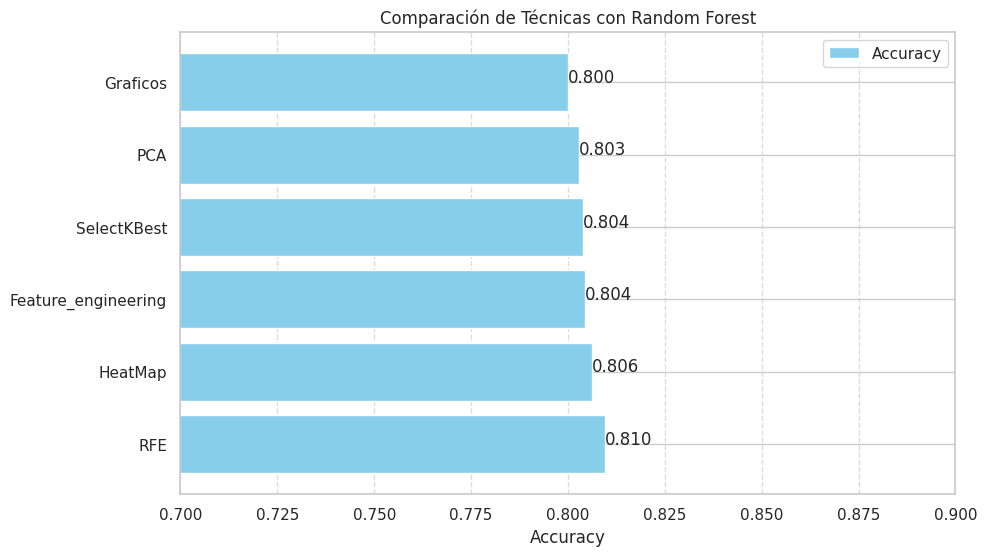

In [376]:
# Ordenar el DataFrame por Accuracy
df_sorted = metricas.sort_values(by='Accuracy', ascending=False)

# Configurar el gráfico de barras
plt.figure(figsize=(10, 6))

# Gráfico de barras para Accuracy
plt.barh(df_sorted['Técnica'], df_sorted['Accuracy'], color='skyblue', label='Accuracy')

# Añadir etiquetas
plt.xlabel('Accuracy')
plt.title('Comparación de Técnicas con Random Forest')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.xlim(0.7, 0.9)  # Ajusta los límites según tu rango de datos

# Mostrar valores encima de las barras
for index, value in enumerate(df_sorted['Accuracy']):
    plt.text(value, index, f"{value:.3f}")

plt.legend()
plt.show()

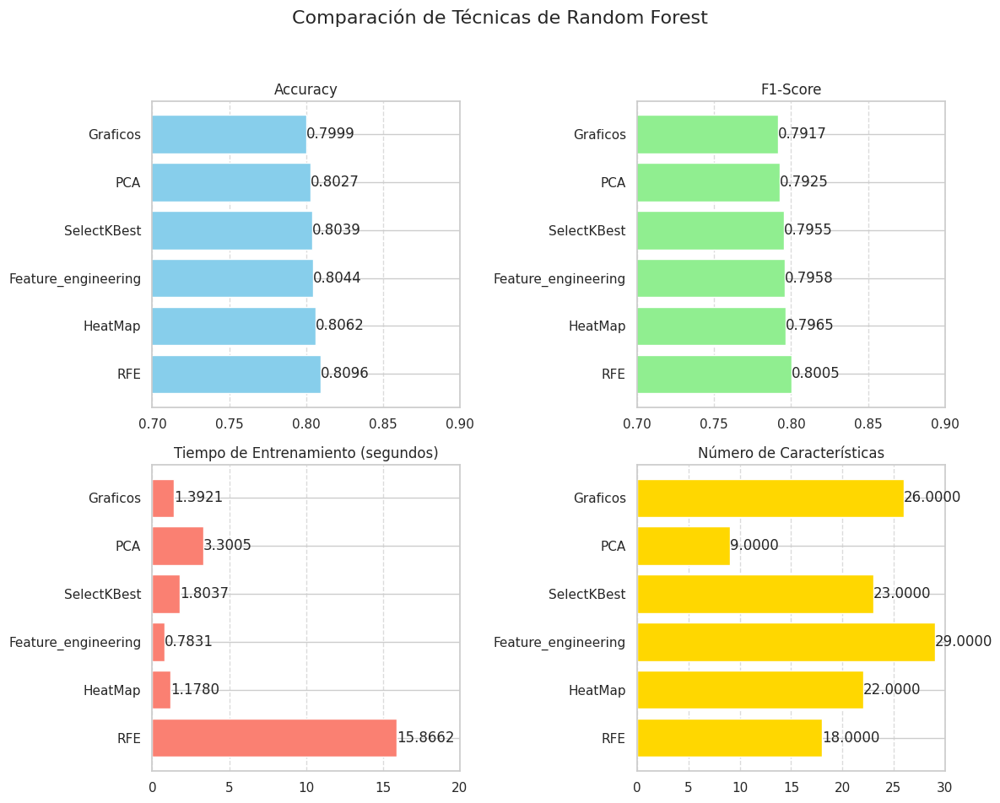

In [378]:
# Ordenar el DataFrame por Accuracy
df_sorted = metricas.sort_values(by='Accuracy', ascending=False)

# Crear subgráficos
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Comparación de Técnicas de Random Forest', fontsize=16)

# Gráfico 1: Accuracy
axs[0, 0].barh(df_sorted['Técnica'], df_sorted['Accuracy'], color='skyblue')
axs[0, 0].set_title('Accuracy')
axs[0, 0].set_xlim(0.7, 0.9)
axs[0, 0].grid(axis='x', linestyle='--', alpha=0.7)

# Gráfico 2: F1-Score
axs[0, 1].barh(df_sorted['Técnica'], df_sorted['F1-Score'], color='lightgreen')
axs[0, 1].set_title('F1-Score')
axs[0, 1].set_xlim(0.7, 0.9)
axs[0, 1].grid(axis='x', linestyle='--', alpha=0.7)

# Gráfico 3: Tiempo de entrenamiento
axs[1, 0].barh(df_sorted['Técnica'], df_sorted['Tiempo de entrenamiento'], color='salmon')
axs[1, 0].set_title('Tiempo de Entrenamiento (segundos)')
axs[1, 0].set_xlim(0, 20)  # Ajustar el límite según tus datos
axs[1, 0].grid(axis='x', linestyle='--', alpha=0.7)

# Gráfico 4: Número de características
axs[1, 1].barh(df_sorted['Técnica'], df_sorted['# de features'], color='gold')
axs[1, 1].set_title('Número de Características')
axs[1, 1].set_xlim(0, 30)  # Ajustar el límite según tus datos
axs[1, 1].grid(axis='x', linestyle='--', alpha=0.7)

# Mostrar valores en las barras (opcional)
for ax in axs.flat:
    for index, value in enumerate(ax.patches):
        ax.text(value.get_width(), value.get_y() + value.get_height()/2, f"{value.get_width():.4f}",
                va='center')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Ajustar el layout
plt.show()

# **6. CONCLUSIONES**